# Narrow-Band Surrogate Models
## ONR Integrated Stern

In [1]:
import functools
import pickle
import warnings
import os
import collections
import tqdm
import bjp
from bjp import *
from bjp import materials, units
import concurrent.futures
import impedances
import linear
import functools
import pandas

import sklearn.decomposition
import sklearn.preprocessing
import sklearn.neural_network
import sklearn.ensemble
import sklearn.model_selection
import sklearn.metrics
import sklearn.pipeline

import smt.surrogate_models

import lightgbm

import gzip

## Model

Implement frequency responses of the shaft is determined using a Timoshenko beam impedance-based substructure model.

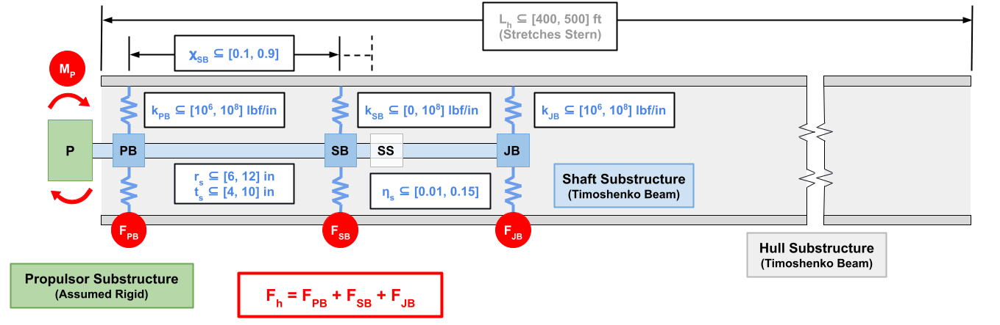

In [2]:
display_image('mass-elastic-model.png')

In [3]:
class Model:

    shaft = collections.namespace()
    hull = collections.namespace()

    hull.ro = units.to_mks(20, 'feet')  # hull outer radius, feet
    hull.material = materials.steel  # hull material
    th = units.to_mks(2, 'inches')  # hull thickness, inches
    hull.ri = hull.ro - th  # hull inner radius

    # propulsor inertias
    mp = units.to_mks(60000, 'lbm')  # prop mass
    rp = units.to_mks(16, 'feet')  # prop radius
    Ip = mp/4*rp**2  # prop mass moment of inertia

    # bearing masses
    mpb = units.to_mks(19286, 'lbm')  # prop bearing mass
    msb = units.to_mks(5000, 'lbm')  # stern bearing mass
    mjb = units.to_mks(48600, 'lbm')  # thrust bearing mass

    # axial position forward from prop
    xpb = units.to_mks(40, 'inches')  # axial location of prop bearing
    xfp2ss = units.to_mks(323.1, 'feet')  # fwd perpendicular to shaft seal
    xss2jb = units.to_mks(245, 'inches')  # shaft seal to journal bearing

    def __init__(
            self,
            eta_shaft=0.06,  # shaft material loss factor [0.01, 0.15]
            eta_foundations=0.1, # foundation material loss factor [0.01, 0.15]
            eta_hull=0.2,  # hull material loss factor including fluid [0.01, 0.15]
            krpb=1e7,  # prop bearing foundation stiffness, lbf/in
            krsb=1e7,  # stern bearing foundation stiffness, lbf/in
            chisb=0.9,  # stern bearing axial position, non-dimensional
            krjb=1e7,  # journal bearing foundation stiffness, lbf/in
            ris=8,  # shaft inner radius, inches
            ts=6,  # shaft thickness, inches
            material_shaft=materials.steel,  # shaft material
            Lh=400,  # hull length, ft
    ):
        # radial stiffness of prop bearing
        # range: 1e6 lbf/in, 1e8 lbf/in
        self.krpb = krpb = (1 + 1j*eta_foundations)*units.to_mks(krpb, 'lbf/in')
        # radial stiffness of stern bearing
        # range: 0 lbf/in, 1e8 lbf/in
        self.krsb = krsb = (1 + 1j*eta_foundations)*units.to_mks(krsb, 'lbf/in')
        # non-dimensional radial position of stern bearing
        # range: 0, 1
        self.chisb = chisb
        # radial stiffness of journal bearing
        # range: 1e6 lbf/in, 1e8 lbf/in
        self.krjb = krjb = (1 + 1j*eta_foundations)*units.to_mks(krjb, 'lbf/in')

        # shaft properties
        shaft = self.shaft
        shaft.material = material_shaft
        # shaft inner radius
        # range: 5 in, 12 in
        shaft.ri = units.to_mks(ris, 'inches')
        # shaft thickness
        # range: 1 in, 10 in
        shaft.t = units.to_mks(ts, 'inches')
        # shaft outer radius
        # range: 6 in, 22 in
        shaft.ro = shaft.ri + shaft.t
        # shaft material properties
        shaft.rho = shaft.material.rho
        shaft.E = (1 + 1j*eta_shaft)*shaft.material.E
        shaft.G = (1 + 1j*eta_shaft)*shaft.material.G
        shaft.nu = nu = shaft.material.nu
        ri = shaft.ri
        ro = shaft.ro
        shaft.A = pi*(ro**2 - ri**2)  # cross-sectional area
        shaft.J = pi/4*(ro**4 - ri**4)  # second moment of area
        # shear coefficient (Cowper 1966)
        shaft.kappa = 6*(1 + nu)*(1 + (ri/ro)**2)**2/((7 + 6*nu) *
            (1 + (ri/ro)**2)**2 + (20 + 12*nu)*(ri/ro)**2)

        # hull properties
        hull = self.hull
        # length of hull
        # range: 400 ft, 500 ft
        hull.L = Lh = units.to_mks(Lh, 'feet')
        # material properties
        hull.rho = hull.material.rho
        hull.E = (1 + 1j*eta_hull)*hull.material.E
        hull.G = (1 + 1j*eta_hull)*hull.material.G
        hull.nu = nu = hull.material.nu
        ri = hull.ri
        ro = hull.ro
        hull.A = pi*(ro**2 - ri**2)  # cross-sectional area
        hull.J = pi/4*(ro**4 - ri**4)  # second moment of area
        # shear coefficient (Cowper 1966)
        hull.kappa = 6*(1 + nu)*(1 + (ri/ro)**2)**2/((7 + 6*nu) *
            (1 + (ri/ro)**2)**2 + (20 + 12*nu)*(ri/ro)**2)

        # compute lengths
        self.xp = 0  # axial position of prop hub
        # axial position of prop bearing (static; defined as class variable)
        xpb = self.xpb
        self.xss = xss = Lh - self.xfp2ss  # axial position of shaft seal
        # axial position of stern bearing
        self.xsb = xsb = xpb + chisb*(xss - xpb)
        self.xjb = xjb = xss + self.xss2jb  # axial position of journal bearing
        shaft.L = Ls = xjb  # shaft length

    def frfs(self, f, *args, **kwargs):
        return toolz.merge_with(
            numpy.asarray, [self.solve(fi, *args, **kwargs) for fi in f]
        )

    def decouple_foundations(self):
        self.decouple_foundation_stiffnesses()
        self.decouple_foundation_inertias()

    def decouple_foundation_stiffnesses(self):
        self.krpb = 0
        self.krsb = 0
        self.krjb = 0

    def decouple_foundation_inertias(self):
        self.mp = 0
        self.Ip = 0
        self.mpb = 0
        self.msb = 0
        self.mjb = 0

    def solve(self, f, Mp=1, Fp=0):
        omega = 2*pi*f
        vt = {
            'Ps': linear.Variable('vt[Ps]'),
            'Ah': linear.Variable('vt[Ah]'),
            'PBs': linear.Variable('vt[PBs]'),
            'PBh': linear.Variable('vt[PBh]'),
            'SBs': linear.Variable('vt[SBs]'),
            'SBh': linear.Variable('vt[SBh]'),
            'JBs': linear.Variable('vt[JBs]'),
            'JBh': linear.Variable('vt[JBh]'),
            'Fh': linear.Variable('vt[Fh]'),
        }
        φt = {
            'Ps': linear.Variable('φt[Ps]'),
            'Ah': linear.Variable('φt[Ah]'),
            'PBs': linear.Variable('φt[PBs]'),
            'PBh': linear.Variable('φt[PBh]'),
            'SBs': linear.Variable('φt[SBs]'),
            'SBh': linear.Variable('φt[SBh]'),
            'JBs': linear.Variable('φt[JBs]'),
            'JBh': linear.Variable('φt[JBh]'),
            'Fh': linear.Variable('φt[Fh]'),
        }
        equations = []
        # radial impedances
        Z = {}
        Z['mp'] = impedances.mass(omega, self.mp)  # prop mass
        # prop mass moment of inertia
        Z['Ip'] = impedances.mass(omega, self.Ip)
        Z['s[P-PB]'] = impedances.beam.lateral(
            omega, self.xpb - 0, self.shaft.rho, self.shaft.E, self.shaft.J,
            self.shaft.kappa, self.shaft.A, self.shaft.G,
        )  # shaft segment (hub to prop bearing)
        Z['mpb'] = impedances.mass(omega, self.mpb)  # prop bearing mass
        Z['kpb'] = impedances.spring(
            omega, self.krpb
        )  # prop bearing foundation radial spring
        Z['s[PB-SB]'] = impedances.beam.lateral(
            omega, self.xsb - self.xpb, self.shaft.rho, self.shaft.E, self.shaft.J,
            self.shaft.kappa, self.shaft.A, self.shaft.G,
        )  # shaft segment (prob bearing to stern bearing)
        Z['msb'] = impedances.mass(omega, self.msb)  # stern bearing mass
        Z['ksb'] = impedances.spring(
            omega, self.krsb
        )  # stern bearing foundation radial spring
        Z['s[SB-JB]'] = impedances.beam.lateral(
            omega, self.xjb - self.xsb, self.shaft.rho, self.shaft.E,
            self.shaft.J, self.shaft.kappa, self.shaft.A, self.shaft.G,
        )  # shaft segment (stern bearing to journal bearing)
        Z['mjb'] = impedances.mass(omega, self.mjb)  # journal bearing mass
        Z['kjb'] = impedances.spring(
            omega, self.krjb
        )  # thrust bearing foundation radial spring
        Z['h[A-PB]'] = impedances.beam.lateral(
            omega, self.xpb - 0, self.hull.rho, self.hull.E, self.hull.J,
            self.hull.kappa, self.hull.A, self.hull.G,
        )  # hull segment (aft perpendicular to prop bearing)
        Z['h[PB-SB]'] = impedances.beam.lateral(
            omega, self.xsb - self.xpb, self.hull.rho, self.hull.E,
            self.hull.J, self.hull.kappa, self.hull.A, self.hull.G,
        )  # hull segment (prop bearing to stern bearing)
        Z['h[SB-JB]'] = impedances.beam.lateral(
            omega, self.xjb - self.xsb, self.hull.rho, self.hull.E, self.hull.J,
            self.hull.kappa, self.hull.A, self.hull.G,
        )  # hull segment (stern bearing to journal bearing)
        Z['h[JB-F]'] = impedances.beam.lateral(
            omega, self.hull.L - self.xjb, self.hull.rho, self.hull.E, self.hull.J,
            self.hull.kappa, self.hull.A, self.hull.G,
        )  # hull segment (stern bearing to journal bearing)
        # vertical forces and moments
        # y displacements, moments about z
        # dof: v and φ
        R = {}
        # shaft forces and moments
        R['Fs[P | PB]'], R['Ms[P | PB]'], R['Fs[PB | P]'], R['Ms[PB | P]'] = \
            Z['s[P-PB]'] @ [vt['Ps'], φt['Ps'], vt['PBs'], φt['PBs']]
        R['Fs[PB | SB]'], R['Ms[PB | SB]'], R['Fs[SB | PB]'], R['Ms[SB | PB]'] = \
            Z['s[PB-SB]'] @ [vt['PBs'], φt['PBs'], vt['SBs'], φt['SBs']]
        R['Fs[SB | JB]'], R['Ms[SB | JB]'], R['Fs[JB | SB]'], R['Ms[JB | SB]'] = \
            Z['s[SB-JB]'] @ [vt['SBs'], φt['SBs'], vt['JBs'], φt['JBs']]
        # foundation forces
        R['Fk[PB | H]'], R['Fk[H | PB]'] = Z['kpb'] @ [vt['PBs'], vt['PBh']]
        R['Fk[SB | H]'], R['Fk[H | SB]'] = Z['ksb'] @ [vt['SBs'], vt['SBh']]
        R['Fk[JB | H]'], R['Fk[H | JB]'] = Z['kjb'] @ [vt['JBs'], vt['JBh']]
        R['Fk[H]'] = R['Fk[H | PB]'] + R['Fk[H | SB]'] + R['Fk[H | JB]']
        # inertial forces
        R['Fm[P]'] = Z['mp'] * vt['Ps']
        R['Mm[P]'] = Z['Ip'] * φt['Ps']
        R['Fm[PB]'] = Z['mpb'] * vt['PBs']
        R['Fm[SB]'] = Z['msb'] * vt['SBs']
        R['Fm[JB]'] = Z['mjb'] * vt['JBs']
        # hull forces
        R['Fh[A | PB]'], R['Mh[A | PB]'], R['Fh[PB | A]'], R['Mh[PB | A]'] = \
            Z['h[A-PB]'] @ [vt['Ah'], φt['Ah'], vt['PBh'], φt['PBh']]
        R['Fh[PB | SB]'], R['Mh[PB | SB]'], R['Fh[SB | PB]'], R['Mh[SB | PB]'] = \
            Z['h[PB-SB]'] @ [vt['PBh'], φt['PBh'], vt['SBh'], φt['SBh']]
        R['Fh[SB | JB]'], R['Mh[SB | JB]'], R['Fh[JB | SB]'], R['Mh[JB | SB]'] = \
            Z['h[SB-JB]'] @ [vt['SBh'], φt['SBh'], vt['JBh'], φt['JBh']]
        R['Fh[JB | F]'], R['Mh[JB | F]'], R['Fh[F | JB]'], R['Mh[F | JB]'] = \
            Z['h[JB-F]'] @ [vt['JBh'], φt['JBh'], vt['Fh'], φt['Fh']]
        # force and moment dynamic equlibrium
        # shaft
        ## propulsor
        equations.append(
            R['Fs[P | PB]'] + R['Fm[P]'] - Fp
        )
        equations.append(
            R['Ms[P | PB]'] + R['Mm[P]'] - Mp
        )
        ## prop bearing
        equations.append(
            R['Fs[PB | P]'] + R['Fs[PB | SB]'] + R['Fk[PB | H]'] + R['Fm[PB]']
        )
        equations.append(
            R['Ms[PB | P]'] + R['Ms[PB | SB]']
        )
        ## stern bearing
        equations.append(
            R['Fs[SB | PB]'] + R['Fs[SB | JB]'] + R['Fk[SB | H]'] + R['Fm[SB]']
        )
        equations.append(
            R['Ms[SB | PB]'] + R['Ms[SB | JB]']
        )
        ## journal bearing
        equations.append(
            R['Fs[JB | SB]'] + R['Fk[JB | H]'] + R['Fm[JB]']
        )
        equations.append(
            R['Ms[JB | SB]']
        )
        # hull
        ## aft
        equations.append(
            R['Fh[A | PB]']
        )
        equations.append(
            R['Mh[A | PB]']
        )
        ## prop bearing
        equations.append(
            R['Fh[PB | A]'] + R['Fh[PB | SB]'] + R['Fk[H | PB]']
        )
        equations.append(
            R['Mh[PB | A]'] + R['Mh[PB | SB]']
        )
        ## stern bearing
        equations.append(
            R['Fh[SB | PB]'] + R['Fh[SB | JB]'] + R['Fk[H | SB]']
        )
        equations.append(
            R['Mh[SB | PB]'] + R['Mh[SB | JB]']
        )
        ## journal bearing
        equations.append(
            R['Fh[JB | SB]'] + R['Fh[JB | F]'] + R['Fk[H | JB]']
        )
        equations.append(
            R['Mh[JB | SB]'] + R['Mh[JB | F]']
        )
        ## forward
        equations.append(
            R['Fh[F | JB]']
        )
        equations.append(
            R['Mh[F | JB]']
        )
        solution_by_variable = linear.solve(equations)
        # rollup solution
        solution = {}
        for variable, value in solution_by_variable.items():
            solution[variable.name] = value
            solution[variable.name.replace('vt', 'v').replace('φt', 'φ')] = value/(1j*omega)
        for variable, value in R.items():
            solution[variable] = value.subs(solution_by_variable)
        return solution


def frf_from_sample(sample, f):
    model = Model(**sample)
    frfs = model.frfs(f, Mp=1)
    Fcoh = frfs['Fk[H | PB]'] + frfs['Fk[H | SB]'] + frfs['Fk[H | JB]']
    return Fcoh
    #return frfs['v[JBh]']


def frfs_from_samples(samples, f=None):
    if f is None:
        f = numpy.logspace(0, 2, 300)
    results = numpy.zeros((len(samples), len(f)), dtype=complex)
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = {}
        for i, sample in enumerate(samples):
            future = executor.submit(frf_from_sample, f=f, sample=sample)
            futures[future] = i
        for future in tqdm.tqdm(concurrent.futures.as_completed(futures), total=len(futures)):
            i = futures[future]
            results[i, :] = future.result()
    return results

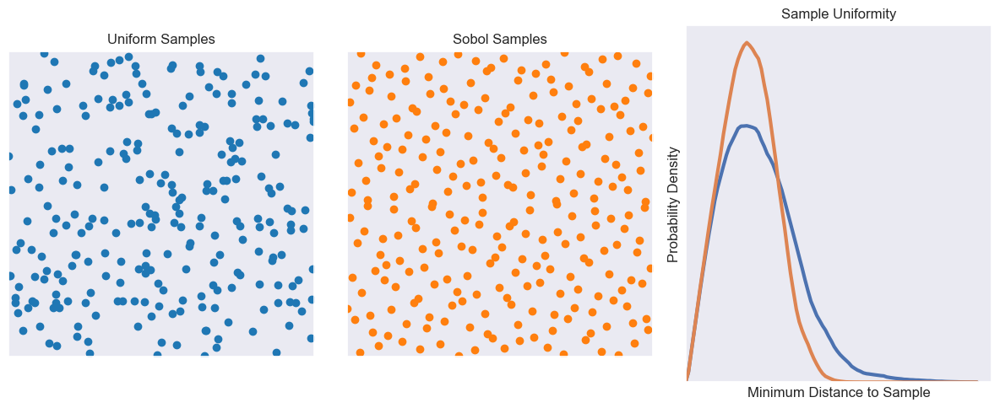

In [4]:
sobol_samples = numpy.random.sobol(256, d=2)
uniform_samples = numpy.random.uniform(size=(256, 2))

fig, ax = mpl.subplots(1, 3, figsize=(12, 5))
ax[0].title.set_text('Uniform Samples')
ax[0].scatter(uniform_samples[:, 0], uniform_samples[:, 1], c='tab:blue', label='Uniform')
ax[0].set_xlim(0, 1)
ax[0].set_ylim(0, 1)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_aspect('equal')
ax[1].title.set_text('Sobol Samples')
ax[1].set_xlim(0, 1)
ax[1].set_ylim(0, 1)
ax[1].set_aspect('equal')
ax[1].scatter(sobol_samples[:, 0], sobol_samples[:, 1], c='tab:orange', label='Sobol')
ax[1].set_xticks([])
ax[1].set_yticks([])

x, y = numpy.meshgrid(numpy.linspace(0, 1, 1000), numpy.linspace(0, 1, 1000))
grid_samples = numpy.column_stack((x.flatten(), y.flatten()))
Duniform = scipy.spatial.distance.cdist(uniform_samples, grid_samples).min(axis=0)
Dsobol = scipy.spatial.distance.cdist(sobol_samples, grid_samples).min(axis=0)
bins = numpy.linspace(0, 0.125, 101)
p, e = numpy.histogram(Duniform, bins=bins, density=True)
ax[2].plot(e, [0, *p], label='Uniform', lw=3)
p, e = numpy.histogram(Dsobol, bins=bins, density=True)
ax[2].plot(e, [0, *p], label='Sobol', lw=3)
#ax[2].hist(Duniform, bins=bins, label='Uniform', lw=3, histtype='step')
#ax[2].hist(Dsobol, bins=bins, label='Sobol', lw=3, histtype='step')
#sbn.kdeplot(Duniform, label='Uniform', ax=ax[2], lw=3)
#sbn.kdeplot(Dsobol, label='Sobol', ax=ax[2], lw=3)
ax[2].title.set_text('Sample Uniformity')
ax[2].set_xlabel('Minimum Distance to Sample')
ax[2].set_ylabel('Probability Density')
ax[2].set_xticks([])
ax[2].set_yticks([])
ax[2].set_xlim(0, )
ax[2].set_ylim(0, )
fig.tight_layout()
mpl.savefig('sobol.png', dpi=300)
mpl.show()

In [5]:
SAMPLE_KEYS = [
    'eta_shaft',
    'krpb',
    'krsb',
    'chisb',
    'krjb',
    'ris',
    'ts',
    'Lh',
]
USAMPLE_KEYS = ['u' + key for key in SAMPLE_KEYS]
if False:
    Nf = 1000
    f = numpy.logspace(0, 2, Nf)
    Ns = 256
    Ls = numpy.linspace(400, 500, Ns)
    frfs_by_L = frfs_from_samples(f=f, samples=[{'Lh': Li} for Li in Ls])
    samples_ranges = [
        (0.01, 0.15),  # eta_shaft
        (1e6, 1e8), # krpb
        #(6, 8),  # log10(krpb)
        (0, 1e8), # krsb
        #(0, 8),  # log10(krsb)
        (0.1, 0.9),  # chisb
        (1e6, 1e8), # krjb
        #(6, 8),  # log10(krjb)
        (6, 12),  # ris
        (4, 10),  # ts
        (400, 500),  # Lh
    ]
    samples_train, usamples_train = numpy.random.sobol(N=Ns, ranges=samples_ranges)
    #samples_train[:, 1] = 10**samples_train[:, 1]
    #samples_train[:, 2] = 10**samples_train[:, 2]
    #samples_train[:, 4] = 10**samples_train[:, 4]
    frfs_train = frfs_from_samples(
        f=f, samples=[dict(zip(SAMPLE_KEYS, sample)) for sample in samples_train]
    )
    df_train = pandas.DataFrame()
    df_train[SAMPLE_KEYS] = samples_train
    df_train[USAMPLE_KEYS] = usamples_train
    df_train['frf'] = [frf for frf in frfs_train]
    df_train['f'] = [f for _ in frfs_train]
    df_train['abs(frf)'] = [numpy.abs(frf) for frf in frfs_train]
    df_train['db(frf)'] = [numpy.db(frf) for frf in frfs_train]
    df_train['angle(frf)'] = [numpy.unwrap(numpy.angle(frf)) for frf in frfs_train]
    samples_validate, usamples_validate = numpy.random.sobol(N=2*Ns, ranges=samples_ranges)
    #samples_validate[:, 1] = 10**samples_validate[:, 1]
    #samples_validate[:, 2] = 10**samples_validate[:, 2]
    #samples_validate[:, 4] = 10**samples_validate[:, 4]
    frfs_validate = frfs_from_samples(
        f=f, samples=[dict(zip(SAMPLE_KEYS, sample)) for sample in samples_validate]
    )
    df_validate = pandas.DataFrame()
    df_validate[SAMPLE_KEYS] = samples_validate
    df_validate[USAMPLE_KEYS] = usamples_validate
    df_validate['frf'] = [frf for frf in frfs_validate]
    df_validate['f'] = [f for _ in frfs_validate]
    df_validate['abs(frf)'] = [numpy.abs(frf) for frf in frfs_validate]
    df_validate['db(frf)'] = [numpy.db(frf) for frf in frfs_validate]
    df_validate['angle(frf)'] = [numpy.unwrap(numpy.angle(frf)) for frf in frfs_validate]
    # persist
    df_train.to_pickle('df_train.pkl.gz')
    df_validate.to_pickle('df_validate.pkl.gz')
    numpy.savez_compressed(
        'frfs.npz', f=f, Ls=Ls, frfs_by_L=frfs_by_L,
        samples_train=samples_train, usamples_train=usamples_train, frfs_train=frfs_train,
        samples_validate=samples_validate, usamples_validate=usamples_validate, frfs_validate=frfs_validate,
    )
else:
    data = numpy.load('frfs.npz')
    f = data['f']
    Nf = len(f)
    Ls = data['Ls']
    Ns = len(Ls)
    frfs_by_L = data['frfs_by_L']
    samples_train = data['samples_train']
    usamples_train = data['usamples_train']
    frfs_train = data['frfs_train']
    samples_validate = data['samples_validate']
    usamples_validate = data['usamples_validate']
    frfs_validate = data['frfs_validate']
    df_train = pandas.read_pickle('df_train.pkl.gz')
    df_validate = pandas.read_pickle('df_validate.pkl.gz')
    del data

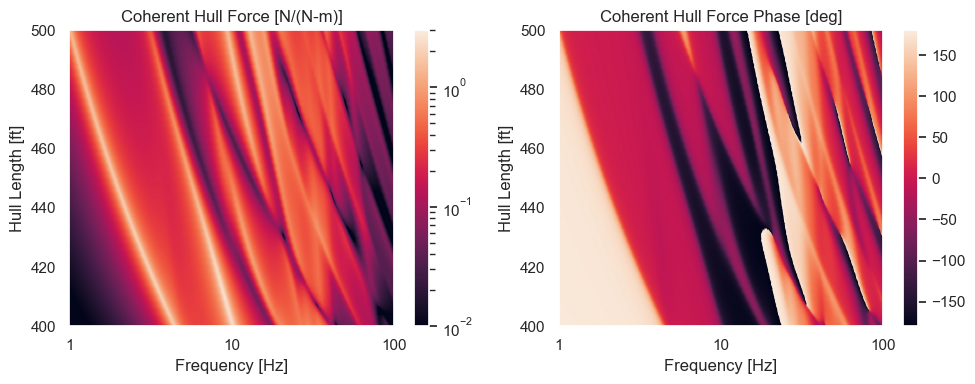

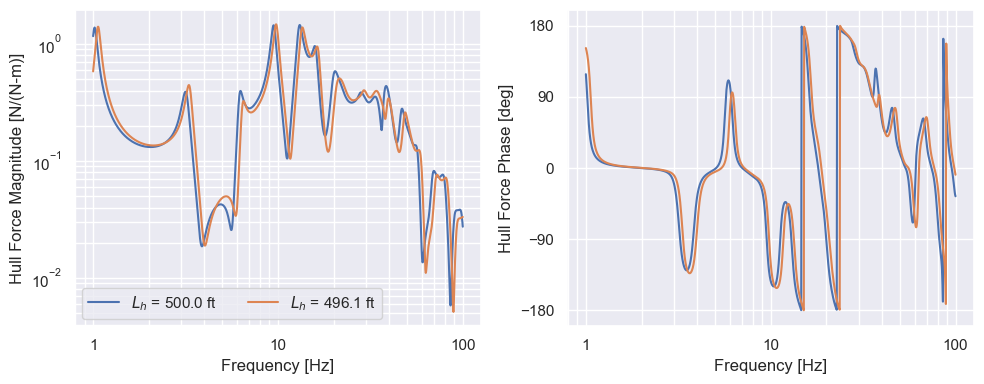

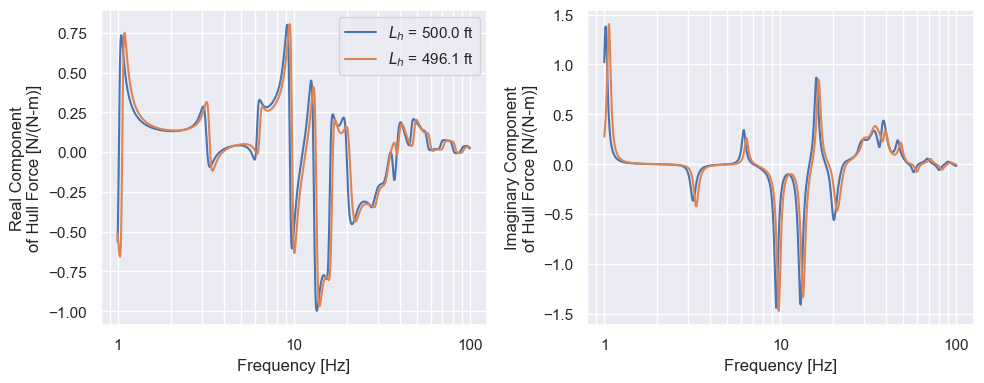

In [6]:
mpl.figure(figsize=(10, 4))
mpl.subplot(1, 2, 1)
mpl.pcolormesh(
    f, Ls, abs(frfs_by_L), shading='gouraud',
    norm=matplotlib.colors.LogNorm(vmin=1e-2, vmax=3), #vmin=Hs.min(), vmax=Hs.max())
)
mpl.colorbar()
mpl.title('Coherent Hull Force [N/(N-m)]')
mpl.xscale('log')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Length [ft]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.subplot(1, 2, 2)
mpl.pcolormesh(f, Ls, numpy.angle(frfs_by_L, deg=True), shading='gouraud')
mpl.colorbar()
mpl.title('Coherent Hull Force Phase [deg]')
mpl.xscale('log')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Length [ft]')
mpl.clim(-180, 180)
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.tight_layout()
mpl.show()

i0 = -1
i1 = -11

mpl.figure(figsize=(10, 4))
mpl.subplot(1, 2, 1)
mpl.loglog(f, abs(frfs_by_L[i0, :]), label=f'$L_h$ = {Ls[i0]:.1f} ft')
mpl.loglog(f, abs(frfs_by_L[i1, :]), label=f'$L_h$ = {Ls[i1]:.1f} ft')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.legend(ncols=2)
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.grid(True, which='both')
mpl.subplot(1, 2, 2)
mpl.semilogx(f, numpy.angle(frfs_by_L[i0, :], deg=True), label=f'$L_h$ = {Ls[i0]:.1f} ft')
mpl.semilogx(f, numpy.angle(frfs_by_L[i1, :], deg=True), label=f'$L_h$ = {Ls[i1]:.1f} ft')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Phase [deg]')
mpl.ylim(-200, 200)
mpl.yticks([-180, -90, 0, 90, 180])
mpl.grid(True, which='both')
mpl.tight_layout()
mpl.show()

mpl.figure(figsize=(10, 4))
mpl.subplot(1, 2, 1)
mpl.semilogx(f, frfs_by_L[i0, :].real, label=f'$L_h$ = {Ls[i0]:.1f} ft')
mpl.semilogx(f, frfs_by_L[i1, :].real, label=f'$L_h$ = {Ls[i1]:.1f} ft')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Real Component\nof Hull Force [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.legend()
mpl.grid(True, which='both')
mpl.subplot(1, 2, 2)
mpl.semilogx(f, frfs_by_L[i0, :].imag, label=f'$L_h$ = {Ls[i0]:.1f} ft')
mpl.semilogx(f, frfs_by_L[i1, :].imag, label=f'$L_h$ = {Ls[i1]:.1f} ft')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Imaginary Component\nof Hull Force [N/(N-m)]')
mpl.grid(True, which='both')
mpl.tight_layout()
mpl.show()

256it [00:30,  8.37it/s]


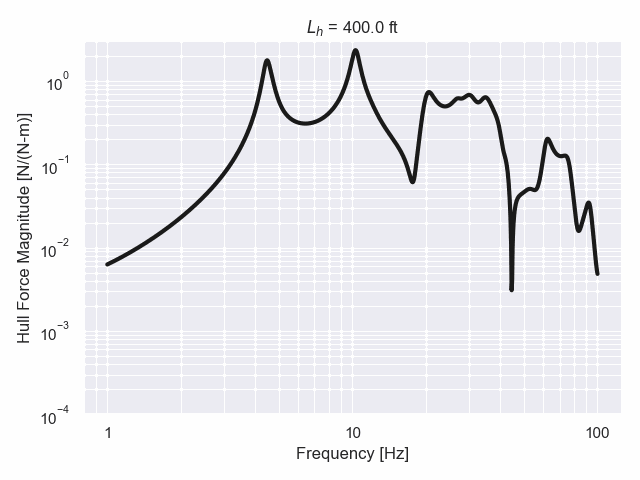

In [7]:
gif = mpl.AnimatedGif()
fig = mpl.figure()
axis = mpl.gca()
for i, (Li, frf) in tqdm.tqdm(enumerate(zip(Ls, frfs_by_L))):
    mpl.title(f'$L_h$ = {Li:.1f} ft')
    mpl.loglog(f, abs(frf), c='k', lw=3)
    mpl.ylim(1e-4, 3)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    if i == 0:
        fig.tight_layout()
    gif.add_frame(fig)
    axis.clear()

mpl.close(fig)
gif.save('length-variation.gif', duration=0.05, loop=-1)
display_image('length-variation.gif')

In [8]:
SAMPLE_INDICES = [53, 135, 218]

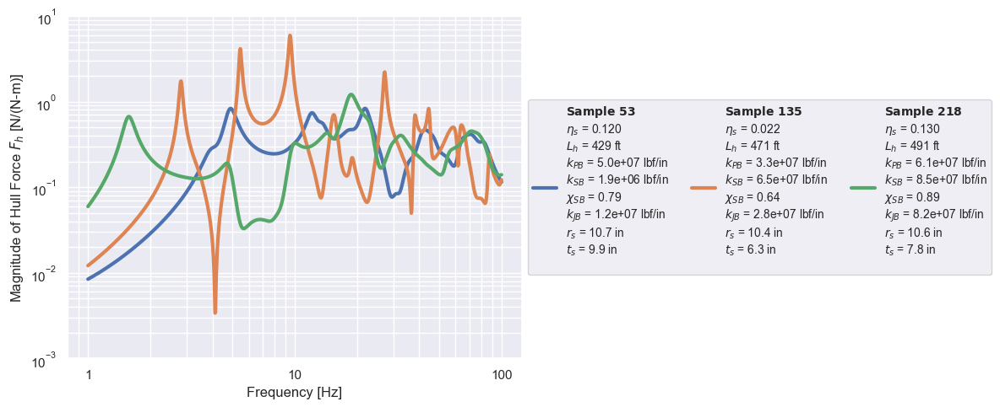

In [9]:
mpl.figure(figsize=(12, 5))
for i in SAMPLE_INDICES:
    sample = samples_validate[i]
    mpl.loglog(
        f, abs(frfs_validate[i, :]), lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Magnitude of Hull Force $F_h$ [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.ylim(1e-3, 10)
mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.savefig('validation-samples-all.png', dpi=300)
mpl.show()

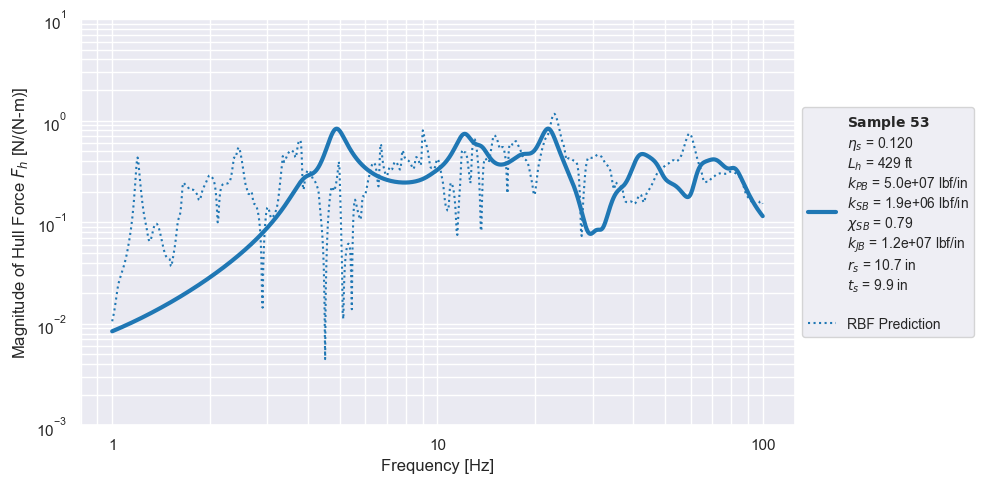

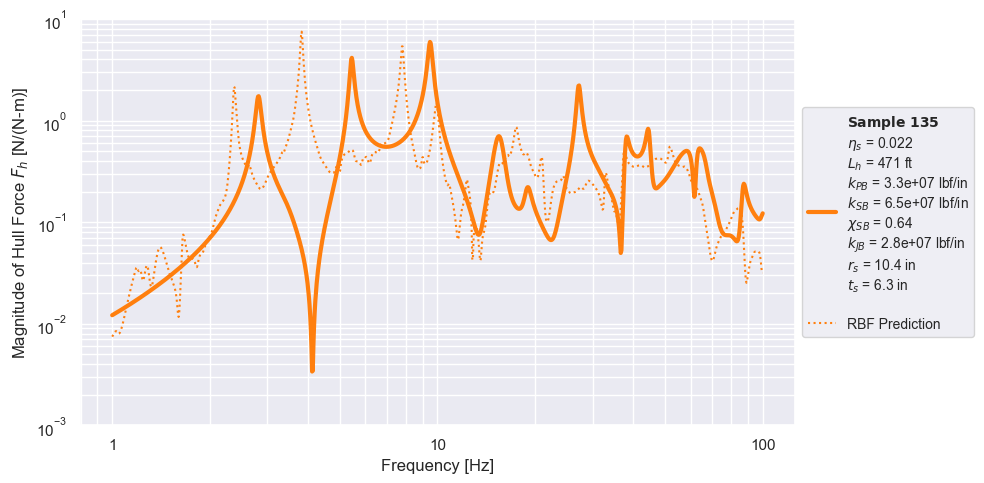

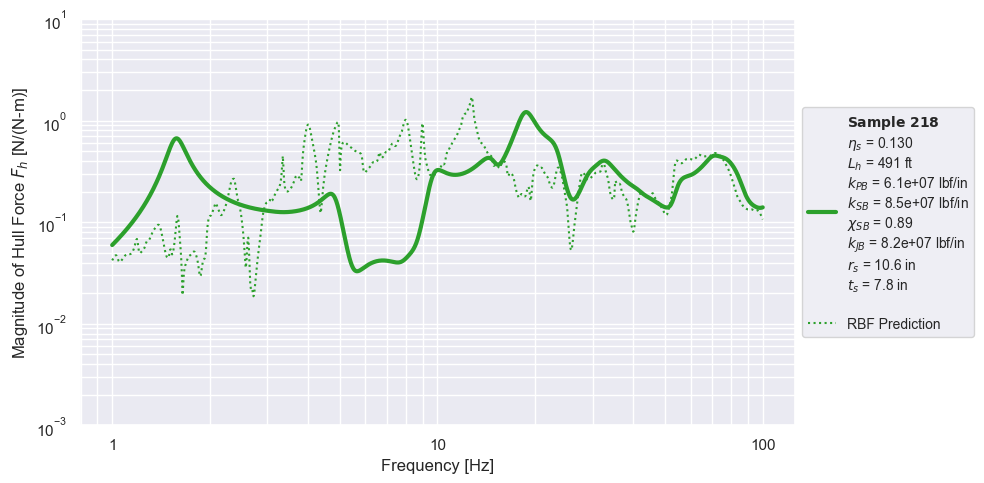

In [10]:
rbf = scipy.interpolate.RBFInterpolator(samples_train, frfs_train)
frfp_rbf = rbf(samples_validate)

for i, c in zip(SAMPLE_INDICES, ('tab:blue', 'tab:orange', 'tab:green')):
    sample = samples_validate[i]
    frf = frfs_validate[i, :]
    mpl.figure(figsize=(10, 5))
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    mpl.loglog(f, abs(frfp_rbf[i, :]), ':', c=c, label='RBF Prediction')
    mpl.ylim(1e-3, 10)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Magnitude of Hull Force $F_h$ [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=1, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    mpl.savefig(f'rbf-{i}.png', dpi=300)
    mpl.show()

In [11]:
class ComplexComponents:

    def fit(self, x):
        pass

    def transform(self, x):
        x = asarray(x)
        return numpy.column_stack([x.real, x.imag])

    def fit_transform(self, x):
        return self.transform(x)

    def inverse_transform(self, x):
        x = asarray(x)
        N, M = x.shape
        return x[:, :M//2] + 1j*x[:, M//2:]

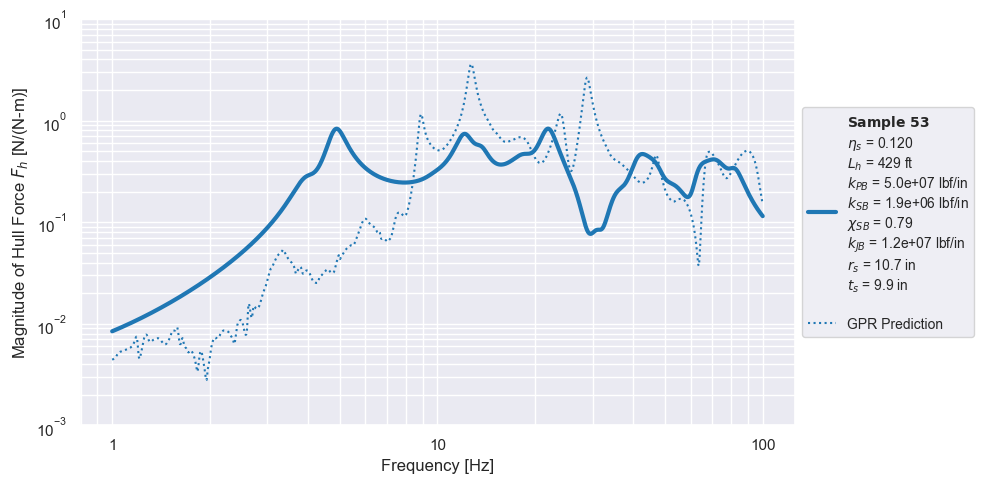

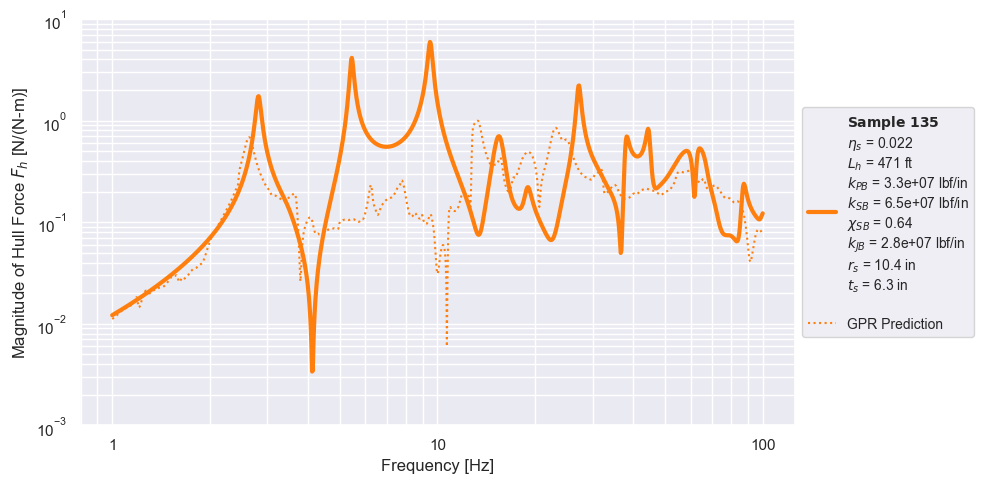

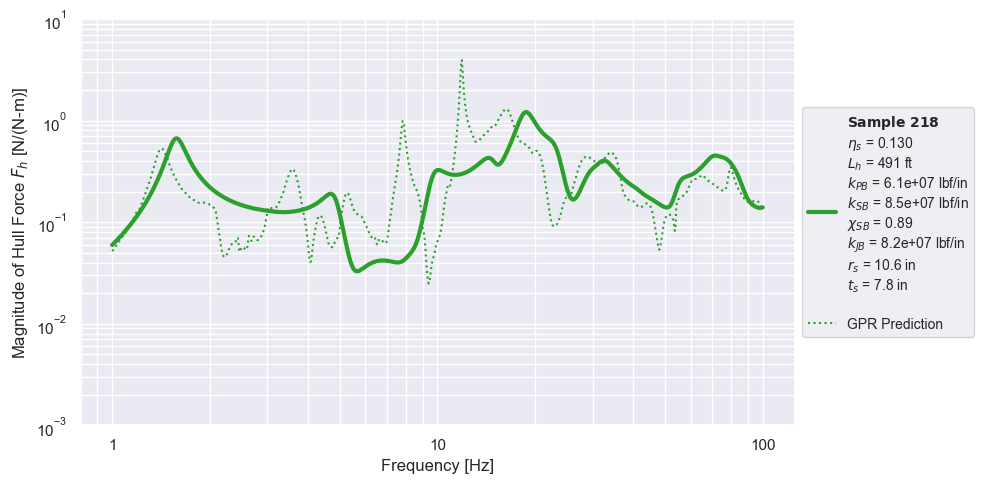

In [12]:
scaler = sklearn.preprocessing.StandardScaler()
complex_components = ComplexComponents()
y = scaler.fit_transform(complex_components.fit_transform(frfs_train))
gpr = smt.surrogate_models.KPLS(print_global=False)
gpr.set_training_values(samples_train, y)
gpr.train()
frfp_gpr = complex_components.inverse_transform(
    scaler.inverse_transform(
        gpr.predict_values(samples_validate)
    )
)

for i, c in zip(SAMPLE_INDICES, ('tab:blue', 'tab:orange', 'tab:green')):
    sample = samples_validate[i]
    frf = frfs_validate[i, :]
    mpl.figure(figsize=(10, 5))
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    mpl.loglog(f, abs(frfp_gpr[i, :]), ':', c=c, label='GPR Prediction')
    mpl.ylim(1e-3, 10)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Magnitude of Hull Force $F_h$ [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=1, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    mpl.savefig(f'gpr-{i}.png', dpi=300)
    mpl.show()

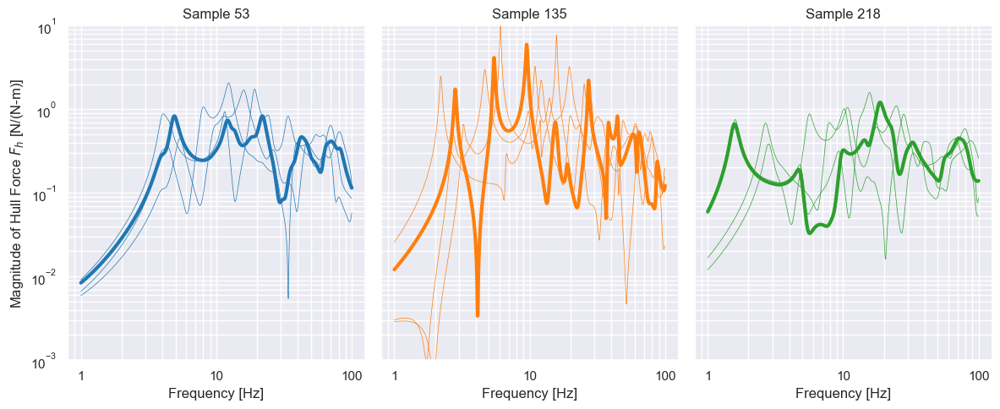

In [13]:
Dd = scipy.spatial.distance.cdist(usamples_validate, usamples_validate)
Dd += numpy.diag(numpy.inf*numpy.ones(len(usamples_validate)))
k = Dd.argsort(axis=1)
fig, axes = mpl.subplots(1, 3, figsize=(12, 5), sharey=True)
for j, (i, c) in enumerate(zip(SAMPLE_INDICES, ('tab:blue', 'tab:orange', 'tab:green'))):
    sample = samples_validate[i]
    frf = frfs_validate[i, :]
    axes[j].loglog(f, abs(frf), c=c, lw=3)
    axes[j].loglog(f, abs(frfs_validate[k[i, :3], :]).T, c=c, lw=0.5)
    axes[j].set_title(f'Sample {i}')
    axes[j].grid(True, which='both')
    axes[j].set_xlabel('Frequency [Hz]')
    axes[j].xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    axes[j].set_ylim(1e-3, 10)
axes[0].set_ylabel('Magnitude of Hull Force $F_h$ [N/(N-m)]')
fig.tight_layout()
mpl.savefig('nearest-designs.png', dpi=300)
mpl.show()

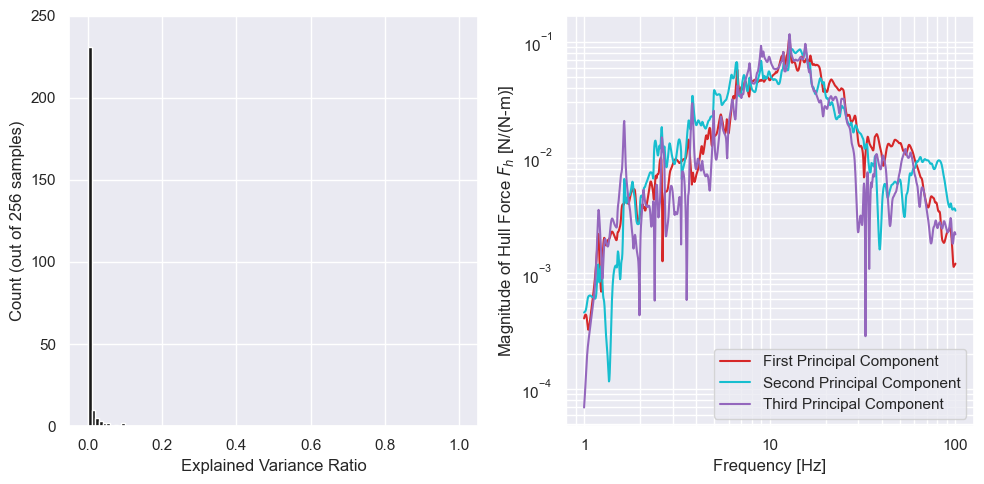

In [14]:
complex_components = ComplexComponents()
pca = sklearn.decomposition.PCA(n_components=len(frfs_train))
pca.fit(complex_components.fit_transform(frfs_train))
components = complex_components.inverse_transform(pca.components_)

fig, axes = mpl.subplots(1, 2, figsize=(10, 5))
axes[0].hist(pca.explained_variance_ratio_, numpy.linspace(0, 1, 101), color='k')
axes[0].set_xlabel('Explained Variance Ratio')
axes[0].set_ylabel(f'Count (out of {len(frfs_train)} samples)')
axes[0].set_ylim(0, 250)
axes[1].loglog(f, abs(components[0, :]), c='tab:red', label='First Principal Component')
axes[1].loglog(f, abs(components[1, :]), c='tab:cyan', label='Second Principal Component')
axes[1].loglog(f, abs(components[2, :]), c='tab:purple', label='Third Principal Component')
axes[1].grid(True, which='both')
axes[1].set_xlabel('Frequency [Hz]')
axes[1].set_ylabel('Magnitude of Hull Force $F_h$ [N/(N-m)]')
axes[1].xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
axes[1].legend()
fig.tight_layout()
mpl.savefig('pca.png', dpi=300)
mpl.show()

In [15]:
class BarycentricRationalInterpolator:

    def __init__(self, zj, fj, wj):
        self.zj = numpy.asarray(zj)
        self.fj = numpy.asarray(fj)
        self.wj = numpy.asarray(wj)
        assert self.zj.ndim == self.fj.ndim == self.wj.ndim == 1
        assert self.zj.size == self.fj.size == self.wj.size
        self.M = len(zj)

    def __call__(self, z):
        zj = self.zj
        fj = self.fj
        wj = self.wj
        Cd = z[:, None] - zj[None, :]
        ij, jj = numpy.nonzero(Cd == 0)
        Cd[ij, jj] = 1
        C = 1/Cd
        f = C.dot(wj*fj)/C.dot(wj)
        f[ij] = fj[jj]
        return f

    def __len__(self):
        return self.M

    @functools.cached_property
    def poles(self):
        zj = self.zj
        wj = self.wj
        B = numpy.eye(len(wj) + 1)
        B[0, 0] = 0
        E = numpy.block([
            [0, wj],
            [numpy.ones((self.M, 1)), numpy.diag(zj)]
        ])
        p = scipy.linalg.eigvals(E, B)
        return numpy.real_if_close(p[numpy.isfinite(p)])

    @functools.cached_property
    def residues(self):
        poles = self.poles
        # compute residues via formula for simple poles using L'Hôpital's rule
        # to evaluate the limit
        ## cf: https://en.wikipedia.org/wiki/Residue_(complex_analysis)#Simple_poles
        zj = self.zj
        fj = self.fj
        wj = self.wj
        C = 1/(poles[:, None] - zj[None, :])
        n = C.dot(fj*wj)
        d = (-C**2).dot(wj)
        residues = n/d
        return residues

    def polres(self):
        return self.poles, self.residues

    @classmethod
    def aaa(cls, z, f, tol=1e-13, M=None, Mmax=200):
        inf = numpy.inf
        z = numpy.asarray(z)
        f = numpy.asarray(f)
        assert z.ndim == f.ndim == 1
        assert z.size == f.size
        N = len(z)
        j = []
        e = []
        hist = []
        k = list(range(N))
        fm = f.mean()*numpy.ones(N)
        r = f - fm
        e.append(numpy.linalg.norm(r, inf))
        rtol = tol*numpy.linalg.norm(f, inf)
        hist.append({
            'j': j.copy(),
            'k': k.copy(),
            'e': e.copy(),
            'f': fm.copy(),
            'r': r.copy(),
        })
        if M is not None:
            Mmax = M
        for m in range(Mmax):
            jm = numpy.argmax(abs(r))
            j.append(jm)
            k.remove(jm)
            C = 1/(z[k, None] - z[None, j])
            A = (f[k, None] - f[None, j])*C
            _, _, Vh = numpy.linalg.svd(A)
            wj = Vh[-1, :].conj()
            wj = wj
            n = C.dot(wj*f[j])
            d = C.dot(wj)
            fm = f.copy()
            fm[k] = n/d
            r = f - fm
            e.append(numpy.linalg.norm(r, inf))
            hist.append({
                'j': j.copy(),
                'k': k.copy(),
                'e': e.copy(),
                'f': fm.copy(),
                'r': r.copy(),
            })
            if M is None and e[-1] < rtol:
                break
        else:
            if M is None:
                warnings.warn('Maximum number of iterations reached.')
        jnz = wj != 0
        wj = wj[jnz]
        j = numpy.asarray(j)
        zj = z[j[jnz]]
        fj = f[j[jnz]]
        b = cls(zj, fj, wj)
        b.j = j
        b.k = asarray(k)
        b.fit_history = hist
        return b


def fit_residues(f, frf, poles):
    f = numpy.ravel(f)
    frf = numpy.ravel(frf)
    assert len(f) == len(frf)
    poles = numpy.ravel(poles)
    C = 1/(1j*f[:, None] - poles[None, :])
    residues, _, _, _ = numpy.linalg.lstsq(C, frf, rcond=None)
    return residues


class Mode:

    def __init__(self, pole, residue):
        self.pole = pole
        self.residue = residue

    def __call__(self, f):
        return self.residue/(1j*f - self.pole)

    def __hash__(self):
        return hash((self.pole, self.residue))

    def __repr__(self):
        return f'{self.__class__.__name__}(pole={self.pole}, residue={self.residue})'


class Modes:

    def __init__(self, poles, residues):
        self.poles = numpy.ravel(poles)
        self.residues = numpy.ravel(residues)
        assert len(self.poles) == len(self.residues)
        self.M = len(self.poles)
        self._modes = [Mode(pole, residue) for pole, residue in zip(poles, residues)]

    @classmethod
    def fit_with_poles(cls, f, frf, poles):
        residues = fit_residues(f, frf, poles)
        modes = cls(poles, residues)
        modes.fit_details = {
            'method': 'fit_with_poles',
            'f': f,
            'frf': frf,
        }
        return modes

    @classmethod
    def fit(cls, f, frf, **kwargs):
        aaa = BarycentricRationalInterpolator.aaa(1j*f, frf, **kwargs)
        poles = aaa.poles
        k = numpy.argsort(poles.imag)
        poles = poles[k]
        residues = fit_residues(f, frf, poles)
        modes = cls(poles, residues)
        modes.fit_details = {
            'method': 'fit',
            'aaa': aaa,
            'f': f,
            'frf': frf,
        }
        return modes

    """
    @staticmethod
    def polish_poles(f, frf, poles):
        f = numpy.ravel(f)
        frf = numpy.ravel(frf)
        assert len(f) == len(frf)
        #absfrf = abs(frf)
        #argfrf = numpy.unwrap(numpy.angle(frf))
        poles = numpy.ravel(poles)
        M = len(poles)
        u = numpy.zeros(2*M)
        u[0::2] = poles.imag
        u[1::2] = poles.real/poles.imag
        lb = []
        ub = []
        for m in range(M):
            #bounds.append((-200, 200))
            lb.append(-numpy.inf)
            ub.append(numpy.inf)
            lb.append(-10)
            ub.append(10)
            #bounds.append((-3, 3))
        def objective(u):
            poles = u[0::2]*u[1::2] + 1j*u[0::2]
            residues = fit_residues(f, frf, poles)
            fit = Modes(poles, residues)
            residual = frf - fit(f)
            return numpy.hstack((residual.real, residual.imag))
        solution = scipy.optimize.least_squares(objective, u, bounds=(lb, ub))
        u = solution.x
        poles = u[0::2]*u[1::2] + 1j*u[0::2]
        return poles
    """

    def __len__(self):
        return self.M

    def __hash__(self):
        return hash((self.poles, self.residues))

    def __iter__(self):
        return iter(self._modes)

    def __getitem__(self, index):
        return self._modes[index]

    def __repr__(self):
        class_name = self.__class__.__name__
        return f'{class_name}(poles={repr(self.poles)}, residues={repr(self.residues)})'

    def __call__(self, f):
        poles = self.poles
        residues = self.residues
        C = 1/(1j*f[:, None] - poles[None, :])
        return C.dot(residues)


def _fit(frf):
    modes = Modes.fit(f, frf, tol=1e-4)
    poles = [
        pole for pole in modes.poles if 0 < pole.imag < 130 and pole.real < 0
    ]
    modes = Modes.fit_with_poles(f, frf, numpy.hstack(([-2, -5, -10, -50, -100, -1e5], poles)))
    return modes


def decompose_modes(frfs):
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = executor.map(_fit, frfs)
        modes = [future for future in tqdm.tqdm(futures, total=len(frfs))]
    return modes

In [19]:
if True:
    modes_train = decompose_modes(frfs_train)
    modes_validate = decompose_modes(frfs_validate)

100%|██████████| 512/512 [01:02<00:00,  8.22it/s]


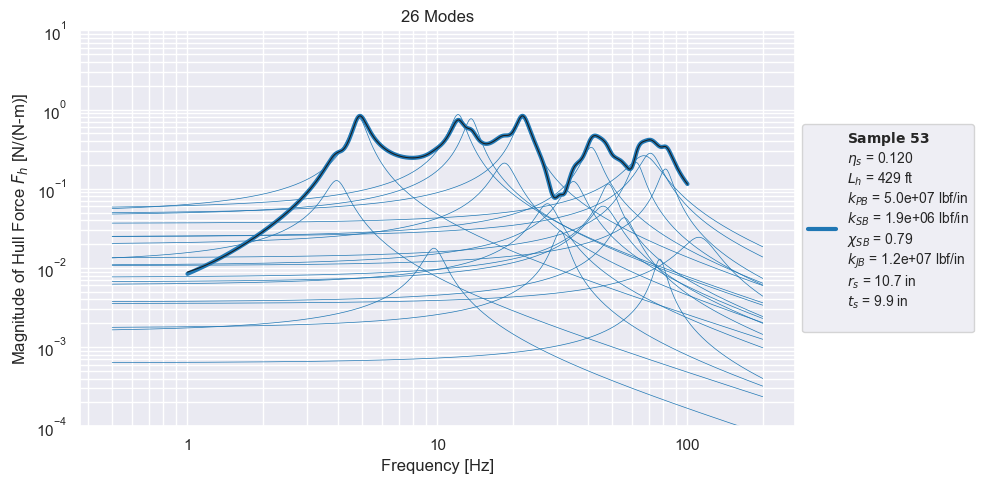

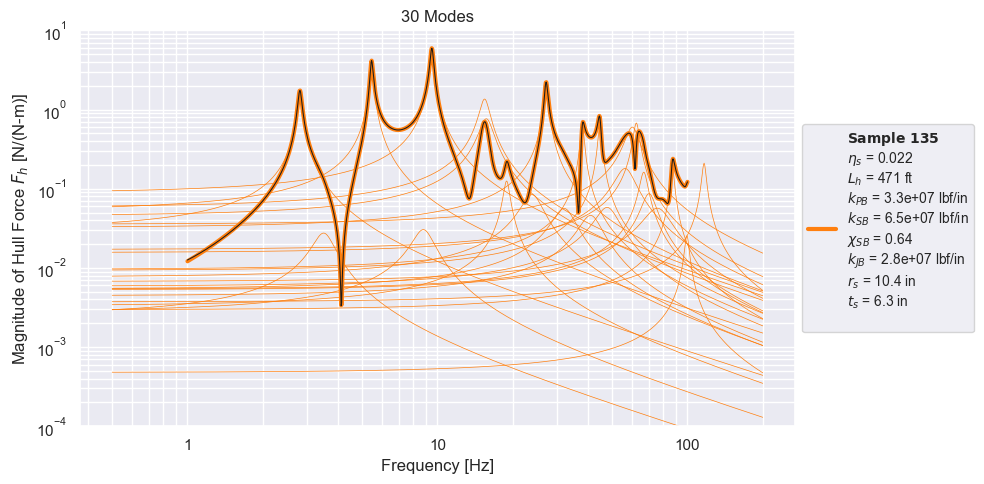

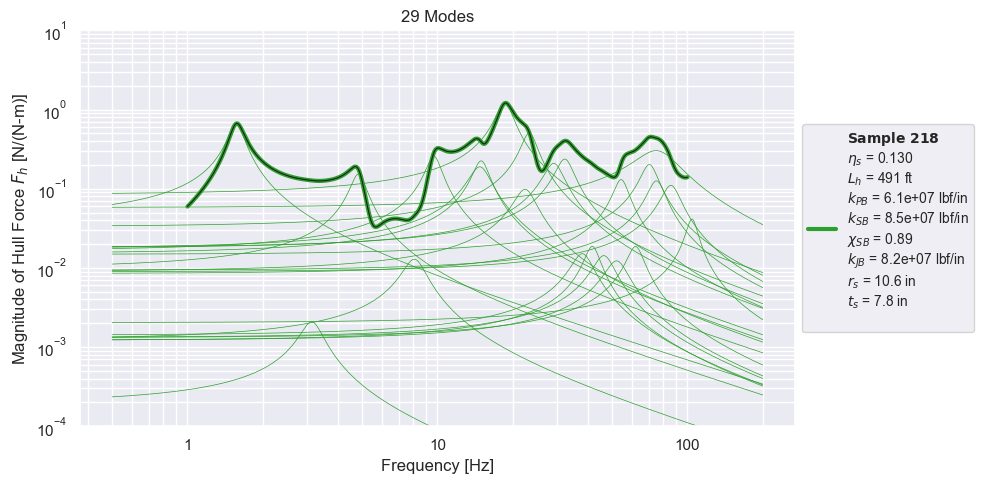

In [20]:
for i, c in zip(SAMPLE_INDICES, ('tab:blue', 'tab:orange', 'tab:green')):
    mpl.figure(figsize=(10, 5))
    sample = samples_validate[i]
    frf = frfs_validate[i, :]
    modes = modes_validate[i]
    mpl.title(f'{len(modes)} Modes')
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    fm = numpy.logspace(log10(0.5), log10(200), 1000)
    frfp = 0
    for mode in modes:
        frfp += mode(f)
        if mode.pole.imag == 0:
            continue
        mpl.loglog(fm, abs(mode(fm)), c=c, lw=0.5)
    mpl.loglog(f, abs(frfp), '-', c='k', lw=0.75)
    mpl.ylim(1e-4, 10)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Magnitude of Hull Force $F_h$ [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    mpl.savefig(f'validation-samples-{i}.png', dpi=300)
    mpl.show()

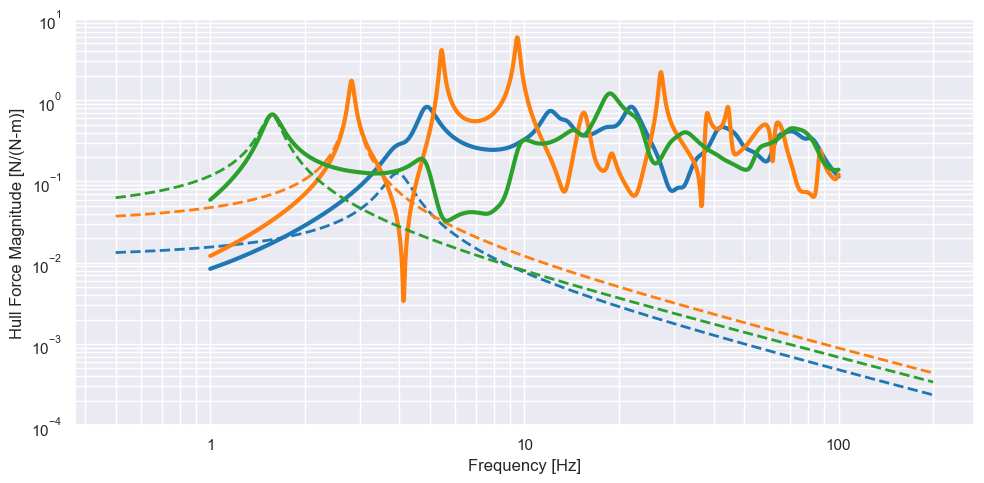

In [21]:
mpl.figure(figsize=(10, 5))
for i, m, c in zip(SAMPLE_INDICES, (6, 6, 6), ('tab:blue', 'tab:orange', 'tab:green')):
    sample = samples_validate[i]
    frf = frfs_validate[i, :]
    modes = modes_validate[i]
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    mode = modes[m]
    mpl.loglog(fm, abs(mode(fm)), '--', c=c, lw=2)
mpl.ylim(1e-4, 10)
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
#mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.savefig('validation-samples-modes-unmatched.png', dpi=300)
mpl.show()

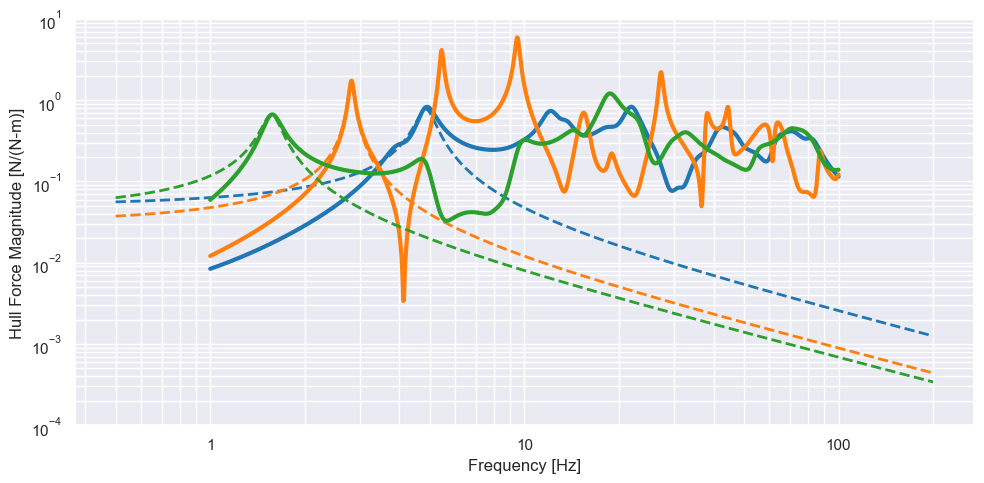

In [22]:
mpl.figure(figsize=(10, 5))
for i, m, c in zip(SAMPLE_INDICES, (7, 6, 6), ('tab:blue', 'tab:orange', 'tab:green')):
    sample = samples_validate[i]
    frf = frfs_validate[i, :]
    modes = modes_validate[i]
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    mode = modes[m]
    mpl.loglog(fm, abs(mode(fm)), '--', c=c, lw=2)
mpl.ylim(1e-4, 10)
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
#mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.savefig('validation-samples-modes-matched.png', dpi=300)
mpl.show()

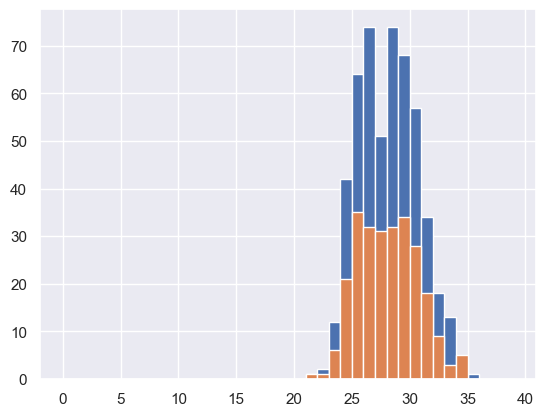

array([ 13,  85, 114, 205, 213])

In [23]:
Ms_train = numpy.asarray([len(modes) for modes in modes_train])
Ms_validate = numpy.asarray([len(modes) for modes in modes_validate])

mpl.figure()
mpl.hist(Ms_validate, bins=numpy.arange(0, 40))
mpl.hist(Ms_train, bins=numpy.arange(0, 40))
mpl.show()

iMmax, = numpy.where(Ms_train == Ms_train.max())
iMmax

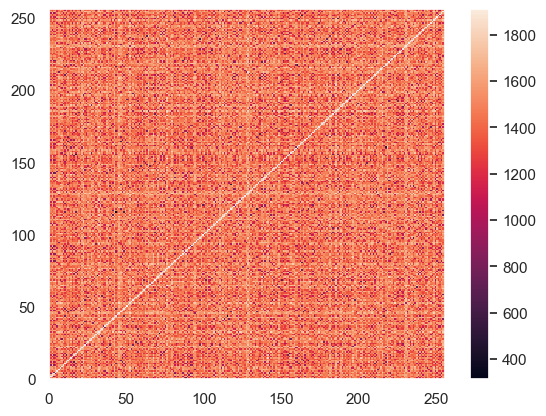

In [131]:
complex_components = ComplexComponents()
Dfrf = scipy.spatial.distance.squareform(
    scipy.spatial.distance.pdist(
        complex_components.fit_transform(frfs_train),
        metric='canberra'
        #metric='euclidean'
    )
)
Dfrf += numpy.diag(numpy.inf*numpy.ones(len(frfs_train)))

mpl.figure()
mpl.pcolormesh(Dfrf)
mpl.colorbar()
mpl.show()

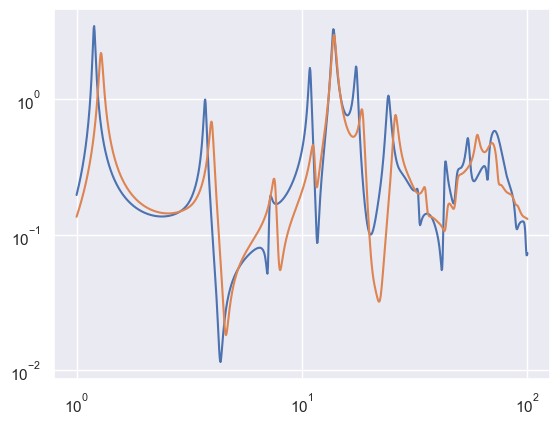

In [132]:
k, j = numpy.unravel_index(Dfrf[iMmax, :].argmin(), Dfrf[iMmax, :].shape)
i = iMmax[k]

i_first = i
j_first = j

frf_i = frfs_train[i, :]
frf_j = frfs_train[j, :]

modes_i = numpy.asarray([mode(fm) for mode in modes_train[i]])
modes_j = numpy.asarray([mode(fm) for mode in modes_train[j]])

polres_i = numpy.asarray([
    [mode.pole.imag, mode.pole.real, mode.residue.imag, mode.residue.imag] for mode in modes_train[i]
])
polres_j = numpy.asarray([
    [mode.pole.imag, mode.pole.real, mode.residue.imag, mode.residue.imag] for mode in modes_train[j]
])

FIRST_MATCH = (i, j)

mpl.figure()
mpl.loglog(f, abs(frf_i), label=f'Sample {i}')
mpl.loglog(f, abs(frf_j), label=f'Sample {j}')
mpl.show()

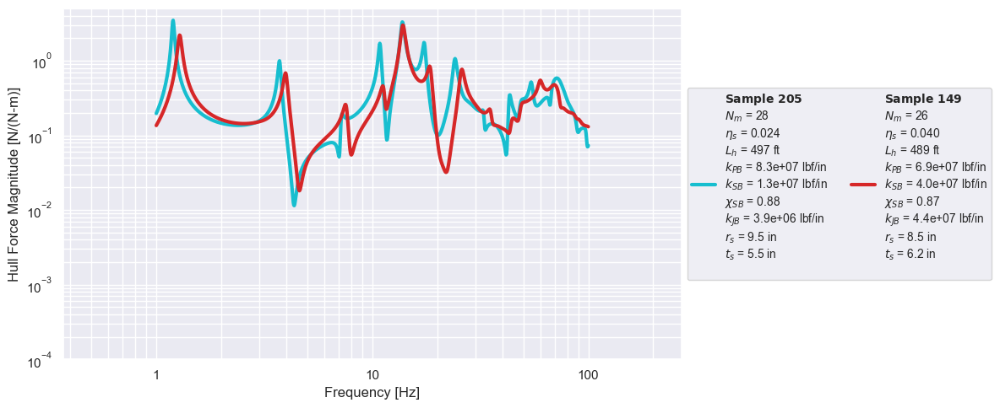

In [133]:
mpl.figure(figsize=(12, 5))
for k, c in zip(FIRST_MATCH, ('tab:cyan', 'tab:red')):
    sample = samples_train[k]
    frf = frfs_train[k, :]
    modes = modes_train[k]
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(k) + '}$\n'
            f'$N_m$ = {len(modes) - 6}\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    #mode = modes[m]
    #mpl.loglog(fm, abs(mode(fm)), '--', c=c, lw=2)
mpl.ylim(1e-4, 5)
mpl.xlim((0.3705672245534739, 269.85656953471266))
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.savefig('first-match.png', dpi=300)
mpl.show()

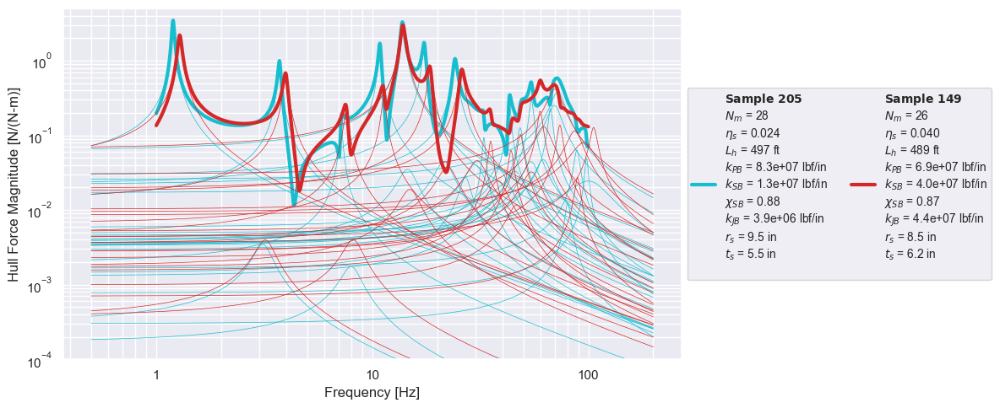

In [134]:
mpl.figure(figsize=(12, 5))
for k, c in zip(FIRST_MATCH, ('tab:cyan', 'tab:red')):
    sample = samples_train[k]
    frf = frfs_train[k, :]
    modes = modes_train[k]
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(k) + '}$\n'
            f'$N_m$ = {len(modes) - 6}\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    for mode in modes:
        if mode.pole.imag == 0:
            continue
        mpl.loglog(fm, abs(mode(fm)), c=c, lw=0.5)
    #mode = modes[m]
    #mpl.loglog(fm, abs(mode(fm)), '--', c=c, lw=2)
mpl.ylim(1e-4, 5)
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.savefig('first-match-with-modes.png', dpi=300)
mpl.show()

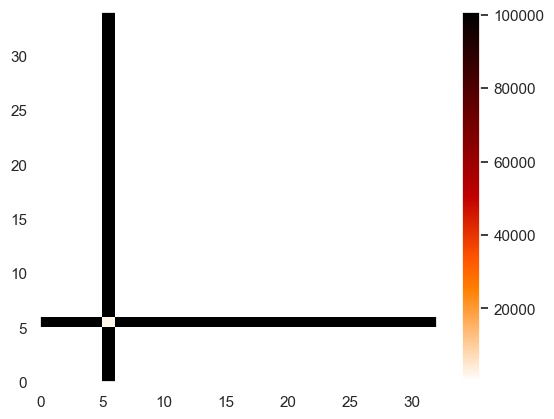

In [135]:
Dm = scipy.spatial.distance.cdist(
    polres_i,
    polres_j,
    metric='euclidean'
    #metric='canberra'
    #metric='cosine'
)

mpl.figure()
mpl.pcolormesh(Dm, cmap='gist_heat_r')
mpl.colorbar()
mpl.show()

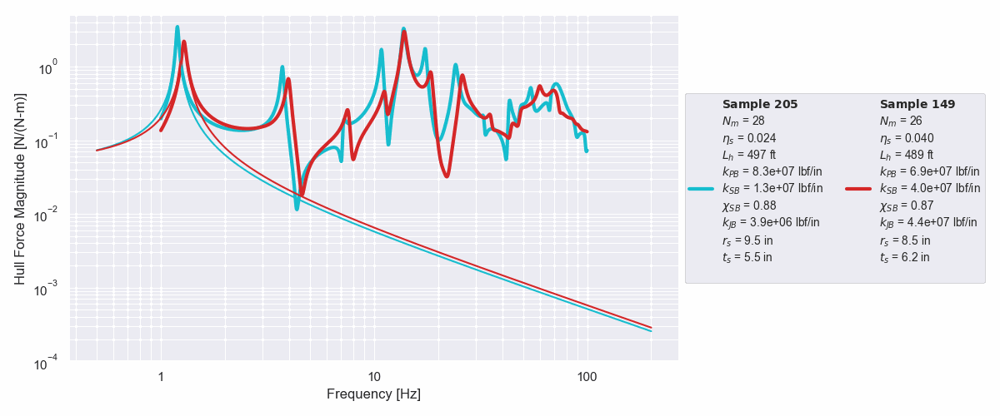

In [136]:
ims, jms = scipy.optimize.linear_sum_assignment(Dm)
gif = mpl.AnimatedGif()

for im, jm in zip(ims, jms):
    fig = mpl.figure(figsize=(12, 5))
    sample = samples_train[i]
    mpl.loglog(
        f, abs(frf_i), c='tab:cyan', lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$N_m$ = {len(modes_train[i]) - 6}\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    sample = samples_train[j]
    mpl.loglog(
        f, abs(frf_j), c='tab:red', lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(j) + '}$\n'
            f'$N_m$ = {len(modes_train[j]) - 6}\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    if modes_train[i][im].pole.imag == 0:
        mpl.close(fig)
        continue
    if modes_train[j][jm].pole.imag == 0:
        mpl.close(fig)
        continue
    mpl.loglog(fm, abs(modes_i[im, :]), c='tab:cyan')
    mpl.loglog(fm, abs(modes_j[jm, :]), c='tab:red')
    mpl.ylim(1e-4, 5)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    gif.add_frame(fig, close=True)

gif.save('first-match-with-matching-modes.gif', duration=0.5, loop=-1)
display_image('first-match-with-matching-modes.gif')

In [137]:
def walk_distance_matrix(D, start=None):
    D = D.copy()
    Ns = len(D)
    if start is None:
        i, j = numpy.unravel_index(D.argmin(), D.shape)
    else:
        i, j = start
    path = [[i, j]]
    visited = [i, j]
    D[i, j] = numpy.inf
    D[j, i] = numpy.inf
    unvisited = [j for j in range(Ns) if j not in set(visited)]
    while len(visited) < Ns:
        ii, jj = numpy.unravel_index(
            D[visited, :][:, unvisited].argmin(),
            (len(visited), len(unvisited))
        )
        i = visited[ii]
        j = unvisited[jj]
        path.append([i, j])
        visited.append(j)
        unvisited.remove(j)
    return numpy.asarray(path)

match_path = walk_distance_matrix(Dfrf, (i_first, j_first))
match_path

array([[205, 149],
       [149,  62],
       [149,  71],
       [ 71,  31],
       [ 71, 247],
       [247,  77],
       [ 77, 125],
       [247, 190],
       [190, 199],
       [247, 214],
       [247,  83],
       [214, 132],
       [199, 180],
       [ 83, 175],
       [175,  40],
       [ 40,  92],
       [ 92,   3],
       [  3, 142],
       [  3,  91],
       [  3, 220],
       [220,  86],
       [ 91,  47],
       [ 47,  11],
       [ 11,  16],
       [ 16, 154],
       [  3,  81],
       [ 81, 139],
       [ 47,  14],
       [ 11, 160],
       [160, 217],
       [ 81,  89],
       [ 89, 170],
       [170, 120],
       [120,  99],
       [120, 240],
       [240, 219],
       [219, 131],
       [219, 137],
       [240,  57],
       [137, 119],
       [119, 209],
       [ 57,  34],
       [240, 192],
       [192, 225],
       [225, 152],
       [152, 179],
       [179, 235],
       [235,  60],
       [235,  97],
       [ 97,  39],
       [235,  51],
       [235, 133],
       [ 39,

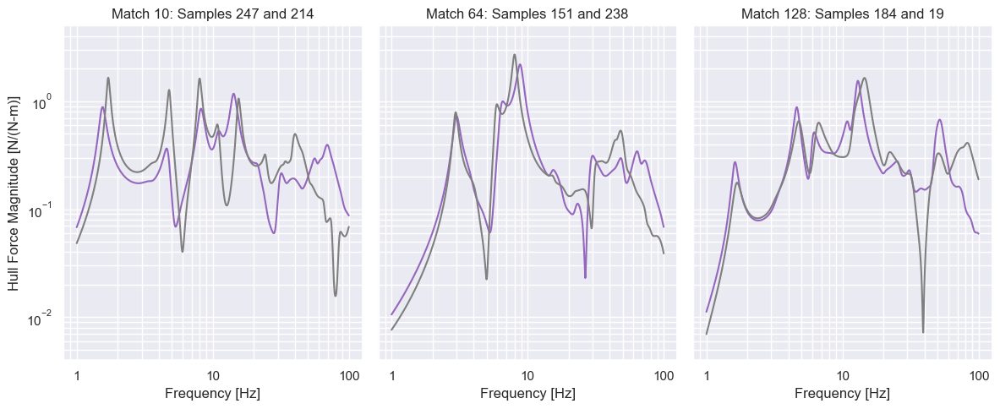

In [138]:
matches = [9, 63, 127]
fig, axes = mpl.subplots(1, len(matches), figsize=(12, 5), sharey=True)
for i, k in enumerate(matches):
    axes[i].set_title(f'Match {k + 1}: Samples {match_path[k, 0]} and {path[k, 1]}')
    axes[i].loglog(f, abs(frfs_train[match_path[k, 0], :]), c='tab:purple')
    axes[i].loglog(f, abs(frfs_train[match_path[k, 1], :]), c='tab:grey')
    axes[i].set_ylim(4e-3, 5)
    axes[i].grid(True, which='both')
    axes[i].set_xlabel('Frequency [Hz]')
    axes[i].xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
axes[0].set_ylabel('Hull Force Magnitude [N/(N-m)]')
fig.tight_layout()
mpl.savefig('all-matches.png', dpi=300)
mpl.show()

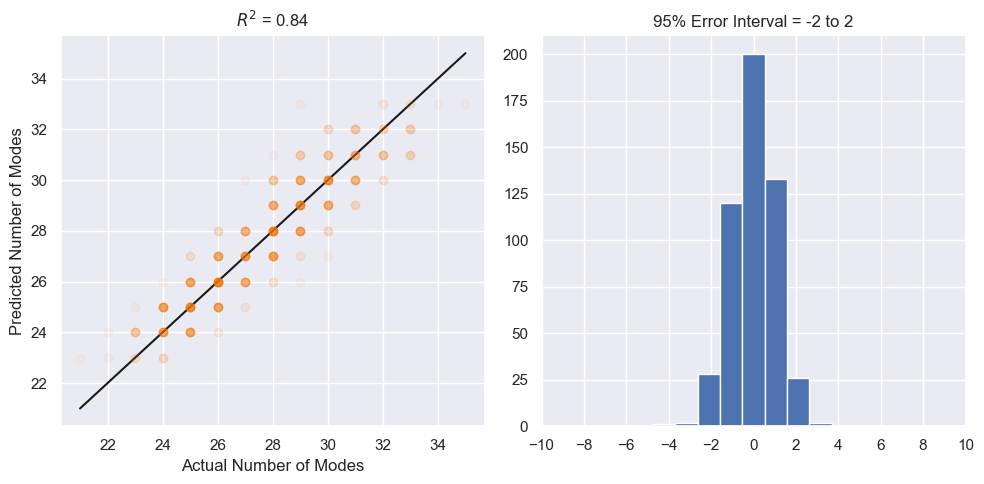

In [315]:
lgbm = lightgbm.LGBMRegressor(verbose=-1)
lgbm.fit(df_train[SAMPLE_KEYS], Ms_train)
Ms_p = numpy.around(lgbm.predict(df_validate[SAMPLE_KEYS])).astype(int)

df_train['M'] = Ms_train
df_validate['M'] = Ms_validate

mpl.figure(figsize=(10, 5))
mpl.subplot(1, 2, 1)
mpl.title(f'$R^2$ = {sklearn.metrics.r2_score(Ms_validate, Ms_p):.2f}')
mpl.plot([Ms_validate.min(), Ms_validate.max()], [Ms_validate.min(), Ms_validate.max()], 'k')
mpl.plot(Ms_validate, Ms_p, 'o', c='tab:orange', alpha=0.05)
mpl.xlabel('Actual Number of Modes')
mpl.ylabel('Predicted Number of Modes')
mpl.subplot(1, 2, 2)
mpl.hist(Ms_validate - Ms_p, bins=numpy.linspace(-10, 10, 20))
mpl.title(
    '95% Error Interval = '
    f'{int(numpy.percentile(Ms_validate - Ms_p, 2.5))} to '
    f'{int(numpy.percentile(Ms_validate - Ms_p, 97.5))}'
)
mpl.xlim(-10, 10)
mpl.gca().xaxis.set_major_locator(matplotlib.ticker.MaxNLocator(integer=True))
mpl.tight_layout()
mpl.show()

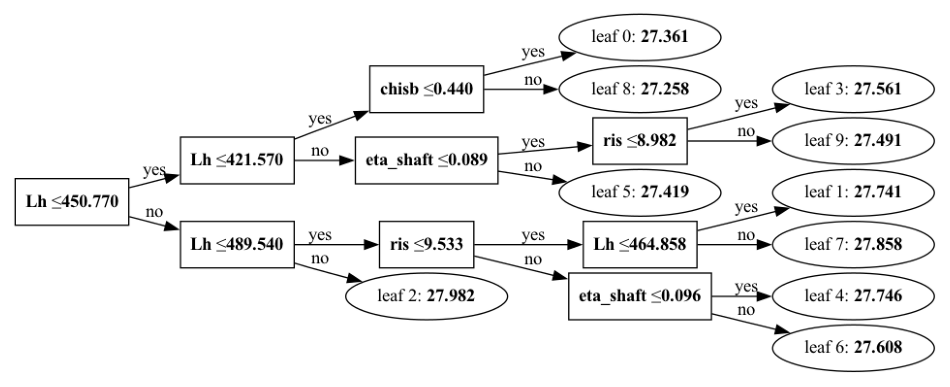

In [316]:
lightgbm.plot_tree(lgbm, tree_index=0, figsize=(12, 5))
mpl.show()

In [657]:
polres_0 = []
polres_1 = []
for modes in modes_train:
    poles = modes.poles
    residues = modes.residues
    k = poles.imag > 0.5
    poles = poles[k]
    residues = residues[k]
    #k = poles.imag < 10
    #poles = poles[k]
    #pole = poles[0].imag
    #residues = residues[k]
    """
    k = abs(residues) > 0.038
    if sum(k) > 0:
        poles = poles[k]
        residues = residues[k]
        pole = poles[0]
    """
    pole = poles[0]
    residue = residues[0]
    polres_0.append([abs(pole), numpy.angle(pole), abs(residue), numpy.angle(residue)])
    pole = poles[1]
    residue = residues[1]
    polres_1.append([abs(pole), numpy.angle(pole), abs(residue), numpy.angle(residue)])
polres_0 = numpy.asarray(polres_0)
polres_1 = numpy.asarray(polres_1)

In [694]:
p0 = []
p1 = []
lgbms = []
for i in range(4):
    lgbm = lightgbm.LGBMRegressor(n_estimators=150, verbose=-1)
    lgbm.fit(df_train[SAMPLE_KEYS], polres_0[:, i])
    lgbms.append(lgbm)
    p0.append(lgbm.predict(df_validate[SAMPLE_KEYS]))

    lgbm = lightgbm.LGBMRegressor(n_estimators=150, verbose=-1)
    lgbm.fit(df_train[SAMPLE_KEYS], polres_1[:, i])
    lgbms.append(lgbm)
    p1.append(lgbm.predict(df_validate[SAMPLE_KEYS]))
#lgbm.fit(df_train[SAMPLE_KEYS + ['M', ]], poles_0)
#poles_0_p = lgbm.predict(df_validate[SAMPLE_KEYS + ['M', ]])
p0 = numpy.asarray(p0).T
p1 = numpy.asarray(p1).T

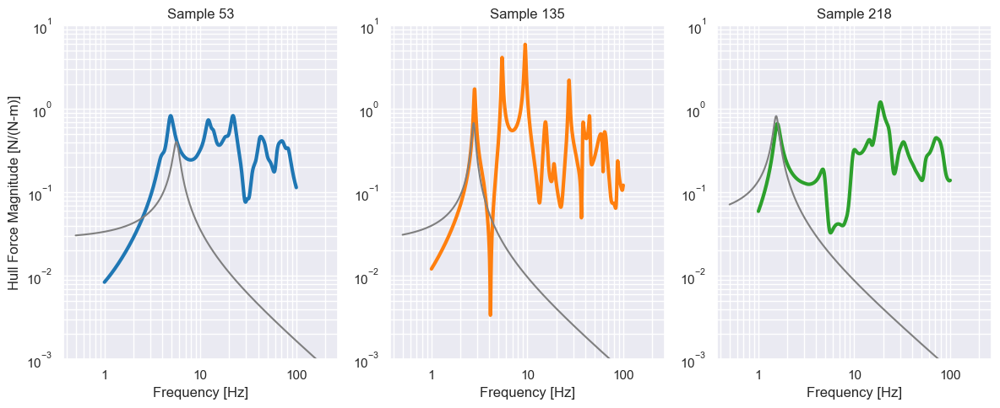

In [844]:
mpl.figure(figsize=(12, 5))
override_polres = {}
for k, (i, j, c) in enumerate(zip(SAMPLE_INDICES, (1, 0, 0), ('tab:blue', 'tab:orange', 'tab:green'))):
    if j == 0:
        poles = p0[:, 0]*exp(1j*p0[:, 1]) #p[:, 0]*p[:, 1] + 1j*p[:, 1]
        #if k == 1:
        #    poles = 0.4*poles.real + 1j*poles.imag
        residues = p0[:, 2]*exp(1j*p0[:, 3])#p[:, 2] + 1j*p[:, 3]
    else:
        poles = p1[:, 0]*exp(1j*p1[:, 1]) #p[:, 0]*p[:, 1] + 1j*p[:, 1]
        #residues = 2.3*p1[:, 2]*exp(1j*p1[:, 3])#p[:, 2] + 1j*p[:, 3]
        residues = p1[:, 2]*exp(1j*p1[:, 3])#p[:, 2] + 1j*p[:, 3]
    pole = poles[i]
    residue = residues[i]
    override_polres[i] = (j, pole, residue)
    mpl.subplot(1, 3, k+1)
    mpl.title(f'Sample {i}')
    mpl.loglog(f, abs(frfs_validate[i, :]), lw=3, c=c)
    #mpl.axvline(pole.imag, linestyle='--', c='tab:blue')
    mpl.loglog(fm, abs(residue/(1j*fm - pole)), '-', c='tab:grey')
    mpl.ylim(1e-3, 10)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
mpl.subplot(1, 3, 1)
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.tight_layout()
mpl.savefig('first-mode-prediction.png', dpi=300)
mpl.show()

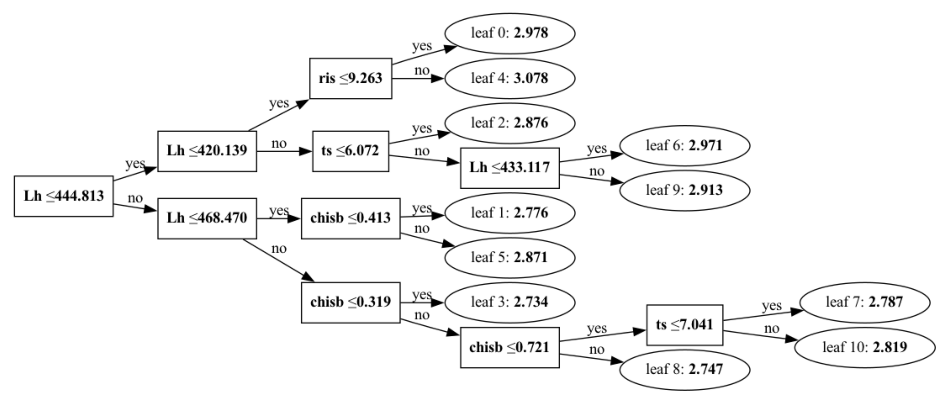

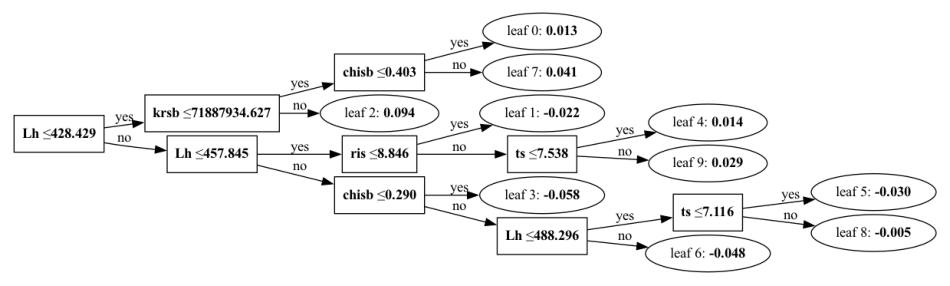

In [814]:
lightgbm.plot_tree(lgbms[0], tree_index=0, figsize=(12, 6))
mpl.savefig('first-mode-prediction-tree.png', dpi=300)
lightgbm.plot_tree(lgbms[0], tree_index=10, figsize=(12, 6))
mpl.savefig('second-mode-prediction-tree.png', dpi=300)
mpl.show()

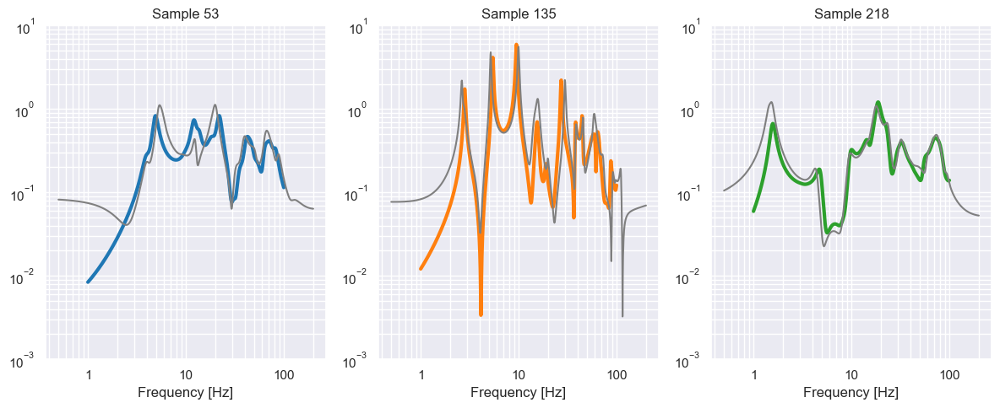

In [855]:
numpy.random.seed(20002)
e = 0.1
mpl.figure(figsize=(12, 5))
for k, (i, c) in enumerate(zip(SAMPLE_INDICES, ('tab:blue', 'tab:orange', 'tab:green'))):
    poles = m[i].poles.copy()
    residues = m[i].residues.copy()
    poles.real[poles.imag > 0] *= (1 + numpy.random.uniform(-e, e, len(poles[poles.imag > 0])))
    poles.imag *= (1 + numpy.random.uniform(-e, e, len(poles)))
    #residues[poles.imag > 0] *= (1 + numpy.random.uniform(-e, e, len(residues[poles.imag > 0])))
    residues *= (1 + numpy.random.uniform(-e, e, len(residues)))
    j, pole, residue = override_polres[i]
    #poles[j] = poles[j].real + 1j*pole.imag
    #residues[j] = residue
    poles[j] = pole
    residues[j] = residue

    frfp = 0
    for pole, residue in zip(poles, residues):
        frfp += residue/(1j*fm - pole)

    mpl.subplot(1, 3, k+1)
    mpl.title(f'Sample {i}')
    mpl.loglog(f, abs(frfs_validate[i, :]), lw=3, c=c)
    #mpl.axvline(pole.imag, linestyle='--', c='tab:blue')
    #mpl.loglog(fm, abs(residue/(1j*fm - pole)), '--', c='k')
    mpl.loglog(fm, abs(frfp), '-', c='tab:gray')
    #mpl.loglog(fm, abs(m[i](fm)), '--', c='k')
    mpl.ylim(1e-3, 10)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
mpl.tight_layout()
mpl.savefig('final-fit.png', dpi=300)
mpl.show()

In [750]:
m = decompose_modes(frfs_validate)

100%|██████████| 512/512 [01:03<00:00,  8.10it/s]


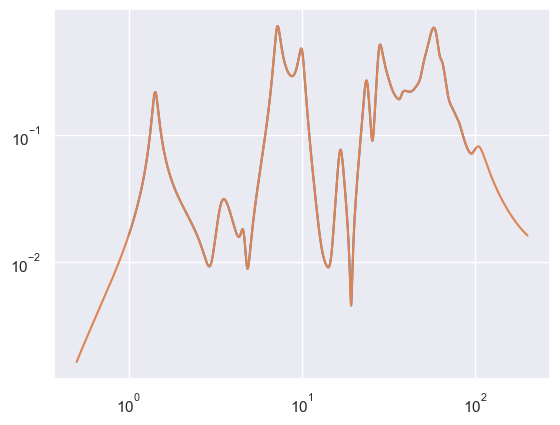

In [749]:
i = 52
mpl.figure()
mpl.loglog(f, abs(frfs_validate[i, :]))
mpl.loglog(fm, abs(modes_validate[i](fm)))
mpl.show()

[3.57777274 4.22832723]


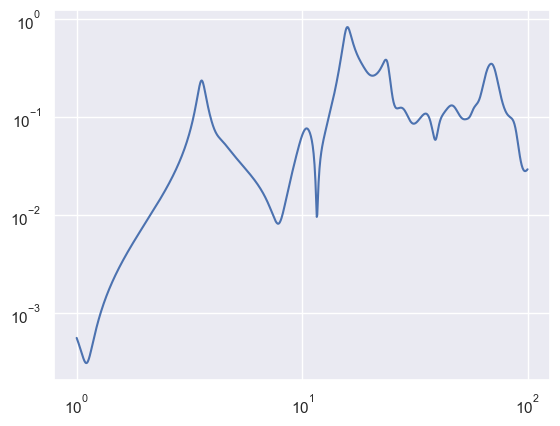

[1.82168727 2.8734639  3.22091342 6.46829468 8.206713   8.30554577]


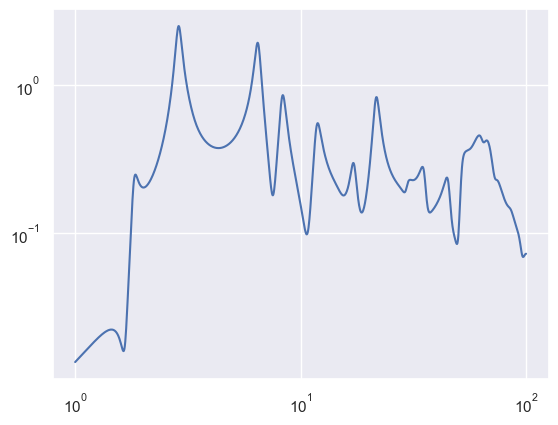

[2.54742275 3.51782724 4.44447359 6.59770787 9.00524714 9.33757539]


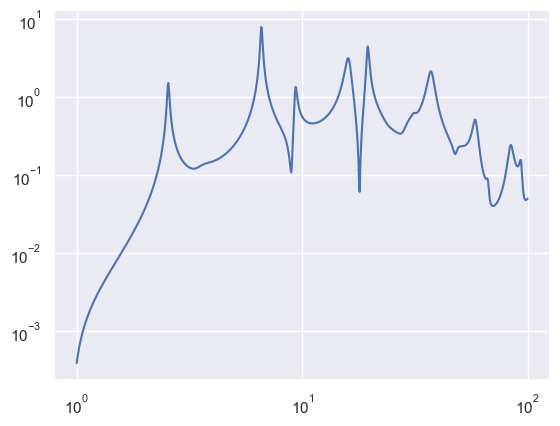

[2.75239284 3.79854825 7.56164458 9.43227714]


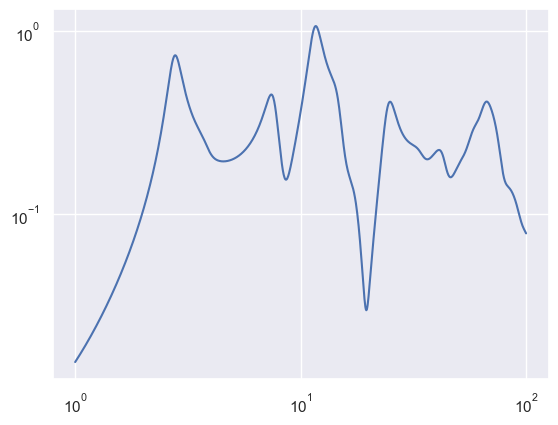

[2.73590485 3.73040011 8.23206065 9.14745248]


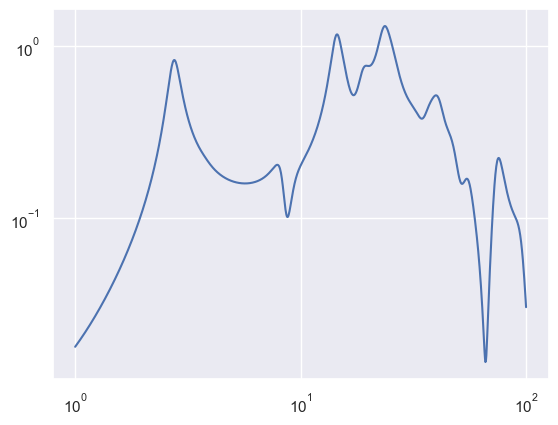

[2.67989923 4.06005127 6.46183778 9.18148045]


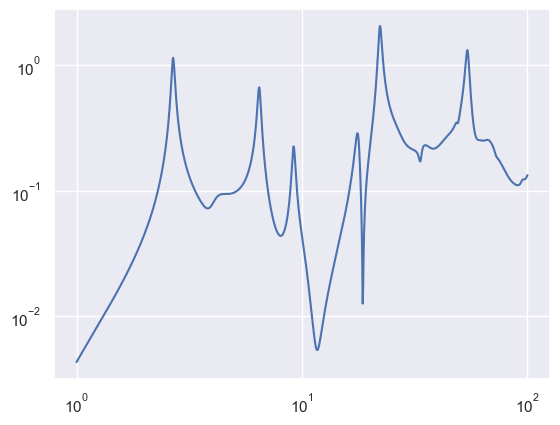

[4.51042336 7.16380192]


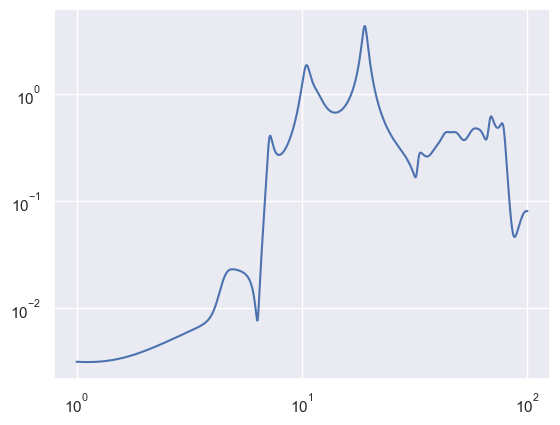

[1.47453949 3.28286742 4.71857266 8.5121693  9.68047137]


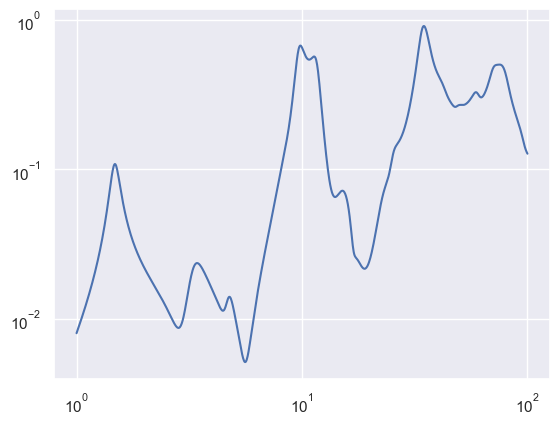

[2.929848   3.57756384 9.06814154 9.21247489]


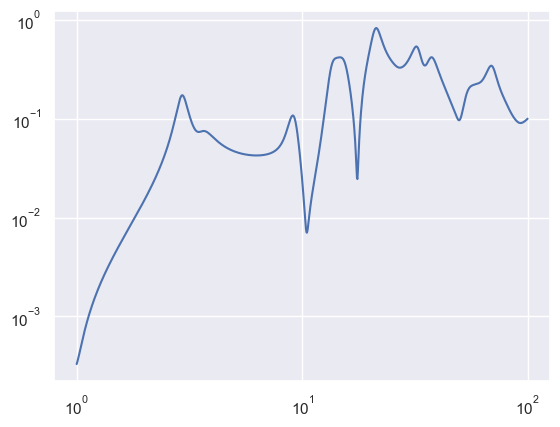

[2.43984885 4.11583228 6.47924106]


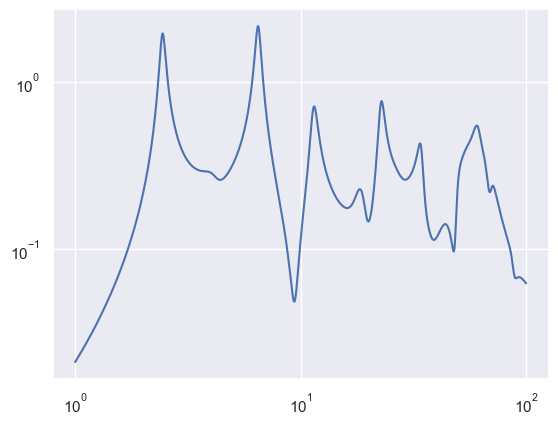

In [175]:
for modes in modes_train[:10]:
    poles = modes.poles

    poles = poles[poles.imag > 0.5]
    poles = poles[poles.imag < 10]
    print(poles.imag)
    mpl.figure()
    mpl.loglog(f, abs(modes(f)))
    mpl.show()
    """
    if poles.imag[0] < 1:
        print(poles.imag)
        mpl.figure()
        mpl.loglog(numpy.logspace(-3, 1, 1000), abs(modes(numpy.logspace(-3, 1, 1000))))
        mpl.show()
    """

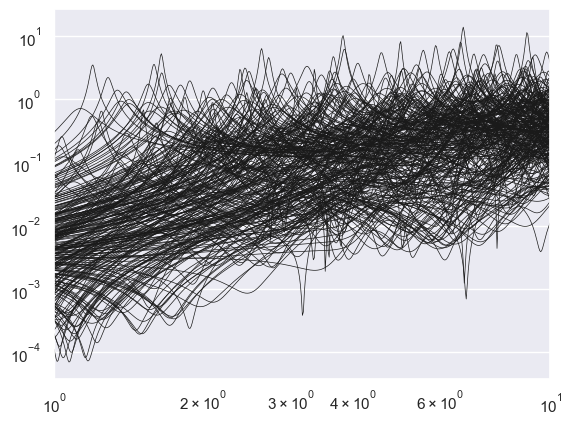

In [159]:
mpl.figure()
mpl.loglog(f, abs(frfs_train).T, c='k', lw=0.5, )
mpl.xlim(1, 10)
mpl.show()

In [216]:
jmss = {}
for i, j in match_path:
    polres_i = numpy.asarray([
        [mode.pole.imag, mode.pole.real, mode.residue.imag, mode.residue.imag] for mode in modes_train[i]
    ])
    polres_j = numpy.asarray([
        [mode.pole.imag, mode.pole.real, mode.residue.imag, mode.residue.imag] for mode in modes_train[j]
    ])
    Dm = scipy.spatial.distance.cdist(
        polres_i,
        polres_j,
        metric='euclidean'
        #metric='canberra'
        #metric='cosine'
    )
    ims, jms = scipy.optimize.linear_sum_assignment(Dm)
    jmss[j] = jms

In [178]:
for j, jms in jmss.items():
    if jms[6] != 6:
        print(jms)

[ 0  6  1  2  3  5  7  8 10 11 12 14 16 18 19 20 21 22 23 24 25 26 27 28
 29 30]
[ 0  1  2  3  4  5  7  8  9 10 12 13 14 15 16 18 19 20 22 23 24 26 27 28
 29 31]
[ 0  1  2  3  4  5  7  6  8  9 10 11 12 13 15 14 16 17 18 19 21 22 23 20
 24]
[ 0  1  2  3  4  5  7  8  9 10 11 12 14 15 16 17 18 19 20 22 23 24 25 27]
[ 0  1  2  3  4  5  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 26 25 27]
[ 0  1  2  3  4  5  7  8 10 11 12 13 15 17 16 18 20 19 21 22 23 24 25 26
 27 28]
[ 0  1  2  3  4  5  7  8 10 11 12 14 15 17 18 19 20 21 22 23 24 25 26 27
 28]
[ 0  1  2  3  6  5  7  8  9 11 12 13 14 15 17 18 19 20 21 22 16 23 24 25
 26]
[ 0  1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 18 19  3 20 17 21 22 23
 24]
[ 0  1  2  3  4  5  7  8 11 10 12 13 14 15 16 19 21 22 24 25 28 29 30 31
 32]
[ 0  1  2  3  4  5  7  8  9 11 12 13 14 16 17 18 19 20 21 22 23 24 25 26
 27]
[ 0  1  2  3  4  5  7  8 10 11 12 13 14 16 18 19 21 22 23 24 27 25 26 28
 29]
[ 0  1  2  3  4  5  7  8  9 10 11 12 13 14 15 16 17 1

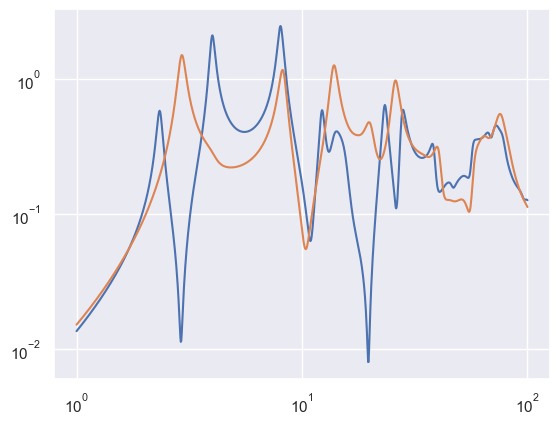

In [151]:
mpl.figure()
mpl.loglog(f, abs(frfs_train[89, :]))
mpl.loglog(f, abs(frfs_train[81, :]))
mpl.show()

In [152]:
polres_i[:, 0]

array([  0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   1.8234842 ,   3.15660929,
         5.36968244,   7.07890437,   8.17054753,  12.76788432,
        14.78070435,  15.31051801,  21.81378642,  23.16869034,
        29.43992739,  31.04267411,  35.72682907,  38.54334645,
        46.56738072,  49.37551827,  54.37891098,  57.71487682,
        62.95003904,  66.48297036,  72.25302426,  74.54445436,
        84.19511106,  92.77866118, 100.40134079])

In [ ]:
def walk_distance_matrix(D):
    Ns = len(D)
    D += numpy.diag(numpy.inf*numpy.ones(Ns))
    i, j = numpy.unravel_index(D.argmin(), D.shape)
    D[i, j] = numpy.inf
    D[j, i] = numpy.inf
    path = [[i, j]]
    visited = [i, j]
    unvisited = [j for j in range(Ns) if j not in set(visited)]
    while len(visited) < Ns:
        ii, jj = numpy.unravel_index(
            D[visited, :][:, unvisited].argmin(),
            (len(visited), len(unvisited))
        )
        i = visited[ii]
        j = unvisited[jj]
        path.append([i, j])
        visited.append(j)
        unvisited.remove(j)
    return numpy.asarray(path)

In [384]:
def preprocess(df):
    df = df.copy()
    df = df.explode(['f', 'abs(frf)'], ignore_index=False)
    X = df[USAMPLE_KEYS + ['f', ]].astype(float)
    y = df['abs(frf)'].astype(float)
    return X, y

In [385]:
X_train.loc[0], y_train.loc[0]

(    eta_shaft          krpb          krsb     chisb          krjb        ris  \
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 ..        ...           ...           ...       ...           ...        ...   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 0    0.080101  4.084910e+07  4.899603e+07  0.227707  2.490281e+07  10.113212   
 
           ts          Lh 

In [386]:
X_train, y_train = preprocess(df_train)
X_validate, y_validate = preprocess(df_validate)

regressor = lgb.LGBMRegressor(n_estimators=10000)#, max_depth=7, num_leaves=100)
regressor.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2263
[LightGBM] [Info] Number of data points in the train set: 256000, number of used features: 9
[LightGBM] [Info] Start training from score 0.285511


LGBMRegressor(n_estimators=10000)

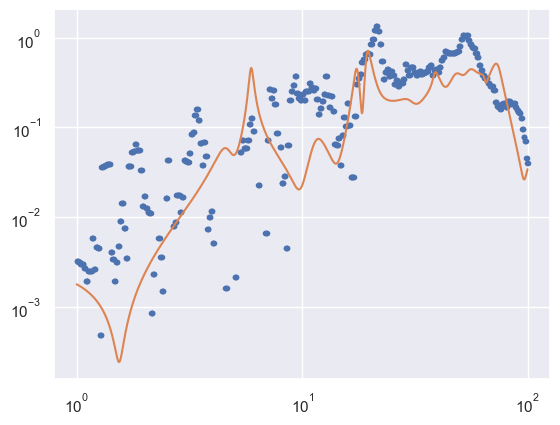

In [387]:
i = 511
frf_p = regressor.predict(X_validate.loc[i])

mpl.figure()
mpl.loglog(f, frf_p, '.')
mpl.loglog(f, y_validate.loc[i])
mpl.show()

In [108]:
modes_train = decompose_modes(frfs_train)

100%|██████████| 256/256 [00:38<00:00,  6.59it/s]


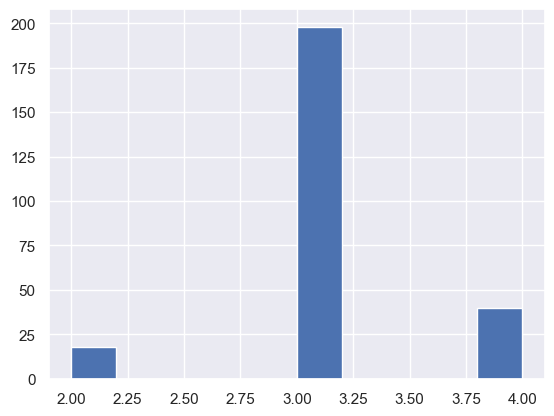

In [83]:
M = []
for modes in modes_train:
    M.append(sum(modes.poles.imag <= 0))
    #M.append(sum(modes.poles.imag >= 100))


mpl.figure()
mpl.hist(M)
mpl.show()

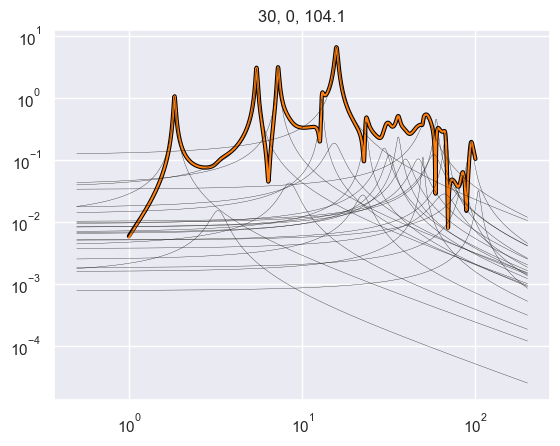

In [335]:
frf = df_train['frf'].iloc[50]
tol = 1e-4

modes = Modes.fit(f, frf, tol=tol)
poles = [
    pole for pole in modes.poles if 0 < pole.imag < 130 and pole.real < 0
]
modes = Modes.fit_with_poles(f, frf, numpy.hstack(([-2, -5, -10, -50, -100, -1e5], poles)))
#modes_no_polish = Modes.fit_with_poles(f, frf, poles, polish=False)
#modes_no_polish = Modes.fit(f, frf, polish=False, tol=tol)
"""
def objective(u):
    poles = numpy.hstack((u, modes.poles))
    residues = fit_residues(f, frf, poles)
    fit = Modes(poles, residues)
    residual = numpy.linalg.norm(frf - fit(f), ord=1)
    return residual
    #residual = frf - fit(f)
    #return numpy.hstack((residual.real, residual.imag))
#solution = scipy.optimize.least_squares(objective, x0=2*(0, ))
solution = scipy.optimize.differential_evolution(objective, bounds=[(-50, 50), (-50, 50), (-50, 50)])
u = solution.x
poles = numpy.hstack((u, modes.poles))
modes = Modes.fit_with_poles(f, frf, poles)
"""

fm = numpy.logspace(log10(0.5), log10(200), 1000)

mpl.figure()
mpl.title(f'{len(modes)}, {sum(modes.poles.imag < 0)}, {modes.poles.imag.max():0.1f}')
mpl.loglog(f, abs(frf), lw=3, c='black')
mpl.loglog(f, abs(modes(f)), c='tab:orange')
for mode in modes:
    if mode.pole.imag == 0:
        continue
    mpl.loglog(fm, abs(mode(fm)), c='k', lw=0.25)
mpl.show()

In [326]:
modes.poles, modes.residues

(array([-2.00000000e+00  +0.j        , -5.00000000e+00  +0.j        ,
        -1.00000000e+01  +0.j        , -5.00000000e+01  +0.j        ,
        -1.00000000e+02  +0.j        , -1.00000000e+05  +0.j        ,
        -4.42744009e-01  +4.46129228j, -2.13787191e-01  +5.29226035j,
        -2.99796666e-01  +7.25631732j, -1.08838690e+00 +11.20804828j,
        -6.65433402e-01 +16.09201165j, -1.89789591e+00 +19.73098259j,
        -9.16969371e-01 +21.93848498j, -2.83768781e+00 +29.08277803j,
        -3.56432582e+00 +38.07793104j, -1.79714298e+00 +40.33720838j,
        -2.13739867e+00 +47.3025401j , -4.26465296e+00 +47.47229789j,
        -5.04967419e+00 +56.83827375j, -4.49634605e+00 +62.63828537j,
        -8.87649873e+00 +71.4813712j , -3.92516320e+00 +73.39733868j,
        -4.11342846e+00 +85.38352126j, -1.10268897e+01+102.08583867j]),
 array([-1.33725438e-02+1.92920295e-03j, -3.47838862e-02-1.45642467e-01j,
         4.24069525e-01+4.52279630e-03j,  3.46917669e+00+3.43582339e+00j,
        -1

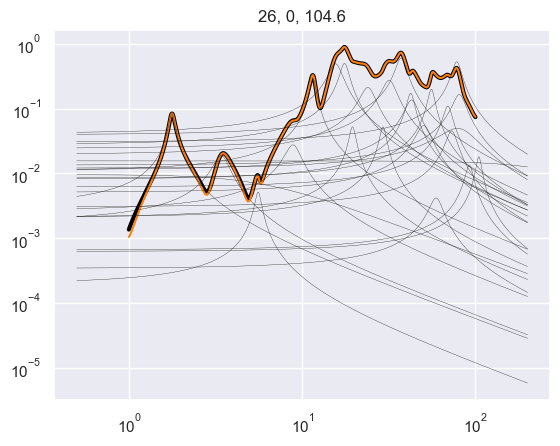

In [144]:


mpl.figure()
mpl.title(f'{len(modes)}, {sum(modes.poles.imag < 0)}, {modes.poles.imag.max():0.1f}')
mpl.loglog(f, abs(frf), lw=3, c='black')
mpl.loglog(f, abs(modes(f)), c='tab:orange')
for mode in modes:
    mpl.loglog(fm, abs(mode(fm)), c='k', lw=0.25)
mpl.show()

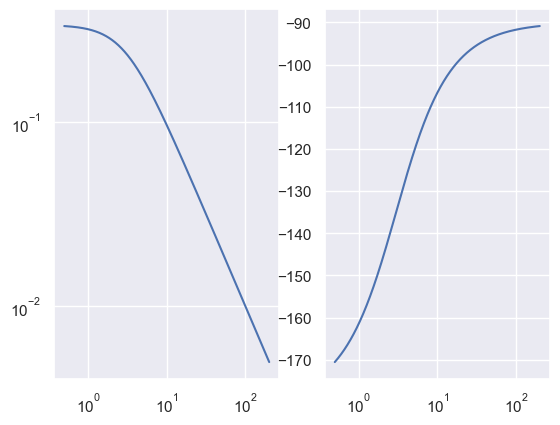

In [160]:
mpl.figure()
pole = 3
mode = 1/(1j*fm - pole)
mpl.subplot(1, 2, 1)
mpl.loglog(fm, abs(mode))
mpl.subplot(1, 2, 2)
mpl.semilogx(fm, numpy.angle(mode, deg=True))
mpl.show()

In [94]:
modes.poles

array([ 5.39985015e+00 -47.43120503j, -1.40034626e-01  -8.62368857j,
       -3.26744700e-02  -2.23444155j, -1.74752562e-02  +2.13292726j,
       -4.00423268e-01  +4.07681729j, -6.99074917e-02  +6.7509762j ,
       -1.74482666e-01  +9.24021363j, -9.60502610e-01 +10.41322093j,
       -1.46489823e-01 +13.88121498j, -1.79686871e+00 +18.36678188j,
       -3.16937597e-01 +23.02976959j, -2.63620275e+00 +27.11471181j,
       -6.21296839e-01 +32.71308362j, -3.36618726e+00 +35.77997022j,
       -5.37339229e-01 +42.09215676j, -3.96945172e+00 +44.67856335j,
       -3.18035755e+00 +50.97471036j, -8.19999618e-01 +54.31629955j,
       -4.91405546e+00 +57.47226691j, -5.91369432e+00 +65.25309051j,
       -9.19173805e-01 +69.19600222j, -6.83015807e+00 +73.26731138j,
       -1.17386516e+00 +85.05501079j, -7.69320588e+00 +88.36936443j,
       -1.32185167e+01 +90.84855696j, -1.77857099e+00+102.56628823j,
       -1.10366651e+01+103.16150354j, -3.62832229e+01+155.10287659j])

In [ ]:
def decompose_frfs(samples, tol=5e-4):
    for i in range(len(samples)):
        sample = samples.iloc[i]
        frf = sample['frf']
        baryrat = BarycentricRationalInterpolator.aaa(f, frf, tol=tol)
        poles = baryrat.poles
        k = numpy.argsort(poles.imag)
        poles = poles[k]
        residues = fit_residues(f, frf, poles)


In [28]:
#df_train.iterrows()
df = pandas.DataFrame()
df['A'] = [1, 2, 3, 4, 5]
df['B'] = df['A']**2

for i, row in df.iterrows():
    #print(i, row['A'])
    #df.loc[i, 'B'] = row['A']**2
    #df.loc[i, 'A'] = 0
    df.loc[i, 'C'] = object()

df

,A,B,C
0,1,1,<object object at 0x137eefc10>
1,2,4,<object object at 0x137eed010>
2,3,9,<object object at 0x137eef610>
3,4,16,<object object at 0x137eee5b0>
4,5,25,<object object at 0x137eef410>


In [13]:


def preprocess(frfs):
    baryrats = []
    polres = []
    modes = []
    for frf in tqdm.tqdm(frfs):
        baryrat = BarycentricRationalInterpolator.aaa(1j*f, frf, tol=1e-4)
        baryrats.append(baryrat)
        poles = baryrat.poles
        k = numpy.argsort(poles.imag)
        poles = poles[k]
        residues = fit_residues(f, frf, poles)
        modes = residues[None, :]/(1j*f[:, None] - poles[None, :])
        polres.append((poles, residues))
    return baryrats, polres, modes

"""
class Mode:

    def __init__(self, pole, residue):
        self.pole = pole
        self.residue = residue

    def __call__(self, f):
        pole = self.pole
        residue = self.residue
        return residue/(1j*f - pole) + residue.conj()/(1j*f - pole.conj())

    def __repr__(self):
        return f'{self.__class__.__name__}(pole={self.pole}, residue={self.residue})'


class Modes:

    def __init__(self, poles, residues):
        self.poles = poles
        self.residues = residues
        self.M = len(poles)
        self._modes = [Mode(pole, residue) for pole, residue in zip(poles, residues)]

    def __iter__(self):
        return iter(self._modes)

    def __getitem__(self, index):
        return self._modes[index]

    def __repr__(self):
        return f'{self.__class__.__name__}(poles={self.poles}, residues={self.residues})'

    @classmethod
    def fit(cls, f, frf, *args, **kwargs):
        f = numpy.hstack((-f, f))
        frf = numpy.hstack((frf.conj(), frf))
        aaa = BarycentricRationalInterpolator.aaa(1j*f, frf, *args, **kwargs)
        denominator = 1
        for pole in aaa.poles:
            denominator *= numpy.polynomial.Polynomial([-pole, 1])
        denominator = numpy.polynomial.Polynomial(denominator.coef.real)
        poles = denominator.roots()
        poles = numpy.asarray(
            [pole for pole in poles if pole.imag > 0 and pole.real < 0]
        )
        poles = numpy.hstack((poles.conj(), poles))
        residues = fit_residues(f, frf, poles)
        _, poles = numpy.hsplit(poles, 2)
        residues = numpy.hsplit(residues, 2)
        residues = (residues[0].conj() + residues[1])/2
        i = numpy.argsort(poles.imag)
        poles = poles[i]
        residues = residues[i]
        modes = cls(poles, residues)
        modes.fit_history = {
            'f': f,
            'frf': frf,
            'aaa': aaa,
        }
        return modes

    def __len__(self):
        return self.M

    def __call__(self, f):
        poles = self.poles
        residues = self.residues
        C = 1/(1j*f[:, None] - poles[None, :])
        Cconj = 1/(1j*f[:, None] - poles.conj()[None, :])
        return C.dot(residues) + Cconj.dot(residues.conj())


def _fit(frf):
    return Modes.fit(f, frf, tol=1e-8)


def decompose_modes(f, frfs):
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = executor.map(_fit, frfs)
        modes = [future for future in tqdm.tqdm(futures, total=len(frfs))]
    return modes
"""

In [126]:
if False:
    modes_train = decompose_modes(f, frfs_train)
    modes_validate = decompose_modes(f, frfs_validate)
    with gzip.open('modes.pkl.gz', 'wb') as fd:
        pickle.dump((modes_train, modes_validate), fd)
else:
    with gzip.open('modes.pkl.gz', 'rb') as fd:
        modes_train, modes_validate = pickle.load(fd)

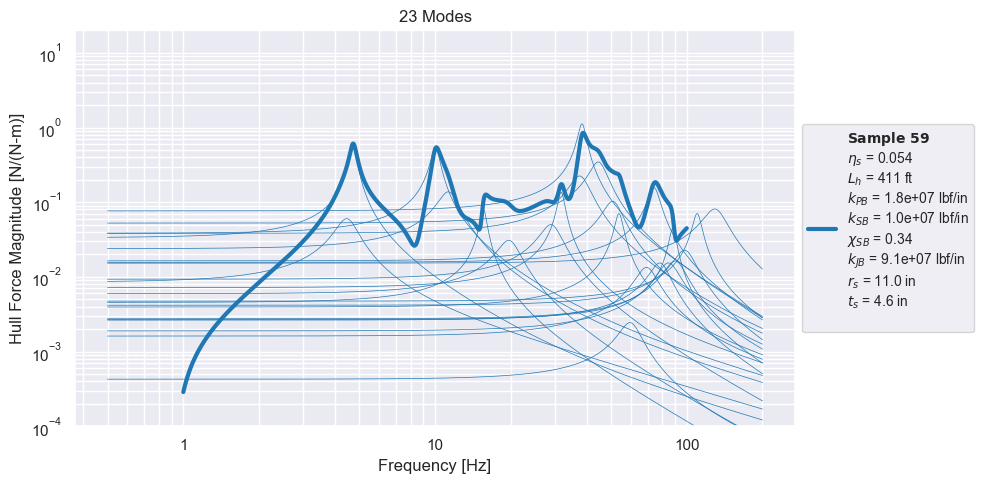

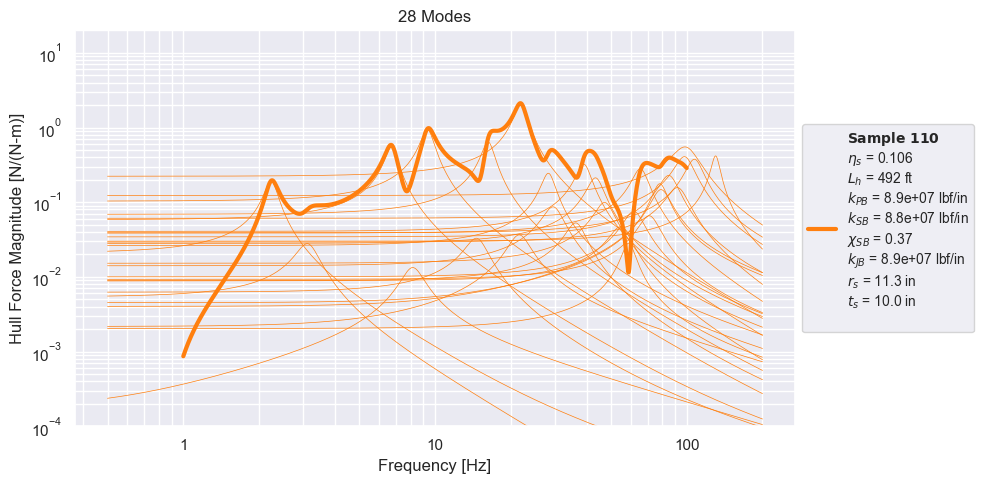

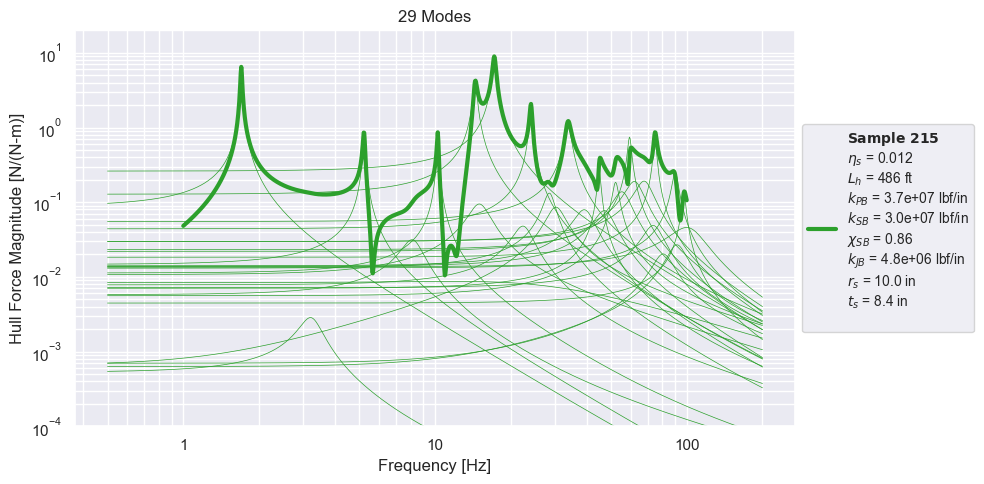

In [127]:
for i, c in zip((59, 110, 215), ('tab:blue', 'tab:orange', 'tab:green')):
    mpl.figure(figsize=(10, 5))
    sample = samples_train[i]
    frf = frfs_train[i, :]
    modes = modes_train[i]
    poles = modes.poles
    residues = modes.residues
    mpl.title(f'{len(poles)} Modes')
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    fm = numpy.logspace(log10(0.5), log10(200), 1000)
    frfp = 0
    for mode in modes:
        frfp += mode(f)
        mpl.loglog(fm, abs(mode(fm)), c=c, lw=0.5)
    #mpl.loglog(f, abs(frfp), '-', c='k')
    mpl.ylim(1e-4, 20)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    mpl.show()

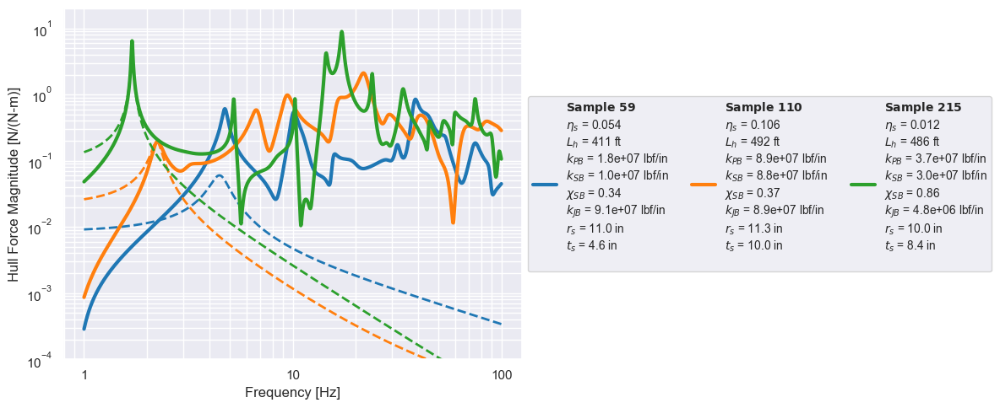

In [203]:
mpl.figure(figsize=(12, 5))
for i, m, c in zip((59, 110, 215), (0, 0, 0), ('tab:blue', 'tab:orange', 'tab:green')):
    sample = samples_train[i]
    frf = frfs_train[i, :]
    modes = modes_train[i]
    poles = modes.poles
    residues = modes.residues
    #print(poles, poles.real/poles.imag)
    #mpl.title(f'{len(poles)} Modes')
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    pole = poles[m]
    residue = residues[m]
    mode = residue/(1j*f - pole) + residue.conj()/(1j*f - pole.conj())
    mpl.loglog(f, abs(mode), '--', c=c, lw=2)
mpl.ylim(1e-4, 20)
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.show()

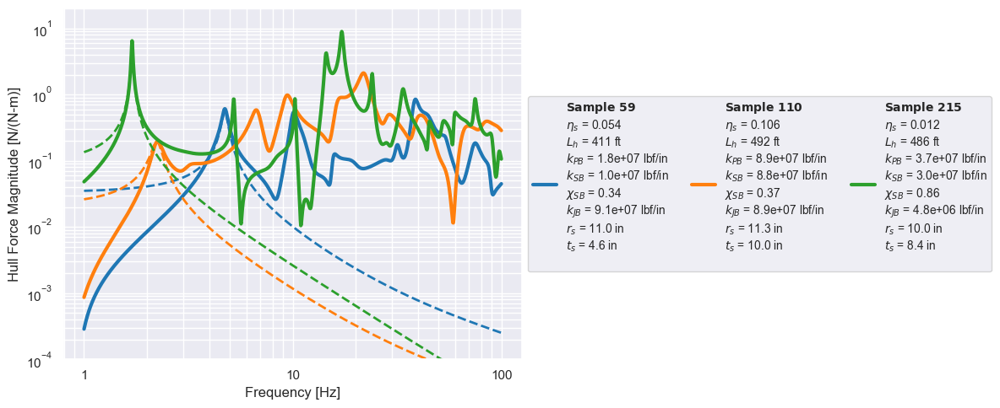

In [202]:
mpl.figure(figsize=(12, 5))
for i, m, c in zip((59, 110, 215), (1, 0, 0), ('tab:blue', 'tab:orange', 'tab:green')):
    sample = samples_train[i]
    frf = frfs_train[i, :]
    modes = modes_train[i]
    poles = modes.poles
    residues = modes.residues
    #print(poles, poles.real/poles.imag)
    #mpl.title(f'{len(poles)} Modes')
    mpl.loglog(
        f, abs(frf), c=c, lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    pole = poles[m]
    residue = residues[m]
    mode = residue/(1j*f - pole) + residue.conj()/(1j*f - pole.conj())
    mpl.loglog(f, abs(mode), '--', c=c, lw=2)
mpl.ylim(1e-4, 20)
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.show()

In [130]:
class ComplexComponents:

    def fit(self, x):
        pass

    def transform(self, x):
        x = asarray(x)
        return numpy.hstack([x.real, x.imag])

    def fit_transform(self, x):
        return self.transform(x)

    def inverse_transform(self, x):
        x = asarray(x)
        N, M = x.shape
        return x[:, :M//2] + 1j*x[:, M//2:]

In [144]:
def compare_sample_frfs(i, j):
    mpl.figure(figsize=(8, 4))
    sample = samples_train[i, :]
    mpl.loglog(f, abs(frfs_train[i, :]), label=(
        '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
        f'$\\eta_s$ = {sample[0]:.3f}\n'
        f'$L_h$ = {sample[-1]:.0f} ft\n'
        f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
        f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
        f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
        f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
        f'$r_{{s}}$ = {sample[5]:.1f} in\n'
        f'$t_s$ = {sample[6]:.1f} in\n'
    ))
    sample = samples_train[j, :]
    mpl.loglog(f, abs(frfs_train[j, :]), label=(
        '$\\mathbf{Sample\\ ' + str(j) + '}$\n'
        f'$\\eta_s$ = {sample[0]:.3f}\n'
        f'$L_h$ = {sample[-1]:.0f} ft\n'
        f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
        f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
        f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
        f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
        f'$r_{{s}}$ = {sample[5]:.1f} in\n'
        f'$t_s$ = {sample[6]:.1f} in\n'
    ))
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    mpl.show()

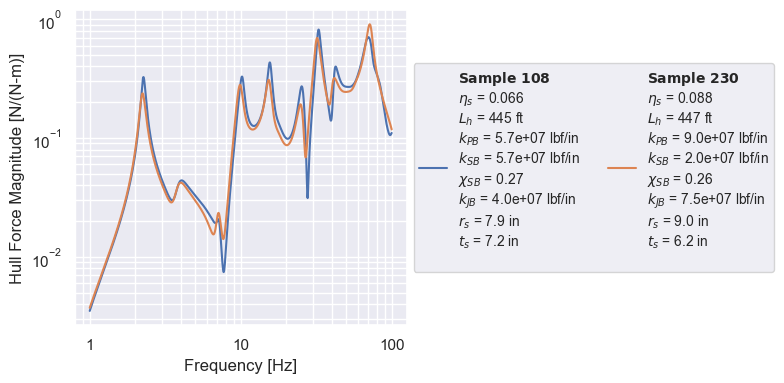

In [145]:
i, j = 108, 230

frf_i = frfs_train[i, :]
frf_j = frfs_train[j, :]

modes_i = numpy.asarray([mode(fm) for mode in modes_train[i]])
modes_j = numpy.asarray([mode(fm) for mode in modes_train[j]])

compare_sample_frfs(i, j)

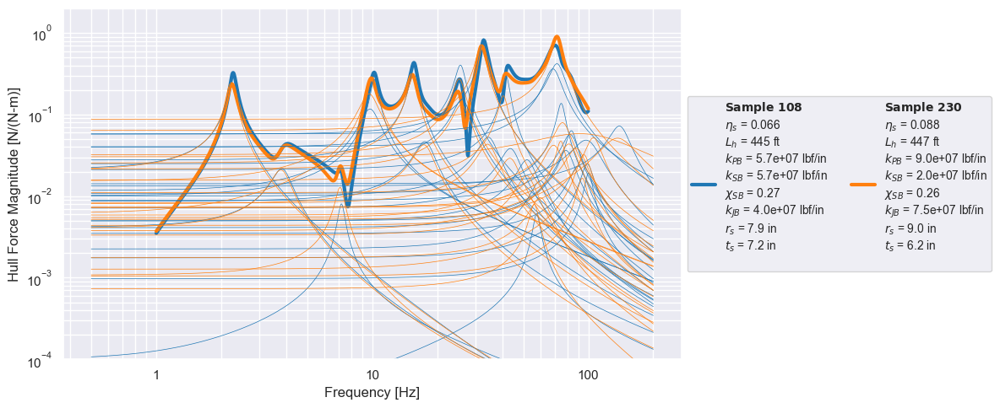

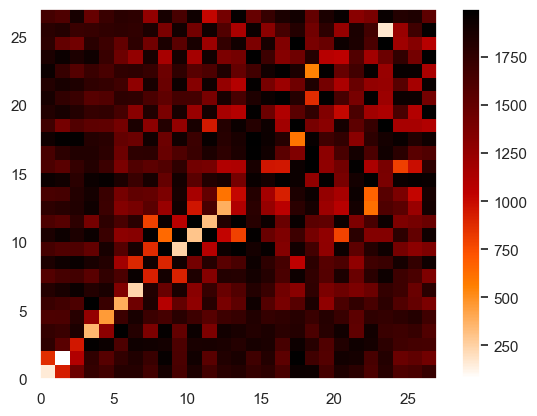

In [146]:
mpl.figure(figsize=(12, 5))
sample = samples_train[i]
mpl.loglog(
    f, abs(frf_i), c='tab:blue', lw=3,
    label=(
        '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
        f'$\\eta_s$ = {sample[0]:.3f}\n'
        f'$L_h$ = {sample[-1]:.0f} ft\n'
        f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
        f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
        f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
        f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
        f'$r_{{s}}$ = {sample[5]:.1f} in\n'
        f'$t_s$ = {sample[6]:.1f} in\n'
    )
)
sample = samples_train[j]
mpl.loglog(
    f, abs(frf_j), c='tab:orange', lw=3,
    label=(
        '$\\mathbf{Sample\\ ' + str(j) + '}$\n'
        f'$\\eta_s$ = {sample[0]:.3f}\n'
        f'$L_h$ = {sample[-1]:.0f} ft\n'
        f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
        f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
        f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
        f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
        f'$r_{{s}}$ = {sample[5]:.1f} in\n'
        f'$t_s$ = {sample[6]:.1f} in\n'
    )
)
mpl.loglog(fm, abs(modes_i.T), c='tab:blue', lw=0.5)
mpl.loglog(fm, abs(modes_j.T), c='tab:orange', lw=0.5)
mpl.ylim(1e-4, 2)
mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
mpl.tight_layout()
mpl.show()

Dm = scipy.spatial.distance.cdist(
    complex_components.fit_transform(modes_i),
    complex_components.fit_transform(modes_j),
    #metric='euclidean'
    metric='canberra'
    #metric='cosine'
)

mpl.figure()
mpl.pcolormesh(Dm, cmap='gist_heat_r')
mpl.colorbar()
mpl.show()

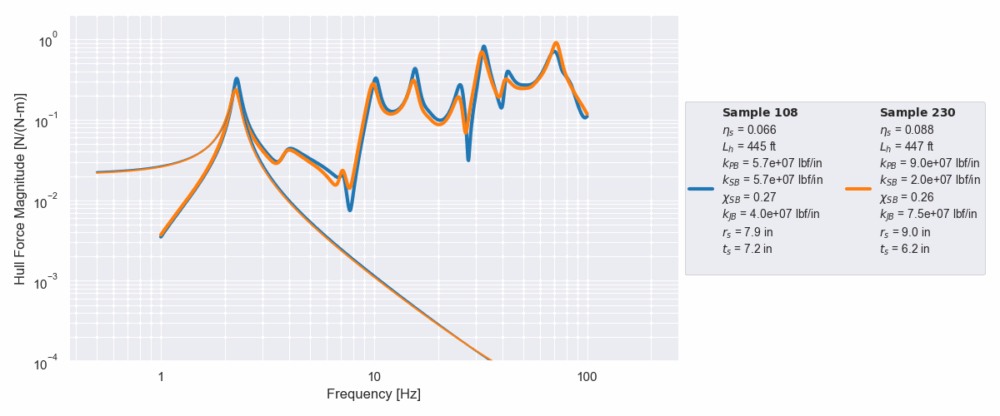

In [147]:
ims, jms = scipy.optimize.linear_sum_assignment(Dm)
gif = mpl.AnimatedGif()

for im, jm in zip(ims, jms):
    fig = mpl.figure(figsize=(12, 5))
    sample = samples_train[i]
    mpl.loglog(
        f, abs(frf_i), c='tab:blue', lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    sample = samples_train[j]
    mpl.loglog(
        f, abs(frf_j), c='tab:orange', lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(j) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    mpl.loglog(fm, abs(modes_i[im, :]), c='tab:blue')
    mpl.loglog(fm, abs(modes_j[jm, :]), c='tab:orange')
    mpl.ylim(1e-4, 2)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    gif.add_frame(fig, close=True)

gif.save('mode-matching.gif', duration=0.5, loop=-1)
display_image('mode-matching.gif')

In [93]:
Dm[ims, jms]

array([ 156.77548441,   76.25526907,  948.76184566,  352.95952473,
        452.90948935,  390.63320869,  240.50430772,  922.28172911,
        901.95128141,  246.34778442,  300.5808388 ,  319.61657187,
        378.37104616,  669.32673381, 1405.80812801,  959.68059621,
       1293.95440932,  597.975138  , 1163.75655466, 1115.04320011,
       1397.62938696, 1168.6165127 ,  551.26420159, 1051.42894022,
       1079.9450504 ,  172.38111058, 1484.81325611])

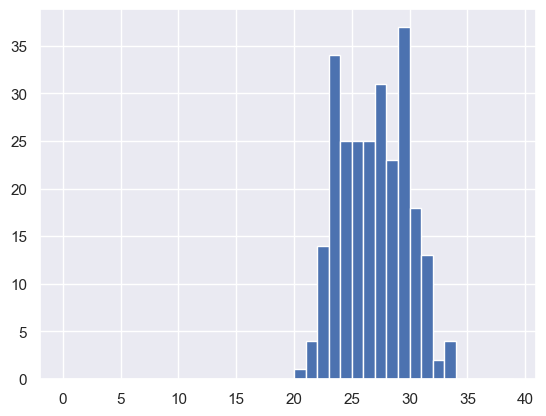

In [96]:
Mtrain = numpy.asarray([len(modes) for modes in modes_train])
mpl.figure()
mpl.hist(Mtrain, bins=numpy.arange(0, 40))
mpl.show()

In [251]:
iMmax, = numpy.where(Mtrain == Mtrain.max())
iMmax

array([ 40,  91, 188, 232])

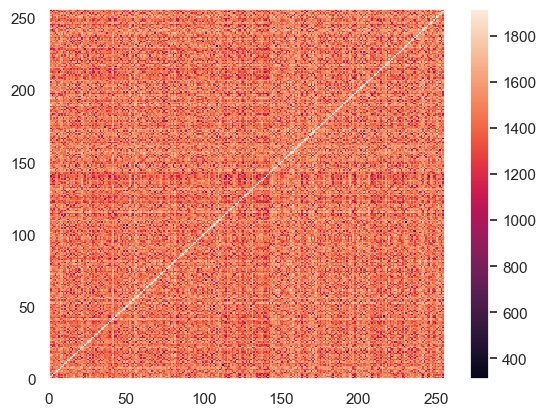

In [252]:
complex_components = ComplexComponents()
Dfrf = scipy.spatial.distance.squareform(
    scipy.spatial.distance.pdist(
        complex_components.fit_transform(frfs_train),
        metric='canberra'
    )
)
Dfrf += numpy.diag(numpy.inf*numpy.ones(Ns))
mpl.figure()
mpl.pcolormesh(Dfrf)
mpl.colorbar()
mpl.show()

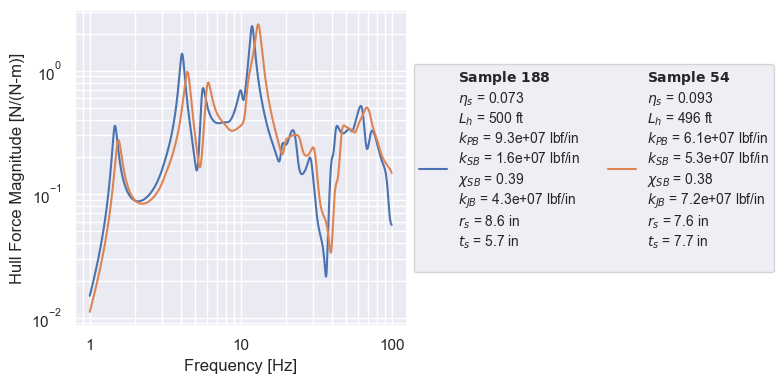

33 33 30 30


In [253]:
k, j = numpy.unravel_index(Dfrf[iMmax, :].argmin(), Dfrf[iMmax, :].shape)
i = iMmax[k]

frf_i = frfs_train[i, :]
frf_j = frfs_train[j, :]

modes_i = modes_train[i]
modes_j = modes_train[j]

compare_sample_frfs(i, j)
print(Mtrain[i], len(modes_i), Mtrain[j], len(modes_j))

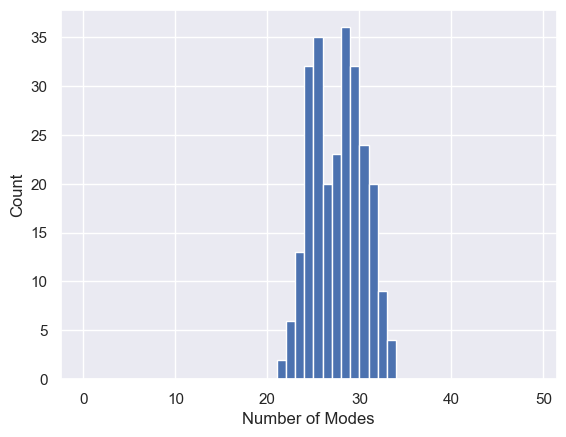

array([ 40,  91, 176, 207])

In [345]:
Ms = numpy.asarray([len(baryrat) for baryrat in baryrats])

mpl.figure()
mpl.hist(Ms, bins=numpy.arange(0, 50))
mpl.xlabel('Number of Modes')
mpl.ylabel('Count')
mpl.show()

iMmax, = numpy.where(Ms == Ms.max())
iMmax

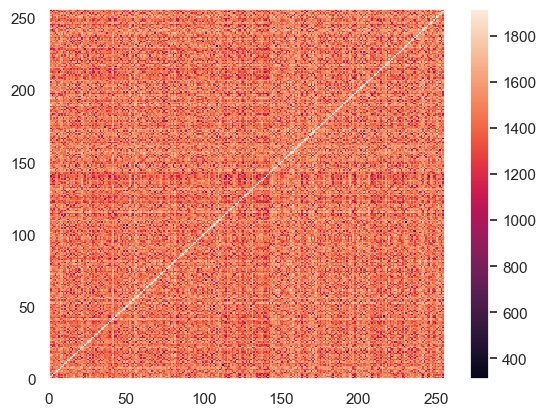

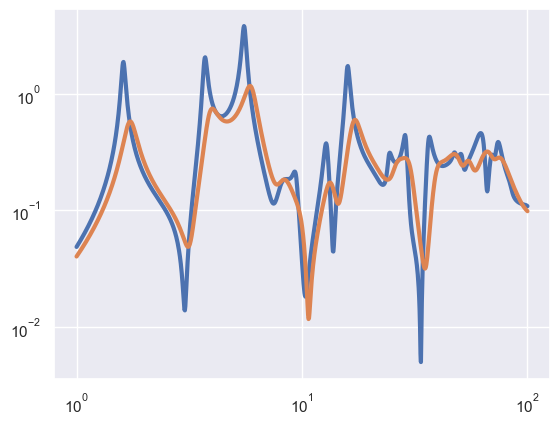

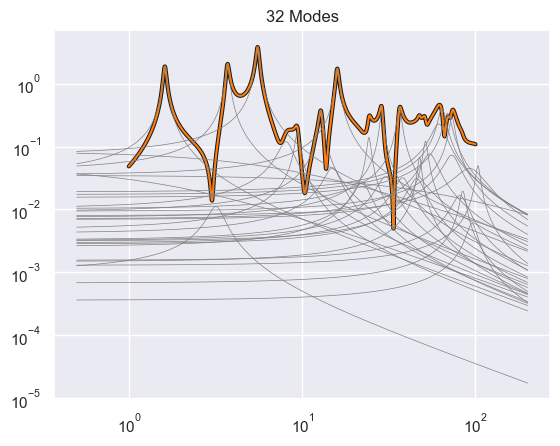

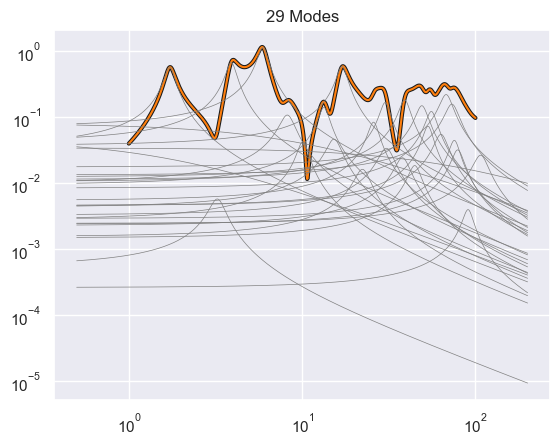

In [308]:
complex_components = ComplexComponents()
Dfrf = scipy.spatial.distance.squareform(
    scipy.spatial.distance.pdist(
        complex_components.fit_transform(frfs_train),
        metric='canberra'
        #metric='euclidean'
    )
)
Dfrf += numpy.diag(numpy.inf*numpy.ones(Ns))
mpl.figure()
mpl.pcolormesh(Dfrf)
mpl.colorbar()
mpl.show()

k, j = numpy.unravel_index(Dfrf[iMmax, :].argmin(), Dfrf[iMmax, :].shape)
i = iMmax[k]

frf_i = frfs_train[i, :]
frf_j = frfs_train[j, :]

baryrat_i = baryrats[i]
poles_i, residues_i = polres[i]
modes_i = numpy.asarray([residue/(1j*fm - pole) for pole, residue in zip(poles_i, residues_i)])

baryrat_j = baryrats[j]
poles_j, residues_j = polres[j]
modes_j = numpy.asarray([residue/(1j*fm - pole) for pole, residue in zip(poles_j, residues_j)])


mpl.figure()
mpl.loglog(f, abs(frf_i), lw=3)
mpl.loglog(f, abs(frf_j), lw=3)
mpl.show()

mpl.figure()
mpl.title(f'{len(poles_i)} Modes')
mpl.loglog(f, abs(frf_i), c='k', lw=3)
mpl.loglog(f, abs(baryrat_i(1j*f)), c='tab:orange')
for mode in modes_i:
    mpl.loglog(fm, abs(mode), c='grey', lw=0.5)
#for pole, residue in zip(poles_i, residues_i):
#    mpl.loglog(fm, abs(residue/(1j*fm - pole)), c='grey', lw=0.5)
mpl.show()

mpl.figure()
mpl.title(f'{len(poles_j)} Modes')
mpl.loglog(f, abs(frf_j), c='k', lw=3)
mpl.loglog(f, abs(baryrat_j(1j*f)), c='tab:orange')
for mode in modes_j:
    mpl.loglog(fm, abs(mode), c='grey', lw=0.5)
#for pole, residue in zip(poles_j, residues_j):
#    mpl.loglog(fm, abs(residue/(1j*fm - pole)), c='grey', lw=0.5)
mpl.show()

In [353]:
def preprocess(frfs):
    baryrats = []
    polres = []
    modes = []
    for frf in tqdm.tqdm(frfs):
        baryrat = BarycentricRationalInterpolator.aaa(1j*f, frf, tol=1e-4)
        baryrats.append(baryrat)
        poles = baryrat.poles
        k = numpy.argsort(poles.imag)
        poles = poles[k]
        residues = fit_residues(f, frf, poles)
        modes = residues[None, :]/(1j*f[:, None] - poles[None, :])
        polres.append((poles, residues))
    return baryrats, polres, modes

In [354]:
baryrats_train, polres_train, modes_train = preprocess(frfs_train)
baryrats_validate, polres_validate, modes_validate = preprocess(frfs_validate)

100%|██████████| 512/512 [03:50<00:00,  2.22it/s]


In [957]:
def is_odd(number):
    return number % 2 != 0

In [989]:
def make_network(N=1, network_min=100, network_max=100):
    assert is_odd(N)
    network = numpy.interp(numpy.linspace(0, 1, N), [0, 0.5, 1], [network_max, network_min, network_max]).astype(int)
    return tuple(network)

In [1019]:
import sklearn.ensemble
import lightgbm as lgb

scaler = sklearn.preprocessing.MinMaxScaler()
Mtrain = numpy.asarray([len(baryrat) for baryrat in baryrats_train])
Mvalidate = numpy.asarray([len(baryrat) for baryrat in baryrats_validate])

"""
solver = 'adam'
#solver = 'lbfgs'
#activation = 'relu'
activation = 'tanh'
regressor = sklearn.neural_network.MLPClassifier((1000, 1000, ), max_iter=1000000, activation=activation, solver=solver)
regressor.fit(scaler.fit_transform(samples_train), Mtrain)
"""
scaler.fit(samples_train)
Dd = scipy.spatial.distance.cdist(
    scaler.transform(samples_train),
    scaler.transform(samples_train),
    metric='euclidean'
)
Dd += numpy.diag(numpy.inf*numpy.ones(len(samples_train)))
k = Dd.argsort(axis=1)[:, :5]
Xtrain = numpy.column_stack((
    samples_train,
    #numpy.take_along_axis(Dd, k, axis=1),
    #Mtrain[k],
))
Dd = scipy.spatial.distance.cdist(
    scaler.transform(samples_validate),
    scaler.transform(samples_train),
    metric='euclidean'
)
k = Dd.argsort(axis=1)[:, :5]
Xvalidate = numpy.column_stack((
    samples_validate,
    #numpy.take_along_axis(Dd, k, axis=1),
    #Mtrain[k],
))
"""
solver = 'adam'
#solver = 'lbfgs'
#activation = 'relu'
activation = 'tanh'
regressor = sklearn.neural_network.MLPClassifier((1000, 500, 40, 500, 1000), max_iter=1000000, activation=activation, solver=solver)
regressor.fit(scaler.fit_transform(Xtrain), Mtrain)
"""
"""
regressor = lgb.LGBMClassifier(verbose=-1, n_estimators=100, max_depth=7, num_leaves=100)
#regressor.fit(scaler.fit_transform(samples_train), Mtrain)
regressor.fit(Xtrain, Mtrain)
"""
regressor = lgb.LGBMRegressor(verbose=-1)#, n_estimators=100, max_depth=7, num_leaves=100)
regressor.fit(Xtrain, Mtrain)
"""
regressor = sklearn.ensemble.GradientBoostingClassifier()
regressor.fit(Xtrain, Mtrain)
"""
#regressor = sklearn.ensemble.RandomForestRegressor(bootstrap=True, max_depth=10, max_features=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=50)#, class_weight='balanced')
"""
regressor = sklearn.ensemble.ExtraTreesRegressor()
regressor.fit(Xtrain, Mtrain)
"""

'\nregressor = sklearn.ensemble.ExtraTreesRegressor()\nregressor.fit(Xtrain, Mtrain)\n'

In [1020]:
param_grid = {
    'n_estimators': [50, 100, 200, 1000, 2000],
    'learning_rate': [0.005, 0.01, 0.05, 0.1, 0.2],
    'num_leaves': [20, 30, 40, 50],
    'max_depth': [-1, 5, 20],
    'min_child_samples': [5, 10, 20, 25, 30, 35],
    'colsample_bytree': [0.8, 0.9, 1.0]
}
print(param_grid)

regressor = lgb.LGBMRegressor(verbose=-1, n_jobs=0)
grid_search = GridSearchCV(estimator=regressor, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(Xtrain, Mtrain)
best_params = grid_search.best_params_
print(best_params)

"""
import itertools
param_grid = {
    'hidden_layer_sizes': list(set([
        make_network(N, network_min, network_max)
        for N, network_min, network_max in itertools.product(
            [1, 3, 5, ], [20, 30, 40, 50, 100], [40, 50, 100, 200]
        )
    ])),
    'activation': ['tanh', 'relu', 'logistic'],
}
print(param_grid)
regressor = sklearn.neural_network.MLPRegressor(max_iter=100000000, solver='adam')
scaler = sklearn.preprocessing.MinMaxScaler()

grid_search = GridSearchCV(estimator=regressor, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(scaler.fit_transform(Xtrain), Mtrain)
best_params = grid_search.best_params_
print(best_params)
"""
"""
et_regressor = sklearn.ensemble.ExtraTreesRegressor()

# Define the parameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200, 1000],
    'max_features': ['sqrt', 'log2', None, 0.5],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'random_state': [42, 107, 357]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=et_regressor, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(Xtrain, Mtrain)
best_params = grid_search.best_params_
print(best_params)
"""
"""
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

param_grid = {
    'n_estimators': [10, 50, 100, 200, 1000],
    'max_features': ['sqrt', 'log2', None, 0.5],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'random_state': [42, 77, 123]
}

rf = RandomForestRegressor()

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, verbose=1, n_jobs=-1)
grid_search.fit(Xtrain, Mtrain)
best_params = grid_search.best_params_
best_params
"""

{'n_estimators': [50, 100, 200, 1000, 2000], 'learning_rate': [0.005, 0.01, 0.05, 0.1, 0.2], 'num_leaves': [20, 30, 40, 50], 'max_depth': [-1, 5, 20], 'min_child_samples': [5, 10, 20, 25, 30, 35], 'colsample_bytree': [0.8, 0.9, 1.0]}
Fitting 5 folds for each of 5400 candidates, totalling 27000 fits
{'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_samples': 20, 'n_estimators': 1000, 'num_leaves': 20}


"\nfrom sklearn.model_selection import GridSearchCV\nfrom sklearn.ensemble import RandomForestRegressor\n\nparam_grid = {\n    'n_estimators': [10, 50, 100, 200, 1000],\n    'max_features': ['sqrt', 'log2', None, 0.5],\n    'max_depth': [None, 10, 20, 30],\n    'min_samples_split': [2, 5, 10],\n    'min_samples_leaf': [1, 2, 4],\n    'bootstrap': [True, False],\n    'random_state': [42, 77, 123]\n}\n\nrf = RandomForestRegressor()\n\ngrid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, verbose=1, n_jobs=-1)\ngrid_search.fit(Xtrain, Mtrain)\nbest_params = grid_search.best_params_\nbest_params\n"

In [1021]:
regressor = lgb.LGBMRegressor(verbose=-1, n_jobs=0, **best_params)
regressor.fit(Xtrain, Mtrain)
regressor.feature_importances_

array([1009,  939,  758, 1009,  963,  968,  848, 1343], dtype=int32)

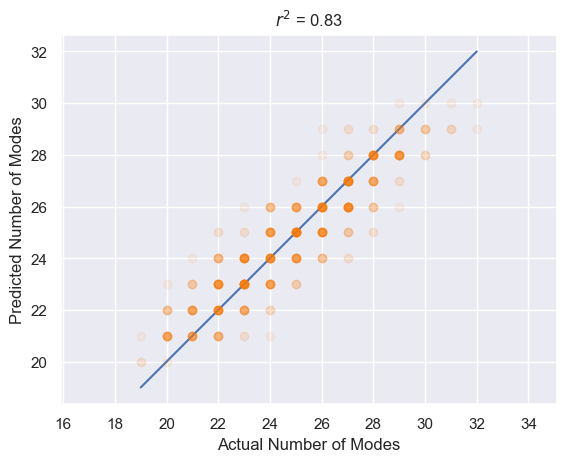

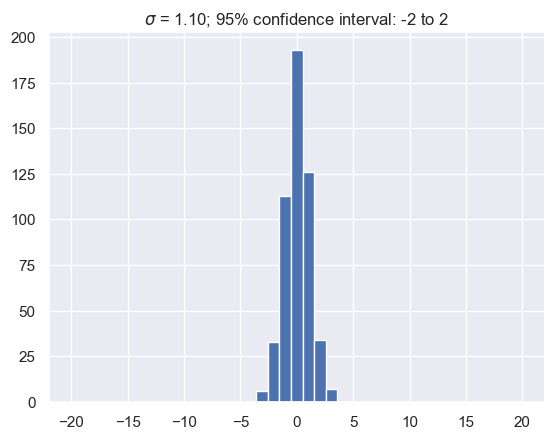

In [1022]:
#Mp = numpy.around(grid_search.predict(scaler.transform(Xvalidate))).astype(int)
#Mp = numpy.around(regressor.predict(Xvalidate)).astype(int)
Mp = numpy.around(grid_search.predict(Xvalidate)).astype(int)
err = Mvalidate - Mp

mpl.figure()
mpl.title(f'$r^2$ = {sklearn.metrics.r2_score(Mvalidate, Mp):0.2f}')
mpl.plot([Mvalidate.min(), Mvalidate.max()], [Mvalidate.min(), Mvalidate.max()])
mpl.plot(Mvalidate, Mp, 'o', c='tab:orange', alpha=0.075)
mpl.ylabel('Predicted Number of Modes')
mpl.xlabel('Actual Number of Modes')
mpl.axis('equal')
mpl.gca().xaxis.set_major_locator(matplotlib.ticker.MaxNLocator(integer=True))
mpl.show()

mpl.figure()
mpl.title(f'$\\sigma$ = {numpy.std(err):0.2f}; 95% confidence interval: {numpy.percentile(err, 2.5, method="closest_observation")} to {numpy.percentile(err, 97.5, method="closest_observation")}')
mpl.hist(err, bins=numpy.linspace(-20, 20, 40))
mpl.show()

In [1007]:
#regressor = sklearn.ensemble.ExtraTreesRegressor()
#regressor = sklearn.neural_network.MLPRegressor(5*(1000, ), max_iter=1000000, activation=activation, solver=solver)
#import sklearn.multioutput
#lgbr = lgb.LGBMRegressor(verbose=-1)
#regressor = sklearn.multioutput.MultiOutputRegressor(lgbr, n_jobs=-1)
#regressor.fit(samples_train, complex_components.fit_transform(frfs_train[:, ::10]))

#regressor = lgb.LGBMRegressor(verbose=-1)
#regressor.fit(samples_train, db(frfs_train[:, 0]))

ytrain = []
for frf in frfs_train:
    ip, _ = scipy.signal.find_peaks(abs(frf))
    ytrain.append(db(frf[ip[0]]))
ytrain = numpy.asarray(ytrain)

yvalidate = []
for frf in frfs_validate:
    ip, _ = scipy.signal.find_peaks(abs(frf))
    yvalidate.append(db(frf[ip[0]]))
yvalidate = numpy.asarray(yvalidate)

regressor = sklearn.ensemble.ExtraTreesRegressor()
#regressor = lgb.LGBMRegressor(verbose=-1)
#regressor = sklearn.ensemble.RandomForestRegressor()
regressor.fit(samples_train, ytrain)

ExtraTreesRegressor()

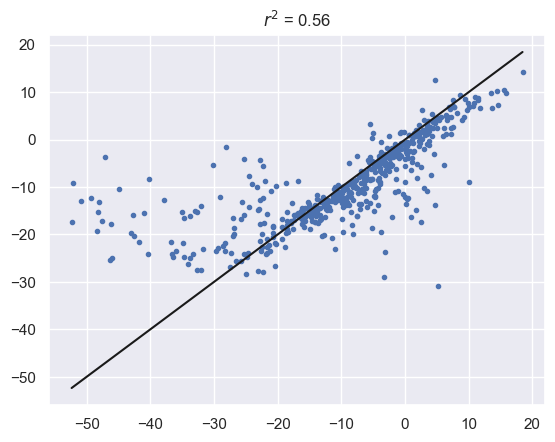

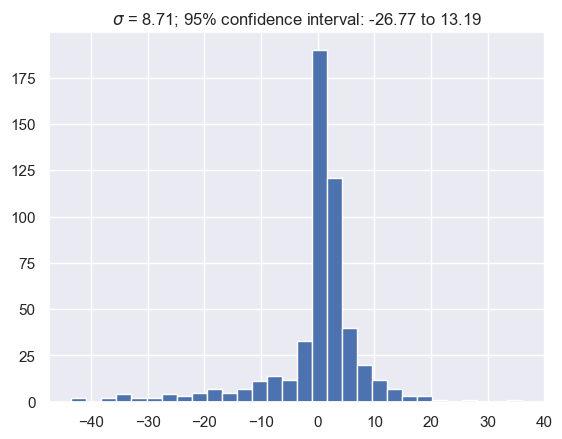

"\nk = -73\nprint(y[k])\nmpl.figure()\n#mpl.loglog(f[::10], abs(frfp[0, :]), '.')\n#mpl.loglog(f[0], y[k], 'o')\n#mpl.loglog(f, abs(frfs_validate[k, :]))\nmpl.semilogx(f, db(frfs_validate[k, :]))\nmpl.semilogx(f[0], y[k], 'o')\nmpl.show()\n"

In [951]:
yp = regressor.predict(samples_validate)
#frfp = complex_components.inverse_transform(y)

err = yvalidate - yp

mpl.figure()
mpl.title(f'$r^2$ = {sklearn.metrics.r2_score(yvalidate, yp):0.2f}')
mpl.plot(yvalidate, yp, '.')
mpl.plot(
    [yvalidate.min(), yvalidate.max()],
    [yvalidate.min(), yvalidate.max()], 'k'
)
mpl.show()

mpl.figure()
mpl.title(f'$\\sigma$ = {numpy.std(err):0.2f}; 95% confidence interval: {numpy.percentile(err, 2.5, method="closest_observation"):0.2f} to {numpy.percentile(err, 97.5, method="closest_observation"):0.2f}')
mpl.hist(err, bins=30)
mpl.show()

"""
k = -73
print(y[k])
mpl.figure()
#mpl.loglog(f[::10], abs(frfp[0, :]), '.')
#mpl.loglog(f[0], y[k], 'o')
#mpl.loglog(f, abs(frfs_validate[k, :]))
mpl.semilogx(f, db(frfs_validate[k, :]))
mpl.semilogx(f[0], y[k], 'o')
mpl.show()
"""

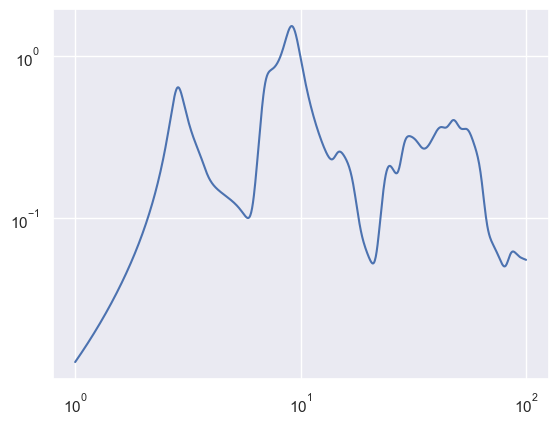

In [859]:
mpl.figure()
mpl.loglog(f, abs(frfs_validate[0, :]))
mpl.show()

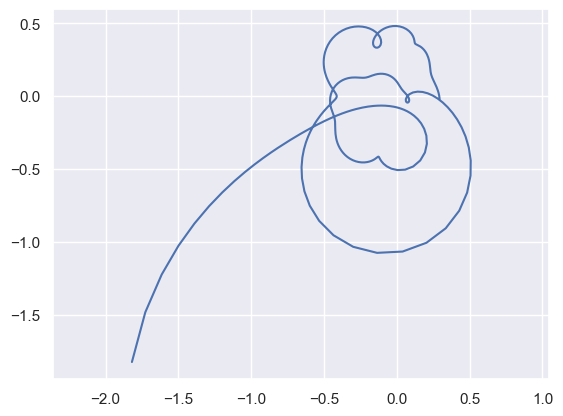

In [871]:
mpl.figure()
mpl.plot(frfs_train[0, -400:].real, frfs_train[0, -400:].imag)
mpl.axis('equal')
mpl.show()

(32, 4)

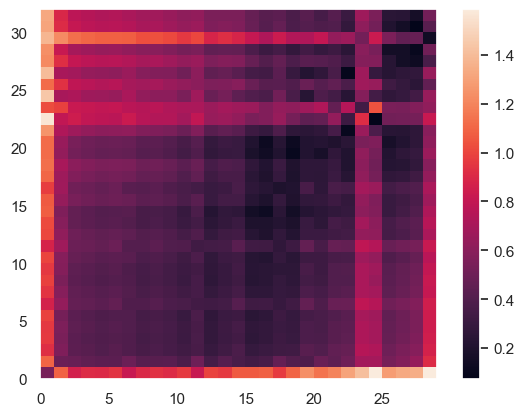

In [338]:
scaler = sklearn.preprocessing.MinMaxScaler()
Dm = scipy.spatial.distance.cdist(
    scaler.fit_transform(
        numpy.column_stack([poles_i.real, poles_i.imag, residues_i.real, residues_i.imag])
    ),
    scaler.fit_transform(
        numpy.column_stack([poles_j.real, poles_j.imag, residues_j.real, residues_j.imag])
    ),
    #complex_components.fit_transform(modes_i),
    #complex_components.fit_transform(modes_j),
    #metric='canberra'
)

mpl.figure()
mpl.pcolormesh(Dm)
mpl.colorbar()
mpl.show()

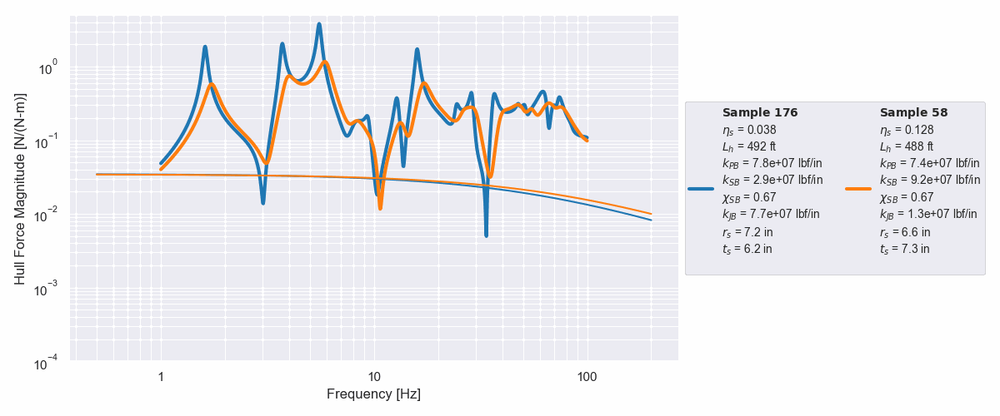

In [339]:
ims, jms = scipy.optimize.linear_sum_assignment(Dm)

gif = mpl.AnimatedGif()

for im, jm in zip(ims, jms):
    fig = mpl.figure(figsize=(12, 5))
    sample = samples_train[i]
    mpl.loglog(
        f, abs(frf_i), c='tab:blue', lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(i) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    sample = samples_train[j]
    mpl.loglog(
        f, abs(frf_j), c='tab:orange', lw=3,
        label=(
            '$\\mathbf{Sample\\ ' + str(j) + '}$\n'
            f'$\\eta_s$ = {sample[0]:.3f}\n'
            f'$L_h$ = {sample[-1]:.0f} ft\n'
            f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in\n'
            f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in\n'
            f'$\\chi_{{SB}}$ = {sample[3]:.2f}\n'
            f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in\n'
            f'$r_{{s}}$ = {sample[5]:.1f} in\n'
            f'$t_s$ = {sample[6]:.1f} in\n'
        )
    )
    mpl.loglog(fm, abs(modes_i[im, :]), c='tab:blue')
    mpl.loglog(fm, abs(modes_j[jm, :]), c='tab:orange')
    mpl.ylim(1e-4, 5)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    mpl.legend(ncol=3, fontsize='10', loc='center left', bbox_to_anchor=(1, 0.5))
    mpl.tight_layout()
    gif.add_frame(fig, close=True)

gif.save('mode-matching.gif', duration=0.5, loop=-1)
display_image('mode-matching.gif')

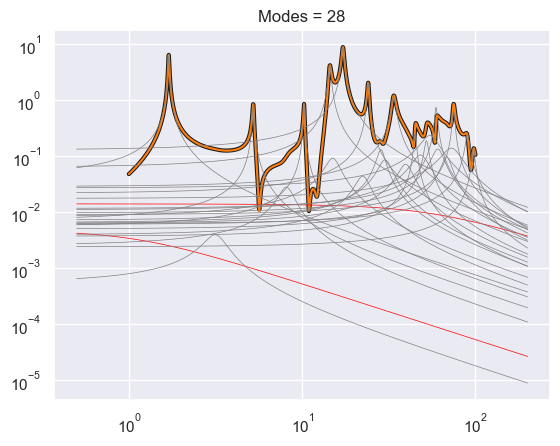

In [229]:
i = -41
frf_i = frfs_train[i, :]
b = BarycentricRationalInterpolator.aaa(1j*f, frf_i, tol=1e-4)

k = numpy.argsort(b.poles.imag)
poles = b.poles[k]
residues = fit_residues(f, frf_i, poles)

mpl.figure()
mpl.title(f'Modes = {len(b)}')
mpl.loglog(f, abs(frf_i), c='k', lw=3)
mpl.loglog(f, abs(b(1j*f)), c='tab:orange')
for pole, residue in zip(poles, residues):
    if pole.imag < 0:
        cc = 'red'
    else:
        cc = 'grey'
    mode = residue/(1j*fm - pole)
    mpl.loglog(fm, abs(mode), lw=0.5, c=cc)
mpl.show()

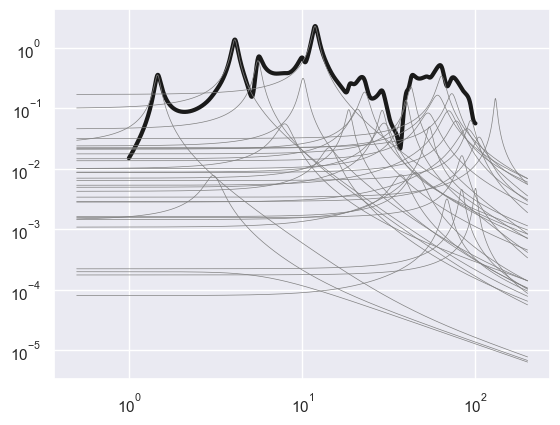

In [211]:
mpl.figure()
mpl.loglog(f, abs(frf_i), 'k', lw=3)
for mode in modes_i:
    mpl.loglog(fm, abs(mode(fm)), 'grey', lw=0.5)
mpl.show()

In [195]:
def objective(u):
    frf = frf_i
    poles = -u[0::2]*u[1::2] + 1j*u[1::2]
    C = 1/(1j*f[:, None] - poles[None, :])
    residues, _, _, _ = numpy.linalg.lstsq(C, frf, rcond=None)
    residuals = frf - C.dot(residues)
    return numpy.hstack((residuals.real, residuals.imag))
    #return numpy.linalg.norm(residuals, ord=2)

#M = 33
#bounds = []
#for m in range(M):
#    bounds.append((0, 0.2))
#    bounds.append((0, 200))
#solution = scipy.optimize.differential_evolution(objective, bounds, workers=-1, disp=True)
M = len(modes_i)
poles = modes_i.poles
u = numpy.zeros(2*M)
u[0::2] = abs(poles.real/poles.imag)
u[1::2] = poles.imag
solution = scipy.optimize.least_squares(objective, u)

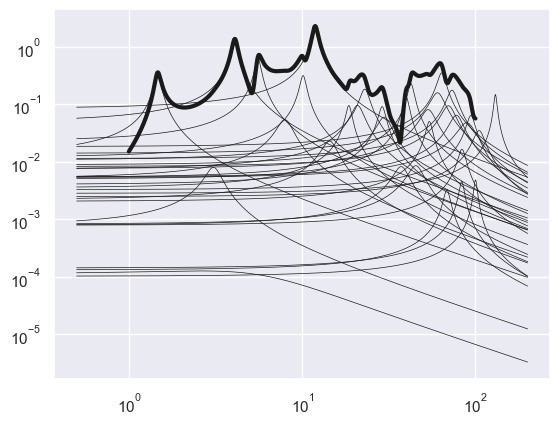

In [199]:
u = solution.x
poles = -u[0::2]*u[1::2] + 1j*u[1::2]
C = 1/(1j*f[:, None] - poles[None, :])
residues, _, _, _ = numpy.linalg.lstsq(C, frf, rcond=None)

mpl.figure()
mpl.loglog(f, abs(frf_i), 'k', lw=3)
#for pole, residue in zip(poles, residues):
#    mode = residue/(1j*fm - pole) #+ residue.conj()/(1j*f - pole.conj())
#    mpl.loglog(fm, abs(mode), 'k', lw=0.5)
for pole, residue in zip(modes_i.poles, modes_i.residues):
    mode = residue/(1j*fm - pole)
    mpl.loglog(fm, abs(mode), 'k', lw=0.5)
mpl.show()

In [182]:
def make_objective(f, frf):
    def objective(u):
        poles = -u[0::2]*u[1::2] + 1j*u[1::2]
        residues = fit_residues(
            numpy.hstack((-f, f)),
            numpy.hstack((frf.conj(), frf)),
            numpy.hstack((poles.conj(), poles)),
        )
        C = 1/(1j*f[:, None] - poles[None, :])
        frfp = C.dot(residues)
        residuals = frf - frfp
        return numpy.hstack((residuals.real, residuals.imag))
    return objective

objective = make_objective(f, frf)
poles = modes_i.poles
u = numpy.zeros(2*len(poles))
zeta = abs(poles.real/poles.imag)
zeta[zeta > 1] = 1
u[0::2] = zeta
u[1::2] = poles.imag

In [174]:
"""
def fit_residues(f, frf, poles):
    C = 1/(1j*f[:, None] - poles[None, :])
    residues, _, _, _ = numpy.linalg.lstsq(C, frf, rcond=None)
    return residues

def fit(cls, f, frf, *args, **kwargs):
    f = numpy.hstack((-f, f))
    frf = numpy.hstack((frf.conj(), frf))
    aaa = BarycentricRationalInterpolator.aaa(1j*f, frf, *args, **kwargs)
    denominator = 1
    for pole in aaa.poles:
        denominator *= numpy.polynomial.Polynomial([-pole, 1])
    denominator = numpy.polynomial.Polynomial(denominator.coef.real)
    poles = denominator.roots()
    poles = numpy.asarray(
        [pole for pole in poles if pole.imag > 0 and pole.real < 0]
    )
    poles = numpy.hstack((poles.conj(), poles))
    residues = fit_residues(f, frf, poles)
    _, poles = numpy.hsplit(poles, 2)
    residues = numpy.hsplit(residues, 2)
    residues = (residues[0].conj() + residues[1])/2
    i = numpy.argsort(poles.imag)
    poles = poles[i]
    residues = residues[i]
    modes = cls(poles, residues)
    modes.fit_history = {
        'f': f,
        'frf': frf,
        'aaa': aaa,
    }
    return modes
"""

"\ndef fit_residues(f, frf, poles):\n    C = 1/(1j*f[:, None] - poles[None, :])\n    residues, _, _, _ = numpy.linalg.lstsq(C, frf, rcond=None)\n    return residues\n\ndef fit(cls, f, frf, *args, **kwargs):\n    f = numpy.hstack((-f, f))\n    frf = numpy.hstack((frf.conj(), frf))\n    aaa = BarycentricRationalInterpolator.aaa(1j*f, frf, *args, **kwargs)\n    denominator = 1\n    for pole in aaa.poles:\n        denominator *= numpy.polynomial.Polynomial([-pole, 1])\n    denominator = numpy.polynomial.Polynomial(denominator.coef.real)\n    poles = denominator.roots()\n    poles = numpy.asarray(\n        [pole for pole in poles if pole.imag > 0 and pole.real < 0]\n    )\n    poles = numpy.hstack((poles.conj(), poles))\n    residues = fit_residues(f, frf, poles)\n    _, poles = numpy.hsplit(poles, 2)\n    residues = numpy.hsplit(residues, 2)\n    residues = (residues[0].conj() + residues[1])/2\n    i = numpy.argsort(poles.imag)\n    poles = poles[i]\n    residues = residues[i]\n    modes =

In [183]:
u[0::2]

array([0.03676083, 1.        , 0.09855698, 0.03664847, 0.03711057,
       0.09731961, 0.03831295, 0.03711599, 0.0977439 , 0.03710361,
       0.07875551, 0.05895405, 0.04433743, 0.09051472, 0.09650351,
       0.03692698, 0.0390421 , 0.09743185, 0.09493371, 0.04089687,
       0.08871976, 0.0525195 , 0.04056133, 0.08778768, 0.06438708,
       0.08528674, 0.03132196, 0.04757302, 0.11195956, 0.05126484,
       0.0210079 , 0.07089226, 0.01906274])

In [184]:
u[1::2]

array([  1.46431792,   2.54295338,   3.07576436,   4.08761587,
         5.56239029,   7.95473234,  10.12814938,  11.87395049,
        14.38661242,  18.59478628,  20.87745138,  22.96216839,
        28.95392159,  29.74740263,  37.25754289,  39.7748626 ,
        42.45225758,  45.30904831,  53.33965533,  54.1721465 ,
        60.41118876,  63.8298824 ,  68.43513978,  69.83331975,
        73.24628024,  77.5965067 ,  83.36543583,  83.61419455,
        89.02267462,  94.1479969 , 100.11004943, 104.88896484,
       130.39255303])

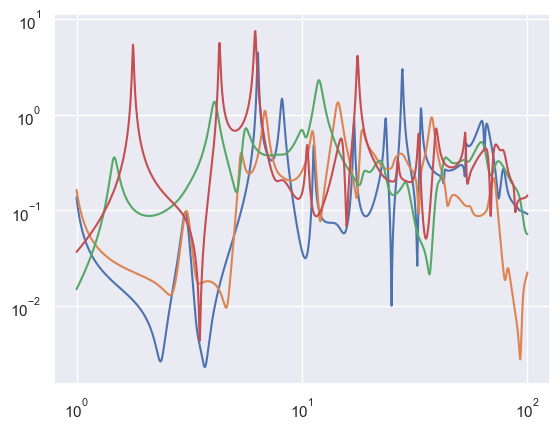

In [106]:
mpl.figure()
for k in kMmax:
    mpl.loglog(f, abs(frfs_train[k, :]))
mpl.show()

In [21]:
def walk_distance_matrix(D):
    Ns = len(D)
    D += numpy.diag(numpy.inf*numpy.ones(Ns))
    i, j = numpy.unravel_index(D.argmin(), D.shape)
    D[i, j] = numpy.inf
    D[j, i] = numpy.inf
    path = [[i, j]]
    visited = [i, j]
    unvisited = [j for j in range(Ns) if j not in set(visited)]
    while len(visited) < Ns:
        ii, jj = numpy.unravel_index(
            D[visited, :][:, unvisited].argmin(),
            (len(visited), len(unvisited))
        )
        i = visited[ii]
        j = unvisited[jj]
        path.append([i, j])
        visited.append(j)
        unvisited.remove(j)
    return numpy.asarray(path)

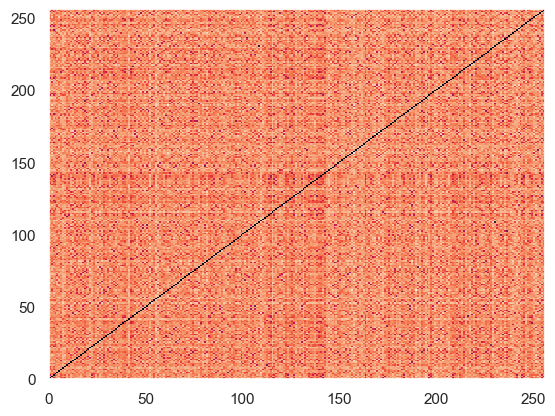

In [22]:
if True:
    complex_components = ComplexComponents()
    D = scipy.spatial.distance.squareform(
        scipy.spatial.distance.pdist(
            complex_components.fit_transform(frfs_train),
            metric='canberra'
        )
    )
    mpl.figure()
    mpl.pcolormesh(D)
    mpl.show()
else:
    D = scipy.spatial.distance.squareform(
        scipy.spatial.distance.pdist(
            sklearn.preprocessing.StandardScaler().fit_transform(samples_train),
            metric='euclidean'
        )
    )
path = walk_distance_matrix(D)

In [36]:
i, j = path[0, :]

In [ ]:
k = 95
#fp = exp(1j*pi*f/f.max())
baryrat = BarycentricRationalInterpolator.aaa(
    #numpy.hstack((-1j*f, 1j*f)),
    #numpy.hstack((frfs_train[k, :].conj(), frfs_train[k, :])),
    #fp,
    #frfs_train[k, :],
    1j*f,
    frfs_train[k, :],
    tol=1e-5,
)

#poles = numpy.asarray([
#    pole for pole in baryrat.poles if pole.imag > 0 and pole.real < 0
#])

"""
residues = estimate_residues(f, frf, poles)
C = 1/(1j*f[:, None] - poles[None, :])
Hp = C.dot(residues)
"""
"""
C = 1/(1j*f[:, None] - poles[None, :])
Cc = 1/(1j*f[:, None] - poles.conj()[None, :])
residues, _, _, _ = numpy.linalg.lstsq(C, frfs_train[k, :], rcond=None)
Hp = C.dot(residues) #+ Cc.dot(residues.conj())
"""

poles = baryrat.poles

mpl.figure()
mpl.loglog(f, abs(frfs_train[k, :]), c='k', lw=3, label='data')
#mpl.loglog(f, abs(Hp), c='tab:orange', lw=1, label='fit')
mpl.loglog(f, abs(baryrat(1j*f)), c='tab:orange', lw=1, label='fit')
mpl.show()

In [ ]:
i = numpy.argsort(poles.imag)
poles[i], poles[i].real/poles[i].imag

In [ ]:
i = numpy.argsort(poles.imag)
poles[i]

In [ ]:
k = 91
#fp = exp(1j*pi*f/f.max())
baryrat = BarycentricRationalInterpolator.aaa(
    #numpy.hstack((-1j*f, 1j*f)),
    #numpy.hstack((frfs_train[k, :].conj(), frfs_train[k, :])),
    #f,
    #frfs_train[k, :],
    1j*f,
    frfs_train[k, :],
    tol=1e-4,
)

poles = numpy.asarray([
    pole for pole in baryrat.poles if pole.imag > 0 and pole.real < 0
])


residues = estimate_residues(f, frf, poles)

print(poles.shape, residues.shape)

"""
#C = 1/((1j*f[:, None] - poles[None, :])*(1j*f[:, None] - poles.conj()[None, :]))
#C = 1/(1j*f[:, None] - poles[None, :])
A = numpy.column_stack((
    C*(1j*f[:, None] - poles[None, :]), C*(1j*f[:, None] - poles[None, :].conj())
    #1/(1j*f[:, None] - poles[None, :]), 1/(1j*f[:, None] - poles[None, :].conj())
))
#C = 1/(1j*f[:, None] - poles[None, :])
#residues, _, _, _ = numpy.linalg.lstsq(C, frfs_train[k, :], rcond=None)
residues, _, _, _ = numpy.linalg.lstsq(A, frfs_train[k, :], rcond=None)
#Hp = C.dot(residues)
Hp = A.dot(residues)
"""
"""
poles = baryrat.poles
residues = baryrat.residues
"""

fi = numpy.logspace(log10(0.5), log10(150), 1000)

mpl.figure()
mpl.loglog(f, abs(frfs_train[k, :]), c='k', lw=3, label='data')
#mpl.loglog(f, abs(baryrat(1j*f)), c='tab:orange', lw=1, label='fit')
mpl.loglog(f, abs(baryrat(f)), c='tab:orange', lw=1, label='fit')

"""
#mpl.loglog(f, abs(Hp), c='tab:orange', lw=1, label='fit')
Hp = 0
for pole, residue in zip(poles, residues):
    #Hm = residue/(1j*fi - pole)
    Hm = residue/(1j*fi - pole) + residue.conj()/(1j*fi - pole.conj())
    #Hm = residue/((1j*fi - pole)*(1j*fi - pole.conj()))
    Hp += Hm
    if pole.imag < 0:
        mpl.loglog(fi, abs(Hm), c='red', lw=0.5)
    elif pole.real > 0:
        mpl.loglog(fi, abs(Hm), c='blue', lw=0.5)
    else:
        mpl.loglog(fi, abs(Hm), c='grey', lw=0.5)
        #Hp += Hm

mpl.loglog(fi, abs(Hp), c='tab:orange', lw=1, label='fit')
"""
mpl.legend()
mpl.show()

In [ ]:
i = numpy.argsort(baryrat.poles.imag)
baryrat.poles[i].imag/baryrat.poles[i].real

In [ ]:
i = numpy.argsort(baryrat.poles.imag)
#f.max()*log(baryrat.poles)/pi#/(1j*pi)
baryrat.poles[i]
#baryrat.residues[i]

In [ ]:
i = numpy.argsort(baryrat.poles.imag)
#f.max()*log(baryrat.poles)/pi#/(1j*pi)
baryrat.poles[i][baryrat.poles[i].imag > 0]

In [ ]:
i = numpy.argsort(baryrat.poles.imag)
print(baryrat.poles[i])
poles = baryrat.poles
residues = baryrat.residues


In [ ]:
y_train = []
X_train = []
k = 0
for i, modes in enumerate(modes_train):
    poles = modes.poles
    residues = modes.residues
    pole = poles[poles.imag > 0][k]
    residue = residues[poles.imag > 0][k]
    if pole.real < 0:
        X_train.append(samples_train[i, :])
        y_train.append(pole.imag)
y_validate = []
X_validate = []
for i, modes in enumerate(modes_validate):
    poles = modes.poles
    residues = modes.residues
    pole = poles[poles.imag > 0][k]
    residue = residues[poles.imag > 0][k]
    if pole.real < 0:
        X_validate.append(samples_validate[i, :])
        y_validate.append(pole.imag)
X_train = numpy.asarray(X_train)
y_train = numpy.asarray(y_train)
X_validate = numpy.asarray(X_validate)
y_validate = numpy.asarray(y_validate)

In [ ]:
#regressor = lgb.LGBMRegressor(verbose=-1)
regressor = sklearn.ensemble.GradientBoostingRegressor(max_depth=5, n_estimators=1000)
regressor.fit(X_train, y_train)

y_predict = regressor.predict(X_validate)

mpl.figure()
mpl.title(
    f'$R^2$ = {sklearn.metrics.r2_score(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, '.')
mpl.plot([y_validate.min(), y_validate.max()], [y_validate.min(), y_validate.max()], 'k')
mpl.xlabel('True')
mpl.ylabel('Predicted')
mpl.grid(True, which='both')
#mpl.gca().xaxis.set_major_formatter(
#    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
#)
mpl.show()

err = y_predict - y_validate
mpl.figure()
mpl.hist(err, bins=100)
mpl.xlabel('Error')
mpl.ylabel('Count')
mpl.grid(True, which='both')
mpl.show()

In [ ]:
mpl.figure()
mpl.hist([len(modes) for modes in modes_train], bins=numpy.arange(10, 40))
mpl.show()

In [ ]:
interpolant = scipy.interpolate.RBFInterpolator(X_train, y_train)
y_predict = interpolant(X_validate)

mpl.figure()
mpl.title(
    f'$R^2$ = {sklearn.metrics.r2_score(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, '.')
mpl.plot([y_validate.min(), y_validate.max()], [y_validate.min(), y_validate.max()], 'k')
mpl.xlabel('True')
mpl.ylabel('Predicted')
mpl.grid(True, which='both')
#mpl.gca().xaxis.set_major_formatter(
#    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
#)
mpl.show()

err = y_predict - y_validate
mpl.figure()
mpl.hist(err, bins=100)
mpl.xlabel('Error')
mpl.ylabel('Count')
mpl.grid(True, which='both')
mpl.show()

In [ ]:
from smt.surrogate_models import KRG, KPLSK, IDW, RBF

#sm = KRG(theta0=[1e-2])
#sm = KPLSK(theta0=[1e-2])
#sm = IDW(p=2)
sm = RBF(d0=5)
sm.set_training_values(X_train, y_train)
sm.train()

y_predict = sm.predict_values(X_validate).flatten()

mpl.figure()
mpl.title(
    f'$R^2$ = {sklearn.metrics.r2_score(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, '.')
mpl.plot([y_validate.min(), y_validate.max()], [y_validate.min(), y_validate.max()], 'k')
mpl.xlabel('True')
mpl.ylabel('Predicted')
mpl.grid(True, which='both')
#mpl.gca().xaxis.set_major_formatter(
#    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
#)
mpl.show()

err = y_predict - y_validate
mpl.figure()
mpl.hist(err, bins=100)
mpl.xlabel('Error')
mpl.ylabel('Count')
mpl.grid(True, which='both')
mpl.show()

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error

regressor = xgb.XGBRegressor()
regressor.fit(X_train, y_train)

y_predict = regressor.predict(X_validate)

mpl.figure()
mpl.title(
    f'{sklearn.metrics.explained_variance_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.r2_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.max_error(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, '.')
mpl.plot([y_validate.min(), y_validate.max()], [y_validate.min(), y_validate.max()], 'k')
mpl.xlabel('True')
mpl.ylabel('Predicted')
mpl.grid(True, which='both')
#mpl.gca().xaxis.set_major_formatter(
#    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
#)
mpl.show()

In [ ]:
y_train = []
X_train = []
j = 0
for i in range(Ns):
    ipeak, _ = scipy.signal.find_peaks(abs(frfs_train[i, :]))
    y_train.append(f[ipeak[j]])
    X_train.append(samples_train[i, :])

y_validate = []
X_validate = []
for i in range(2*Ns):
    ipeak, _ = scipy.signal.find_peaks(abs(frfs_validate[i, :]))
    y_validate.append(f[ipeak[j]])
    X_validate.append(samples_validate[i, :])

X_train = numpy.asarray(X_train)
y_train = numpy.asarray(y_train)
X_validate = numpy.asarray(X_validate)
y_validate = numpy.asarray(y_validate)

In [ ]:
import sklearn.metrics
scaler = sklearn.preprocessing.MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_validate = scaler.transform(X_validate)

regressor = sklearn.neural_network.MLPRegressor(
    (2000, 1000, 100, 1000, 2000),
    #(256, 128, 128, 128, 256),
    activation='tanh',
    solver='adam',
    #learning_rate='adaptive',
    #learning_rate_init=3e-4,
    max_iter=100000,
)

#regressor = sklearn.ensemble.AdaBoostRegressor(n_estimators=100)
#regressor = sklearn.ensemble.GradientBoostingRegressor(n_estimators=1000)
#regressor = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
#regressor = sklearn.ensemble.ExtraTreesRegressor(n_estimators=1000)
regressor.fit(X_train, y_train)

y_predict = regressor.predict(X_validate)

mpl.figure()
mpl.title(
    f'{sklearn.metrics.explained_variance_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.r2_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.max_error(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, 'o')
mpl.ylabel('Predicted')
mpl.xlabel('Actual')
mpl.show()

In [ ]:
import lightgbm as lgb

regressor = lgb.LGBMRegressor()#boosting_type='dart')
regressor.fit(X_train, y_train)

y_predict = regressor.predict(X_validate)

mpl.figure()
mpl.title(
    f'{sklearn.metrics.explained_variance_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.r2_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.max_error(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, 'o')
mpl.show()

In [ ]:
y_train = []
X_train = []
k = 3
for i, modes in enumerate(modes_train):
    poles = modes.poles
    pole = poles[poles.imag > 0][k]
    if pole.real < 0:
        X_train.append(samples_train[i, :])
        y_train.append(pole.imag)
y_validate = []
X_validate = []
for i, modes in enumerate(modes_validate):
    poles = modes.poles
    pole = poles[poles.imag > 0][k]
    if pole.real < 0:
        X_validate.append(samples_validate[i, :])
        y_validate.append(pole.imag)
X_train = numpy.asarray(X_train)
y_train = numpy.asarray(y_train)
X_validate = numpy.asarray(X_validate)
y_validate = numpy.asarray(y_validate)

In [ ]:
import sklearn.metrics
scaler = sklearn.preprocessing.MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_validate = scaler.transform(X_validate)
"""
regressor = sklearn.neural_network.MLPRegressor(
    #(128, 64, 32, 64, 128),
    (256, 128, 128, 128, 256),
    activation='tanh',
    solver='adam',
    #learning_rate='adaptive',
    #learning_rate_init=3e-4,
    max_iter=100000,
)
"""
#regressor = sklearn.ensemble.AdaBoostRegressor(n_estimators=100)
#regressor = sklearn.ensemble.GradientBoostingRegressor(n_estimators=1000)
regressor = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
#regressor = sklearn.ensemble.ExtraTreesRegressor(n_estimators=1000)
regressor.fit(X_train, y_train)

y_predict = regressor.predict(X_validate)

mpl.figure()
mpl.title(
    f'{sklearn.metrics.explained_variance_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.r2_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.max_error(y_validate, y_predict):.3f}'
)
mpl.loglog(y_validate, y_predict, 'o')
mpl.loglog([1, 100], [1, 100], 'k--')
mpl.ylabel('Predicted')
mpl.xlabel('Actual')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.show()

In [ ]:
import lightgbm as lgb

regressor = lgb.LGBMRegressor(verbose=-1)#, boosting_type='dart')
regressor.fit(X_train, y_train)

y_predict = regressor.predict(X_validate)

mpl.figure()
mpl.title(
    f'{sklearn.metrics.explained_variance_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.r2_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.max_error(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, 'o')
mpl.show()

In [ ]:
interpolant = scipy.interpolate.RBFInterpolator(X_train, y_train)
y_predict = interpolant(X_validate)

mpl.figure()
mpl.title(
    f'{sklearn.metrics.explained_variance_score(y_validate, y_predict):.3f}, '
    f'{sklearn.metrics.r2_score(y_validate, y_predict):.3f}'
)
mpl.plot(y_validate, y_predict, 'o')
mpl.show()

In [ ]:
M = 0
bs = []
for i in tqdm.tqdm(range(Ns)):
    b = BarycentricRationalInterpolator.aaa(1j*f, frfs_by_L[i, :], tol=1e-4)
    #M = max(M, len(b))
    b.polres()
    bs.append(b)

"""
bs = []
for i in tqdm.tqdm(range(Ns)):
    b = BarycentricRationalInterpolator.aaa(1j*f, frfs_by_L[i, :], tol=1e-5, M=M)
    b.polres()
    bs.append(b)
"""

In [ ]:
gif = mpl.AnimatedGif()
fig = mpl.figure()
axis = mpl.gca()
fi = numpy.logspace(log10(0.5), log10(200), 1000)
for i, (Li, bi, frf) in tqdm.tqdm(enumerate(zip(Ls, bs, frfs_by_L))):
    mpl.title(f'$L_h$ = {Li:.1f} ft')
    mpl.loglog(f, abs(frf), c='k', lw=3)
    mpl.loglog(f, abs(bi(1j*f)), c='tab:orange')
    for pi, ri in zip(bi.poles, bi.residues):
        if pi.imag < 0: continue
        #if pi.imag > f.max(): continue
        Hm = ri/(1j*fi - pi)
        mpl.loglog(fi, abs(Hm), 'k', lw=0.25)
    mpl.ylim(1e-4, 5)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    if i == 0:
        fig.tight_layout()
    gif.add_frame(fig)
    axis.clear()

mpl.close(fig)
gif.save('length-variation-modes.gif', duration=0.1, loop=-1)
display_image('length-variation-modes.gif')

In [ ]:
class Mode:

    def __init__(self, pole, residue):
        self.pole = pole
        self.residue = residue

    def __call__(self, f):
        pole = self.pole
        residue = self.residue
        return residue/((1j*f - pole)*(1j*f - pole.conj()))

    def __repr__(self):
        return f'{self.__class__.__name__}(pole={self.pole}, residue={self.residue})'


class Modes:

    def __init__(self, poles, residues):
        self.poles = poles
        self.residues = residues
        self.M = len(poles)
        self.modes = [Mode(pole, residue) for pole, residue in zip(poles, residues)]

    def __repr__(self):
        return f'{self.__class__.__name__}(poles={self.poles}, residues={self.residues})'

    @classmethod
    def fit(cls, f, frf, tol=1e-5, force_stability=False):
        aaa = BarycentricRationalInterpolator.aaa(
            numpy.hstack((-1j*f, 1j*f)),
            numpy.hstack((frf.conj(), frf)),
            tol=tol, Mmax=1000,
        )
        n, d = scipy.signal.invres(aaa.residues, aaa.poles, [])
        poles = numpy.roots(d.real)
        poles = poles[poles.imag >= 0]
        i = numpy.argsort(-1j*poles)
        poles = poles[i]
        if force_stability:
            poles = poles[poles.real <= 0]
        C = 1/((1j*f[:, None] - poles[None, :])*(1j*f[:, None] - poles.conj()[None, :]))
        residues, _, _, _ = numpy.linalg.lstsq(C, frf, rcond=None)
        modes = cls(poles, residues)
        modes.fit_history = {
            'f': f,
            'frf': frf,
            'aaa': aaa,
        }
        return modes

    def __len__(self):
        return self.M

    def __call__(self, f):
        poles = self.poles
        residues = self.residues
        C = 1/((1j*f[:, None] - poles[None, :])*(1j*f[:, None] - poles.conj()[None, :]))
        return C.dot(residues)

In [ ]:
def _fit(frf, **kwargs):
    return Modes.fit(f, frf, **kwargs)

def decompose_modes(f, frfs, **kwargs):
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = executor.map(_fit, frfs)
        modes = [future for future in tqdm.tqdm(futures, total=len(frfs))]
    return modes

In [ ]:
if True:
    modes_train = decompose_modes(f, frfs_train, tol=1e-2)
    modes_validate = decompose_modes(f, frfs_validate, tol=1e-2)
    modes_by_L = decompose_modes(f, frfs_by_L, tol=1e-2)
    with gzip.open('modes.pkl.gz', 'wb') as fd:
        pickle.dump((modes_train, modes_validate, modes_by_L), fd)
else:
    with gzip.open('modes.pkl.gz', 'rb') as fd:
        modes_train, modes_validate, modes_by_L = pickle.load(fd)

In [ ]:
gif = mpl.AnimatedGif()
fig = mpl.figure()
axis = mpl.gca()
for i, (Li, frf) in tqdm.tqdm(enumerate(zip(Ls, frfs_by_L))):
    mpl.title(f'$L_h$ = {Li:.1f} ft')
    mpl.loglog(f, abs(frf), c='k', lw=3)
    mpl.loglog(f, abs(modes_by_L[i](f)), c='tab:orange', lw=1)
    for mode in modes_by_L[i].modes:
        #if mode.pole.imag <= 0: continue
        #if mode.pole.imag >= f.max(): continue
        mpl.loglog(fi, abs(mode(fi)), lw=0.25, c='k')
    mpl.ylim(1e-4, 3)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    if i == 0:
        fig.tight_layout()
    gif.add_frame(fig)
    axis.clear()

mpl.close(fig)
gif.save('length-variation-modes-2.gif', duration=0.1, loop=-1)
display_image('length-variation-modes-2.gif')

In [ ]:
fig, axes = mpl.subplots(1, 3, figsize=(12, 4))
fm = numpy.logspace(log10(0.5), log10(200), 1000)
for k, i in enumerate([0, 55, 221]):
    sample = samples_train[i]
    modes = modes_train[i]
    axes[k].loglog(f, abs(frfs_train[i, :]), 'k', lw=3)
    axes[k].loglog(f, abs(modes(f)), 'tab:orange', lw=1)
    for mode in modes.modes:
        axes[k].loglog(fm, abs(mode(fm)), 'k', lw=0.25)
    axes[k].set_title(
        f'Sample {i}\n'
        f'$\\eta$ = {sample[0]:.3f}, '
        f'$L_h$ = {sample[-1]:.0f} ft, '
        f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in,\n'
        f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in, '
        f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in'
    )
    axes[k].grid(True, which='both')
    axes[k].set_xlabel('Frequency [Hz]')
    axes[k].set_ylabel('Hull Force Magnitude [N/(N-m)]')
    axes[k].xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    axes[k].set_ylim(1e-3, 10)

fig.tight_layout()
mpl.show()

In [ ]:
"""
real
rre 2*pre*(-f**2 - pim**2 - pre**2)/((f**2 - 2*f*pim + pim**2 + pre**2)*(f**2 + 2*f*pim + pim**2 + pre**2))
rim 2*pim*(f**2 - pim**2 - pre**2)/(f**4 - 2*f**2*pim**2 + 2*f**2*pre**2 + pim**4 + 2*pim**2*pre**2 + pre**4)

imaginary
rre 2*f*(-f**2 + pim**2 - pre**2)/(f**4 - 2*f**2*pim**2 + 2*f**2*pre**2 + pim**4 + 2*pim**2*pre**2 + pre**4)
rim -4*f*pim*pre/((f**2 - 2*f*pim + pim**2 + pre**2)*(f**2 + 2*f*pim + pim**2 + pre**2))
"""

def estimate_residues(f, frf, poles):
    f = f[:, None]
    p = poles[None, :]
    pre = p.real
    pim = p.imag
    Are = numpy.column_stack((
        2*pre*(-f**2 - pim**2 - pre**2)/((f**2 - 2*f*pim + pim**2 + pre**2)*(f**2 + 2*f*pim + pim**2 + pre**2)),
        2*pim*(f**2 - pim**2 - pre**2)/(f**4 - 2*f**2*pim**2 + 2*f**2*pre**2 + pim**4 + 2*pim**2*pre**2 + pre**4)
    ))
    Aim = numpy.column_stack((
        2*f*(-f**2 + pim**2 - pre**2)/(f**4 - 2*f**2*pim**2 + 2*f**2*pre**2 + pim**4 + 2*pim**2*pre**2 + pre**4),
        -4*f*pim*pre/((f**2 - 2*f*pim + pim**2 + pre**2)*(f**2 + 2*f*pim + pim**2 + pre**2)),
    ))
    A = numpy.vstack((Are, Aim))
    b = numpy.hstack((frf.real, frf.imag))
    print(A.shape, b.shape)
    r, _, _, _ = numpy.linalg.lstsq(A, b, rcond=None)
    rre, rim = numpy.hsplit(r, 2)
    return rre - 1j*rim

In [ ]:
i = 10
mpl.figure()
mpl.loglog(f, abs(frfs_train[i, :]), 'k', lw=3)
mpl.loglog(f, abs(modes_train[i](f)), c='tab:orange')
mpl.show()

In [ ]:
frf = frfs_train[13, :]
modes = Modes.fit(f, frf)

mpl.figure()
mpl.loglog(f, abs(frf), label='True')
mpl.loglog(f, abs(modes(f)), label='Fit')
mpl.legend()
mpl.show()

In [ ]:
frf = frfs_train[13, :]
frfp = modal_decomposition(f, frf)
poles = frfp.poles
residues = frfp.residues

mpl.figure()
mpl.title(f'{len(poles)} poles')
mpl.loglog(f, abs(frf), 'k', lw=3)
mpl.loglog(f, abs(frfp(f)), c='tab:orange')
fi = numpy.logspace(log10(0.5), log10(200), 1000)
for pi, ri in zip(poles, residues):
    Hm = ri/((1j*fi - pi)*(1j*fi - pi.conj()))
    #Hm = ri/((1j*fi - pi)) #+ ri.conj()/((1j*fi - pi.conj()))
    mpl.loglog(fi, abs(Hm), 'k', lw=0.25)

mpl.grid(True, which='both')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
mpl.ylim(1e-5)
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.legend(('Target', 'Modal Reconstruction', 'Modes'), loc='lower right')
mpl.show()

In [ ]:
poles

In [ ]:
complex_components = ComplexComponents()
Df = scipy.spatial.distance.squareform(
    scipy.spatial.distance.pdist(
        complex_components.fit_transform(frfs_train),
        metric='canberra'
    )
)
Df += numpy.diag(numpy.inf*numpy.ones(Ns))

scaler = sklearn.preprocessing.MinMaxScaler()
usamples_train = scaler.fit_transform(samples_train)
Dd = scipy.spatial.distance.squareform(
    scipy.spatial.distance.pdist(
        usamples_train,
        metric='euclidean'
    )
)
Dd += numpy.diag(numpy.inf*numpy.ones(Ns))
"""
usamples_validate = scaler.transform(samples_validate)
Dd = scipy.spatial.distance.cdist(
    usamples_train,
    usamples_validate,
    metric='euclidean'
)
"""

In [ ]:
path

In [ ]:
a = numpy.random.rand(10, 10)
b = numpy.zeros(10, dtype=bool)
b[0] = True
a[b, :]

In [ ]:
i, j = numpy.unravel_index(Df.argmin(), Df.shape)

mpl.figure()
sample = samples_train[i, :]
mpl.loglog(f, abs(frfs_train[i, :]), label=(
    f'$\\eta$ = {sample[0]:.3f}, '
    f'$L_h$ = {sample[-1]:.0f} ft, '
    f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in,\n'
    f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in, '
    f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in'
))
sample = samples_train[j, :]
mpl.loglog(f, abs(frfs_train[j, :]), label=(
    f'$\\eta$ = {sample[0]:.3f}, '
    f'$L_h$ = {sample[-1]:.0f} ft, '
    f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in,\n'
    f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in, '
    f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in'
))
mpl.legend()
mpl.show()

In [ ]:
i, j = numpy.unravel_index(Dd.argmin(), Dd.shape)

mpl.figure()
sample = samples_train[i, :]
mpl.loglog(f, abs(frfs_train[i, :]), label=(
    f'$\\eta$ = {sample[0]:.3f}, '
    f'$L_h$ = {sample[-1]:.0f} ft, '
    f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in,\n'
    f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in, '
    f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in'
))
sample = samples_train[j, :]
mpl.loglog(f, abs(frfs_train[j, :]), label=(
    f'$\\eta$ = {sample[0]:.3f}, '
    f'$L_h$ = {sample[-1]:.0f} ft, '
    f'$k_{{PB}}$ = {sample[1]:.1e} lbf/in,\n'
    f'$k_{{SB}}$ = {sample[2]:.1e} lbf/in, '
    f'$k_{{JB}}$ = {sample[4]:.1e} lbf/in'
))
mpl.legend()
mpl.show()

In [ ]:
i = 3
jf = numpy.argsort(Df[i, :])

mpl.figure()
#mpl.title(Df[i, jf[1]])
mpl.loglog(f, abs(frfs_train[i, :]), 'k', lw=3)
for j in jf[1:2]:
    mpl.loglog(f, abs(frfs_train[j, :]), label=f'{Df[i, j]}')
#mpl.loglog(f, abs(frfs_train[jf[1], :]))
mpl.legend()
mpl.show()

In [ ]:
kd = 30
jd = numpy.argsort(Dd[:, kd])

mpl.figure()
mpl.loglog(f, abs(frfs_validate[kd, :]), 'k', lw=3)
for j in jd[0:4]:
    mpl.loglog(f, abs(frfs_train[j, :]))
mpl.show()

In [ ]:
from python_tsp.exact import solve_tsp_dynamic_programming
from python_tsp.heuristics import (
    solve_tsp_simulated_annealing, solve_tsp_local_search
)

path, d = solve_tsp_local_search(
    Df, #alpha=0.99, #max_processing_time=60,
)
log10(d)

In [ ]:
for i in [0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200]:
    mpl.figure()
    mpl.loglog(f, abs(frfs_train[path[i - 1], :]))
    mpl.loglog(f, abs(frfs_train[path[i], :]))
    mpl.loglog(f, abs(frfs_train[path[i + 1], :]))
    mpl.show()

In [ ]:
for i in [0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200]:
    mpl.figure()
    mpl.loglog(f, abs(frfs_train[path[i], :]))
    mpl.loglog(f, abs(frfs_train[path[i + 1], :]))
    mpl.show()

In [ ]:
def frfdist(f, frf0, frf1):
    """Minimal total least squares difference between two frequency response functions"""
    # nb, for complex a and b:
    # abs(a - b)**2 == abs((a - b)**2) == ((a - b)*(a - b).conjugate()).real
    return sqrt(
        (f[:, None] - f[None, :])**2 +
        abs((frf0[:, None] - frf1[None, :]))**2
    ).min(axis=-1).mean()
    #return scipy.spatial.distance.cosine(frf0, frf1) # naive approach

In [ ]:
frfdist(f, frfs_train[1, :], frfs_train[3, :]), frfdist(f, frfs_train[3, :], frfs_train[1, :])

In [ ]:
frf0 = frfs_train[1, :3]
frf1 = frfs_train[3, :3]

abs(frf0[:, None] - frf1).min(axis=-1), abs(frf1[:, None] - frf0).min(axis=-1)

In [ ]:
abs(frf0[:, None] - frf1[None, :]) == abs(frf1[:, None] - frf0[None, :])

In [ ]:
frfs_train.shape

In [ ]:
def compute_distance_matrix(a, b, distance=scipy.spatial.distance.euclidean, symmetric=True):
    a = numpy.asarray(a)
    b = numpy.asarray(b)
    Na = a.shape[0]
    Nb = b.shape[0]
    assert a.shape[1:] == a.shape[1:]
    D = numpy.zeros((Na, Nb))
    with concurrent.futures.ProcessPoolExecutor() as executor:
        futures = {}
        N = 0
        if symmetric:
            for i in range(Na):
                for j in range(i + 1, Nb):
                    future = executor.submit(distance, a[i, ...], b[j, ...])
                    futures[future] = (i, j)
                    N += 1
            for future in tqdm.tqdm(concurrent.futures.as_completed(futures), total=N):
                i, j = futures[future]
                d = future.result()
                D[i, j] = d
                D[j, i] = d
        else:
            for i in range(Na):
                for j in range(Nb):
                    future = executor.submit(distance, a[i, ...], b[j, ...])
                    futures[future] = (i, j)
                    N += 1
            for future in tqdm.tqdm(concurrent.futures.as_completed(futures), total=N):
                i, j = futures[future]
                D[i, j] = future.result()
    return D

In [ ]:
"""
D = numpy.zeros((Ns, Ns), dtype=float)

with tqdm.tqdm(total=(Ns - 1)*Ns) as pbar:
    for i in range(Ns):
        frf0 = frfs_train[i, :]
        for j in range(i + 1, Ns):
            frf1 = frfs_train[j, :]
            d = frfdist(f, frf0, frf1)
            D[i, j] = d
            D[j, i] = d
            pbar.update()
"""
D = compute_distance_matrix(frfs_train, frfs_train, functools.partial(frfdist, f), symmetric=True)

In [ ]:
D[1, 3], D[3, 1],

In [ ]:
mpl.figure()
mpl.pcolormesh(D)
mpl.show()

In [ ]:
from python_tsp.exact import solve_tsp_dynamic_programming, solve_tsp_branch_and_bound
from python_tsp.heuristics import solve_tsp_simulated_annealing, solve_tsp_local_search

path, d = solve_tsp_simulated_annealing(D)

In [ ]:
Hi = frfs_train[40, :]
b = BarycentricInterpolator.aaa(
    1j*f,
    Hi,
    #numpy.hstack((-1j*f, 1j*f)),
    #numpy.hstack((Hi.conj(), Hi)),
    tol=1e-5,
    #M=80,
)

print(b.M)
# enforce LTI system constraints
poles = numpy.asarray(
    [pole for pole in b.poles if pole.imag >= 0]
)
#i = poles.real > 0
#poles[i] = -poles[i].real + 1j*poles[i].imag
C = 1/((1j*f[:, None] - poles[None, :])*(1j*f[:, None] - poles.conj()[None, :]))
residuals, _, _, _ = numpy.linalg.lstsq(C, Hi, rcond=None)
Hp = C.dot(residuals)

mpl.figure()
mpl.title(f'{len(poles)} poles')

fi = numpy.logspace(log10(0.5), log10(200), 1000)
for pi, ri in zip(poles, residuals):
    Hm = ri/((1j*fi - pi)*(1j*fi - pi.conj()))
    mpl.loglog(fi, abs(Hm), 'k', lw=0.25)


mpl.loglog(f, abs(Hi), c='k', lw=3)
#mpl.loglog(f, abs(b(1j*f)), c='tab:orange')
mpl.loglog(f, abs(Hp), c='tab:orange')
#mpl.ylim(1e-3, 3)

mpl.show()

In [ ]:
poles

In [ ]:
mpl.figure()
mpl.semilogx(f, numpy.imag((1 + 1j)/(1j*f - (0.5 + 10j))))
mpl.semilogx(f, numpy.imag((-1 + 1j)/(1j*f - (-0.5 + 10j))), '--')
mpl.show()

In [ ]:
if True:
    M = 50
    bs = []
    for i in tqdm.tqdm(range(0, len(Ls), 1)):
        Li = Ls[i]
        Hi = frfs[i, :]
        b = BarycentricInterpolator.aaa(
            1j*f,
            Hi,
            #numpy.hstack((-1j*f, 1j*f)),
            #numpy.hstack((Hi.conj(), Hi)),
            #tol=1e-3,
            M=M,
        )
        bs.append(b)
        p, r = b.polres()

    with open('modal-decompositions.pkl', 'wb') as fd:
        pickle.dump(bs, fd)
else:
    with open('modal-decompositions.pkl', 'rb') as fd:
        bs = pickle.load(fd)

In [ ]:
gif = mpl.AnimatedGif()
fig = mpl.figure()
axis = mpl.gca()

plt = mpl.loglog

for i in tqdm.tqdm(range(0, len(Ls), 1)):
    Li = Ls[i]
    Hi = frfs[i, :]
    b = bs[i]
    p = b.poles
    r = b.residues
    plt(f, abs(Hi), lw=3, c='k')
    plt(f, abs(b(1j*f)), c='tab:orange', lw=1)
    fi = numpy.logspace(log10(0.8), log10(200), 1000)
    for pi, ri in zip(p, r):
        if pi.real < 0 and pi.imag > 0:
            plt(
                fi,
                abs(ri/(1j*fi - pi)),
                'k', lw=0.5
            )
    mpl.title(f'$L_h$ = {Li:.1f} ft, M = {b.M}')
    #mpl.xlim(8e-1, 2e2)
    mpl.ylim(1e-5, 3)
    mpl.grid(True, which='both')
    mpl.xlabel('Frequency [Hz]')
    mpl.ylabel('Hull Force Magnitude [N/(N-m)]')
    mpl.gca().xaxis.set_major_formatter(
        matplotlib.ticker.StrMethodFormatter('{x:.0f}')
    )
    if i == 0:
        fig.tight_layout()
    gif.add_frame(fig)
    axis.clear()

mpl.close(fig)
gif.save('length-variation-modes.gif', duration=0.25, loop=-1)
display_image('length-variation-modes.gif')

In [ ]:
H0 = frfs[-1, :]
H1 = frfs[0, :]

a = numpy.column_stack((f, H0))
b = numpy.column_stack((f, H1))

mpl.figure()
mpl.loglog(f, abs(H0))
mpl.loglog(f, abs(H1))
mpl.show()

In [ ]:
d = [frfdist(f, frfs[-100, :], frfs[i, :]) for i in range(0, len(Ls), 1)]

mpl.figure()
mpl.plot(Ls, d)
mpl.show()

In [ ]:
mpl.figure()
i = 0
mpl.loglog(f, abs(frfs[i, :]), label=f'$L_h$ = {Ls[i]:.1f} ft')
i = 50
mpl.loglog(f, abs(frfs[i, :]), label=f'$L_h$ = {Ls[i]:.1f} ft')
i = 160
mpl.loglog(f, abs(frfs[i, :]), label=f'$L_h$ = {Ls[i]:.1f} ft')
mpl.legend()
mpl.show()

In [ ]:
class FrequencyTransformer:

    def fit(self, f):
        self.f = f
        self.fmin = f.min()
        self.fmax = f.max()

    def transform(self, f):
        return exp(1j*pi*f/f.max())
        #return 2*(f - f.min())/(f.max() - f.min()) - 1

    def fit_transform(self, f):
        self.fit(f)
        return self.transform(f)

    def inverse_transform(self, f):
        #return log(f)/1j/pi*self.fmax
        return -1j*self.fmax*log(fn)/pi


polyvander = numpy.polynomial.polynomial.polyvander
chebvander = numpy.polynomial.chebyshev.chebvander
Polynomial = numpy.polynomial.polynomial.Polynomial


def modal_fit_mdof(f, H, Nmodes):
    freqeuncy_mapper = FrequencyTransformer()
    ff = freqeuncy_mapper.fit_transform(f)
    H = H.reshape(-1, 1)
    P = polyvander(ff, Nmodes-1)
    Q = polyvander(ff, Nmodes-1)
    rhs = H[:, 0]*Q[:, 0]
    lhs = numpy.hstack((P, -H*Q[:, 1:]))
    c, residuals, rank, _ = numpy.linalg.lstsq(
        lhs, rhs, rcond=None
    )
    cP = c[:Nmodes]
    cQ = numpy.hstack((1, c[Nmodes:]))
    P = Polynomial(cP)
    Q = Polynomial(cQ)
    def H_predicted(f):
        ff = freqeuncy_mapper.transform(f)
        #return P.convert(kind=Chebyshev)(ff)/Q.convert(kind=Chebyshev)(ff)
        return P(ff)/Q(ff)

    return H_predicted

    """
    residues, poles, remainder = scipy.signal.residue(cP, cQ)
    poles = freqeuncy_mapper.inverse_transform(poles)

    return H_predicted, poles, residues, remainder, P, Q
    """

In [ ]:
H = frfs[0, :]

Hp, _, _, _, _, _ = modal_fit_mdof(f, H, 80)

mpl.figure()
mpl.loglog(f, abs(H))
mpl.loglog(f, abs(Hp(f)))
mpl.show()

In [ ]:
sorted(ps[0], key=lambda p: p.imag)

In [ ]:
#ps = asarray([p[0] for p in ps]).reshape(-1, 1)
_ps = asarray([sorted(p, key=lambda pi: )[0] for p in ps])

mpl.figure()
#mpl.plot(Ls, _ps.real, label='Real')
mpl.plot(Ls, _ps.imag, label='Imag')
#mpl.plot(Ls, abs(_ps))
mpl.show()

In [ ]:
ps[0]

In [ ]:
ps[1]

In [ ]:
H = frfs[-1, :]

M = 31

b1 = BarycentricInterpolator.aaa(
    numpy.hstack([-1j*f, 1j*f]),
    numpy.hstack([H.conj(), H]),
    #tol=1e-3
    M=M
)
p1 = b1.poles()

b2 = BarycentricInterpolator.aaa(
    1j*f, H,
    tol=1e-3
    #M=M
)
p2 = b2.poles()

mpl.figure()
mpl.semilogy(f, abs(H))
mpl.semilogy(f, abs(b1(1j*f)), '--')
for pi in p1:
    if pi.real < 0:
        mpl.axvline(pi.imag, color='k', linestyle=':')
mpl.xlim(0, 110)
mpl.show()

mpl.figure()
mpl.semilogy(f, abs(H))
mpl.semilogy(f, abs(b2(1j*f)), '--')
for pi in p2:
    if pi.real < 0:
        mpl.axvline(pi.imag, color='k', linestyle=':')
mpl.xlim(0, 110)
mpl.show()

In [ ]:
sorted(p, key=lambda pi: abs(pi))

In [ ]:
scipy.signal.invres(r, p, [])

In [ ]:
import baryrat

b2 = baryrat.aaa([-1j*f, 1j*f], [H.conj(), H], mmax=2*Mmax)#tol=1e-3)
p = b2.poles()

mpl.figure()
mpl.loglog(f, abs(H))
mpl.loglog(f, abs(b2(1j*f)), '--')
for pi in p:
    if pi.real < 0:
        mpl.axvline(pi.imag, color='k', linestyle=':')
mpl.show()
b2.weights

In [ ]:
b2.values == b1.fj

In [ ]:
import sympy
N = 4
x = sympy.symbols('x', complex=True)
xj = [sympy.symbols(f'x{j}', complex=True) for j in range(N)]
aj = [sympy.symbols(f'a{j}', complex=True) for j in range(N)]
bj = [sympy.symbols(f'b{j}', complex=True) for j in range(N)]

f = sum(aj[j]/(x - xj[j]) for j in range(N))/sum(bj[j]/(x - xj[j]) for j in range(N))
sympy.fraction(sympy.fraction(f.expand().args[0])[1].simplify())[0].expand().collect([x])

In [ ]:
import sympy
rr, rim, pr, pim, f = sympy.symbols('rr rim pr pim f', real=True)

r = rr + sympy.I*rim
rc = rr - sympy.I*rim
p = pr + sympy.I*pim
pc = pr - sympy.I*pim

q = r/(sympy.I*f - p) + rc/(sympy.I*f - pc)
sympy.together(q)

In [ ]:
sympy.fraction(sympy.together(q))[0].expand()

In [ ]:
subs = {
    p: 2.2 + 1j,
    r: -1.6 + 3j,
}
subs[pc] = subs[p].conjugate()
subs[rc] = subs[r].conjugate()

sympy.together(q).subs(subs).simplify()

In [ ]:
import sympy
rr, rim, pr, pim, f = sympy.symbols('rr rim pr pim f', real=True)

r = rr + sympy.I*rim
rc = rr - sympy.I*rim
p = pr + sympy.I*pim
pc = pr - sympy.I*pim

q = r/(sympy.I*f - p) + rc/(sympy.I*f - pc)
sympy.together(q)

In [ ]:
H = frfs[0, :]

ip, _ = scipy.signal.find_peaks(abs(H.imag))
M = len(ip)

def prediction(u):
    fd = u[0::2]
    z = 10**u[1::2]
    p = 1j*fd[None, :] - z[None, :]*fd[None, :]
    s = 1j*f[:, None]
    b = 1/((s - p)*(s - p.conj())) # basis
    r, _, _, _ = numpy.linalg.lstsq(b, H, rcond=None)
    return b @ r

def loss(z):
    u = zeros(2*M)
    u[0::2] = f[ip]
    u[1::2] = z
    Hp = prediction(u)
    resid = H - Hp
    return numpy.hstack((resid.real, resid.imag))


u0 = -ones(M)

ftol = 1e-4
solution = scipy.optimize.least_squares(loss, u0)
u = zeros(2*M)
u[0::2] = f[ip]
u[1::2] = solution.x
Hp = prediction(u)

mpl.figure()
mpl.loglog(f, abs(H))
mpl.loglog(f, abs(Hp))
mpl.show()

In [ ]:
H = frfs[0, :]

ip, _ = scipy.signal.find_peaks(abs(H.imag))
M = len(ip)

def prediction(u):
    fd = u[0::2]
    z = 10**u[1::2]
    p = 1j*fd[None, :] - z[None, :]*fd[None, :]
    s = 1j*f[:, None]
    b = 1/((s - p)*(s - p.conj())) # basis
    r, _, _, _ = numpy.linalg.lstsq(b.real, H.real, rcond=None)
    return b @ r


def objective(u):
    Hp = prediction(u)
    return db(H) - db(Hp)

fd = f[ip[7]]

def objective(z):
    Hp = prediction(asarray([fd, z]))
    return scipy.spatial.distance.cosine(H, Hp)#numpy.linalg.norm(H - Hp)#db(H) - db(Hp)


result = scipy.optimize.minimize_scalar(objective, bounds=(-6, 1))
Hp = prediction(asarray([fd, -1]))
mpl.figure()
mpl.loglog(f, abs(H), label='Predicted')
mpl.loglog(f, abs(Hp), label='Measured')
mpl.show()

In [ ]:
H = frfs[0, :]

ip, _ = scipy.signal.find_peaks(abs(H.imag))
M = len(ip)

def prediction(u):
    fd = u[0::2]
    z = 10**u[1::2]
    p = 1j*fd[None, :] - z[None, :]*fd[None, :]
    s = 1j*f[:, None]
    b = 1/((s - p)*(s - p.conj())) # basis
    r, _, _, _ = numpy.linalg.lstsq(abs(b), abs(H), rcond=None)
    return b @ r


def objective(u):
    Hp = prediction(u)
    return db(H) - db(Hp) #numpy.linalg.norm(H - Hp)

"""
bounds = []
for i in range(M + 2):
    bounds.append((0, 100))
    bounds.append((-6, 0))
"""
x0 = []
x0.append(0)
x0.append(-1)
for i in ip:
    x0.append(f[i])
    x0.append(-1)
x0.append(f[-1] + (f[ip[-1]] - f[ip[-2]])/2)
x0.append(-1)
solution = scipy.optimize.basinhopping(
    objective, x0, niter=100#, bounds, maxiter=1000#, tol=0.05
)

#p = 1j*fb[:, None, None] - zb[None, :, None]*fb[:, None, None]

"""
ip, _ = scipy.signal.find_peaks(abs(H))
Hp = objective(numpy.asarray([f[ip[0]], -1.5]))

mpl.figure()
mpl.semilogx(f, abs(H), label='H')
mpl.semilogx(f, abs(Hp), label='Hp')
mpl.show()
"""
Hp = prediction(solution.x)

In [ ]:
mpl.figure()
mpl.loglog(f, abs(H), label='H')
mpl.loglog(f, abs(Hp), label='Hp')
mpl.show()

In [ ]:
Ms1 = []
Ms2 = []
Ms3 = []

for i in range(len(frfs)):
    H = frfs[i, :]
    ip, _ = scipy.signal.find_peaks(abs(H))
    M = len(ip)
    Ms1.append(M)
    ip, _ = scipy.signal.find_peaks(abs(H.imag))
    M = len(ip)
    Ms2.append(M)
    ip, _ = scipy.signal.find_peaks(-numpy.diff(numpy.angle(H)))
    M = len(ip)
    Ms3.append(M)

mpl.figure()
mpl.plot(Ls, Ms1)
mpl.plot(Ls, Ms2)
mpl.plot(Ls, Ms3)
mpl.show()

In [ ]:
H = frfs[0, :]
MID = -numpy.diff(numpy.angle(H))
ip, _ = scipy.signal.find_peaks(MID)
"""
fig, axes = mpl.subplots(2, 1, sharex=True)
axes[0].loglog(f, abs(H))
for i in ip:
    axes[0].axvline(f[i], color='k', alpha=0.5)
axes[1].semilogx(f, abs(H.imag))
#axes[1].semilogx(f, H.real)
for i in ip:
    axes[1].axvline(f[i], color='k', alpha=0.5)
mpl.show()

H = frfs[3, :]

ip, _ = scipy.signal.find_peaks(abs(H))

fig, axes = mpl.subplots(2, 1, sharex=True)
axes[0].loglog(f, abs(H))
for i in ip:
    axes[0].axvline(f[i], color='k', alpha=0.5)
axes[1].semilogx(f, abs(H.imag))
#axes[1].semilogx(f, H.real)
for i in ip:
    axes[1].axvline(f[i], color='k', alpha=0.5)
mpl.show()

ip, _ = scipy.signal.find_peaks(abs(H))

fig, axes = mpl.subplots(2, 1, sharex=True)
axes[0].loglog(f, abs(H))
for i in ip:
    axes[0].axvline(f[i], color='k', alpha=0.5)
axes[1].semilogx(f, numpy.angle(H))
#axes[1].semilogx(f, H.real)
for i in ip:
    axes[1].axvline(f[i], color='k', alpha=0.5)
mpl.show()
"""
mpl.figure()
mpl.semilogx(f, numpy.angle(H))
for i in ip:
    mpl.axvline(f[i], color='k', alpha=0.5)
mpl.show()

mpl.figure()
mpl.loglog(f[:-1], abs(H[:-1]))
for i in ip:
    mpl.axvline(f[i], color='k', alpha=0.5)
mpl.show()

In [ ]:
import numpy as np
from scipy.optimize import dual_annealing
func = lambda x: np.sum(x*x - 10*np.cos(2*np.pi*x)) + 10*np.size(x)
lw = [-5.12] * 10
up = [5.12] * 10
ret = dual_annealing(func, bounds=list(zip(lw, up)))
ret.x, ret.fun

In [ ]:
def frffit(f, H, tol=1e-3, Mmax=100, Nfb=200, Nzb=100):
    f = numpy.ravel(f)
    H = numpy.ravel(H)
    assert f.size == H.size
    Nf = len(f)
    # determine frequency basis dictionary for matching pursuit by
    # finding peaks in the frequency response, and building a probability
    # distribution for the frequencies at which the poles occur
    ip, _ = scipy.signal.find_peaks(abs(H))
    Np = len(ip)
    fp = f[ip]
    fmin, fmax = f.min(), f.max()
    bw = (fmax - fmin)/(50*Np) # bandwidth to consider about each peak
    ## sample the frequency distribution
    generator = numpy.random.default_rng(seed=1)
    fs = []
    for i in range(Np):
        fs.extend(
            generator.normal(f[ip[i]], bw, size=10000)
        )
    if False:
        fs.extend(
            generator.uniform(
                max(0, f[0] - (fp[1] - fp[0])),
                f[-1] + (fp[-1] - fp[-2]),
                size=int(Np*10000)
            )
        )
    fb = numpy.percentile(fs, numpy.linspace(0, 100, Nfb))
    fbmask = numpy.zeros_like(fb, dtype=bool)
    # determine the damping term basis dictionary for matching pursuit by
    # sampling a triangular distribution
    zetas = 10**generator.triangular(
        -4, log10(0.1), log10(0.5), size=10000
    )
    zb = numpy.percentile(zetas, numpy.linspace(0, 100, Nzb))
    zbmask = numpy.zeros_like(zb, dtype=bool)
    # poles
    p = 1j*fb[:, None, None] - zb[None, :, None]*fb[:, None, None]
    # basis and dictionary
    ## nb: this seems to work much better if we take the dot product
    ## of the normalized magnitude of the basis and the magnitude of the
    ## frequency response function target, rather than the normalized
    ## basis and frequency response function target
    T = abs(H) # target
    s = 1j*f[None, None, :]
    b = 1/((s - p)*(s - p.conj())) # basis
    #d = abs(b) # diciontary (magnitude)
    d = b
    norm = numpy.linalg.norm(d, axis=-1)
    d = d/norm[..., None] # dictionary with columns normalized
    rm = H # residual (initialize with target); again, magnitude
    #return d
    mask = numpy.zeros_like(d, dtype=bool)

    for m in range(20):#TK Mmax):
        i, j = numpy.unravel_index(abs(d.dot(rm.conj()).real).argmax(), d.shape[:-1])
        # remove from dictionary (subsequent projections onto this column = zero)
        d[i, j, :] = 0
        # update masks
        mask[i, j, :] = True
        # determine solution with set of selected poles reflected in masks
        L = b[mask].reshape(-1, Nf).T
        n, _, _, _ = numpy.linalg.lstsq(L, H, rcond=None)
        # update residual
        Pm = L.dot(n)
        #Tm = abs(Pm)
        rm = H - Pm
        mpl.figure()
        mpl.loglog(f, abs(H), label='target')
        mpl.loglog(f, abs(Pm), label='model')
        mpl.show()

In [ ]:
"""
H = frfs[0, ::2]
f = f[::2]
"""

In [ ]:
"""
N, M, K = 101, 201, 3
imask = numpy.zeros((N, ), dtype=bool)
jmask = numpy.zeros((M, ), dtype=bool)
imask[2] = True
imask[3] = True
imask[4] = True
jmask[2] = True
jmask[3] = True
jmask[4] = True
a = numpy.random.rand(N, M, K)
a[imask, jmask, :], a[2, 2, :]
"""

In [ ]:
d = frffit(f, H)
"""
d = d.reshape(-1, len(f))
i = numpy.argsort(d.dot(H.conj()).real, axis=-1)[::-1]
mpl.figure()
for j in range(1):
    mpl.loglog(f, abs(d[i[j], :]))
mpl.loglog(f, abs(H))
mpl.show()
"""

In [ ]:
H = frfs[0, :]
ip, _ = scipy.signal.find_peaks(abs(H))
Np = len(ip)
fp = f[ip]


mpl.figure()
mpl.loglog(f, abs(H))
mpl.loglog(f[ip], abs(H[ip]), 'o')
mpl.show()

fmin = f.min()
fmax = f.max()

fu = numpy.linspace(fmin, fmax, max(100, 10*len(f)))
df = abs(fp[None, :] - fu[:, None]).min(axis=-1)

mpl.figure()
mpl.plot(fu, df)
for i in range(Np):
    mpl.axvline(fp[i], color='k', linestyle='--')
mpl.show()

In [ ]:
H = frfs[0, :]
ip, peakprops = scipy.signal.find_peaks(db(H), width=(None, None), rel_height=0.05)
p = numpy.percentile(fp, numpy.linspace(0, 100, 50), method='median_unbiased')
mpl.figure()
mpl.plot(p, numpy.zeros_like(p), '.')
for i in range(Np):
    mpl.axvline(fp[i], color='k', linestyle='--')
mpl.show()

peakprops

In [ ]:
generator = numpy.random.default_rng(seed=1)
generator.uniform(0, 10, size=10)

In [ ]:
H = frfs[0, :]
ip, _ = scipy.signal.find_peaks(abs(H))
Np = len(ip)
fp = f[ip]
fmin, fmax = f.min(), f.max()
bw = (fmax - fmin)/(50*Np) # bandwidth to consider about each peak
fs = []
for i in range(Np):
    fs.extend(
        numpy.random.normal(f[ip[i]], bw, size=10000)
    )
if True:
    fs.extend(
        numpy.random.uniform(
            max(0, f[0] - (fp[1] - fp[0])),
            f[-1] + (fp[-1] - fp[-2]),
            size=int(Np*10000)
        )
    )
fb = numpy.percentile(fs, numpy.linspace(0, 100, 500))

In [ ]:
numpy.logspace(-6, 0, 1001)

In [ ]:
mpl.figure()
mpl.plot(f, db(H))
mpl.plot(fb, numpy.zeros_like(fb), '.')
for i in range(Np):
    mpl.axvline(fp[i], color='k', linestyle='--')
mpl.grid(True, which='both')
mpl.xlim(9, 12)
mpl.show()

In [ ]:
"""
mpl.figure()
zeta = numpy.logspace(-6, 0, 1001)
mpl.plot(zeta, scipy.stats.lognorm(0.1, 1).pdf(zeta))
mpl.show()
"""
zetas = 10**numpy.random.triangular(
    -4, log10(0.1), log10(2), size=10000
)
zetab = numpy.percentile(zetas, numpy.linspace(0, 100, 30))

mpl.figure()
mpl.semilogx(zetab, numpy.zeros_like(zetab), '.')
mpl.show()

In [ ]:

"""
#scipy.interpolate.linterp(fu, fmin + (fmax - fmin)*numpy.cumsum(df + eps)/(df + eps).sum())

mpl.figure()
mpl.plot(fu, fmin + (fmax - fmin)*numpy.cumsum(df)/df.sum())
for fpi in fp:
    mpl.axvline(fpi, color='k', alpha=0.5)
mpl.show()


eps = 0
#fr = bjp.reparameterize(fmin + (fmax - fmin)*numpy.cumsum(df + eps)/(df + eps).sum(), fu, N=None)
fr = numpy.interp(
    numpy.linspace(fmin, fmax, 100),
    fu,
    #fmin + (fmax - fmin)*numpy.cumsum(df + eps)/(df + eps).sum(),
    fmin + (fmax - fmin)*numpy.cumsum(df)/df.sum(),
)

mpl.figure()
mpl.semilogx(fr, ones_like(fr), '.')
for fpi in fp:
    mpl.axvline(fpi, color='k', alpha=0.5)
mpl.show()

"""
mpl.figure()
mpl.plot(fu, fmin + (fmax - fmin)*numpy.cumsum(df + eps)/(df + eps).sum())
for fpi in fp:
    mpl.axvline(fpi, color='k', alpha=0.5)
mpl.show()
"""

"""
fr = bjp.reparameterize(fmin + (fmax - fmin)*numpy.cumsum(df)/df.sum(), fu, 100)

mpl.figure()
mpl.plot(fr, zeros_like(fr), '.')
for fpi in fp:
    mpl.axvline(fpi, color='k', alpha=0.5)
mpl.show()
"""

"""
fr = numpy.cumsum(df)
fr = fmin + (fmax - fmin)*fr/fr.max()
fr = scipy.interpolate.linterp(fr, fu)(fu)
#w = 1/d


mpl.figure()
#mpl.plot(fu, df)

mpl.plot(fr[::10], zeros_like(fr[::10]), '.')
#mpl.plot(fr)
for fpi in fp:
    mpl.axvline(fpi, color='k', alpha=0.5)
mpl.show()

mpl.figure()
mpl.plot(fr, fu)
for fpi in fp:
    mpl.axvline(fpi, color='k', alpha=0.5)
mpl.show()
"""


In [ ]:
Npp = 11
H = frfs[0, :]
ip, _ = scipy.signal.find_peaks(abs(H))
Np = len(ip)
fp = f[ip]


def powspace(start, stop, N, s, which='both'):
    if s <= 0:
        raise ValueError(f'invalid s: {s}')
    if which == 'both':
        a, b = -1, 1
    elif which == 'left':
        a, b = -1, 0
    elif which == 'right':
        a, b = 0, 1
    else:
        raise ValueError(f'invalid which: {which}')
    t = numpy.linspace(a, b, N)
    b = numpy.sign(t)*abs(t)**s
    b = (b - b.min())/(b.max() - b.min())
    return start + (stop - start)*b


fb = set()
fb.update(fp)

for i in range(1, Np):
    Nfi = ip[i] - ip[i - 1]
    print(Nfi, len(f[ip[i - 1]:ip[i]]), f[ip[i - 1]] == fp[i - 1], f[ip[i]] == fp[i])
    Nbi = min(Nfi - 1, Npp + 2)
    fb.update(powspace(fp[i - 1], fp[i], Nbi, s=0.75, which='both'))

"""
fp = numpy.hstack((
    max(fp[0] - 2*(fp[1] - fp[0]), 0),
    fp,
    fp[-1] + 2*(fp[-1] - fp[-2]),
))
"""

#fb.add(0)
fb = numpy.asarray(sorted(fb))

mpl.figure()
for fpi in fp:
    mpl.axvline(fpi, color='k', ls='--')
mpl.plot(fb, ones_like(fb), '.')
mpl.show()

In [ ]:
mpl.figure()
mpl.semilogx(f, abs(H))
mpl.show()

In [ ]:
from scipy.optimize import direct, Bounds
def styblinski_tang(pos):
    x, y = pos
    return 0.5 * (x**4 - 16*x**2 + 5*x + y**4 - 16*y**2 + 5*y)
bounds = ([-4., 4.], [-4., 4.])

In [ ]:
%%timeit
result = direct(styblinski_tang, bounds, locally_biased=False)
result.x, result.fun, result.nfev

In [ ]:
i0 = -1
i1 = -2

import baryrat
tol = 1e-3
b0 = baryrat.aaa(
    #numpy.vstack((-1j*f, 1j*f)),
    #numpy.vstack((frfs[i0, :].conj(), frfs[i0, :])),
    1j*f, frfs[i0, :],
    tol=tol
)
b1 = baryrat.aaa(
    #numpy.vstack((-1j*f, 1j*f)),
    #numpy.vstack((frfs[i1, :].conj(), frfs[i1, :])),
    1j*f, frfs[i1, :],
    tol=tol
)


mpl.figure()
mpl.loglog(f, abs(frfs[i0, :]))
mpl.loglog(f, abs(b0(1j*f)), '--')
mpl.show()

mpl.figure()
mpl.loglog(f, abs(frfs[i1, :]))
mpl.loglog(f, abs(b1(1j*f)), '--')
mpl.show()

p0, r0 = b0.polres()
p1, r1 = b1.polres()

In [ ]:
i = p0.real < 0
print(p0[p0.real > 0], r0[p0.real > 0])
p0 = p0[i]
r0 = r0[i]
#i = numpy.argsort(p0.imag)
i = numpy.argsort(abs(p0))
p0[i]#, r0[i]

In [ ]:
i = p1.real < 0
print(p1[p1.real > 0], r1[p1.real > 0])
p1 = p1[i]
r1 = r1[i]
#i = numpy.argsort(p1.imag)
i = numpy.argsort(abs(p1))
p1[i], p1[i].real/p1[i].imag

In [ ]:
class ComplexComponents:

    def fit(self, x):
        pass

    def transform(self, x):
        x = asarray(x)
        return numpy.hstack([x.real, x.imag])

    def fit_transform(self, x):
        return self.transform(x)

    def inverse_transform(self, x):
        x = asarray(x)
        N, M = x.shape
        return x[:, :M//2] + 1j*x[:, M//2:]

In [ ]:
scaler = sklearn.preprocessing.StandardScaler()
complex_components = ComplexComponents()

M = 150
i = linspace(0, Ns - 1, M).astype(int)
Xtrain = Ls[i, None]
"""
ytrain = scaler.fit_transform(
    complex_components.fit_transform(
        abs(frfs[i, ::20])
    )
)
"""
ytrain = abs(frfs[i, :])

In [ ]:
mlp = sklearn.neural_network.MLPRegressor(
    hidden_layer_sizes=(1024, 512, 128, 512, 1024, ),
    random_state=1, max_iter=100000, validation_fraction=0.1,
    activation='relu',
    #tol=1e-8,
    #solver='lbfgs',
)
mlp.fit(Xtrain, ytrain)
mlp.loss_

In [ ]:
"""
ypredict = complex_components.inverse_transform(
    scaler.inverse_transform(
        mlp.predict(Ls[:, None])
    )
)
"""
"""
ypredict = scaler.inverse_transform(
    mlp.predict(Ls[:, None])
)
"""
ypredict = mlp.predict(Ls[:, None])

mpl.figure()
mpl.loglog(f, ypredict[0, :].T, 'o')
mpl.loglog(f, abs(frfs[0, :].T))
mpl.show()

In [ ]:
scaler = sklearn.preprocessing.StandardScaler()
complex_components = ComplexComponents()

M = 60
i = linspace(0, Ns - 1, M).astype(int)
X = Ls[i, None]
y = frfs[i, :]
interpolator = scipy.interpolate.RBFInterpolator(
    X, y, kernel='inverse_multiquadric', epsilon=0.1
)

mpl.figure()
mpl.pcolormesh(f, Ls, abs(interpolator(Ls[:, None])), shading='gouraud') #, norm=matplotlib.colors.LogNorm(vmin=Hs.min(), vmax=Hs.max()))
mpl.colorbar()
mpl.title('Coherent Hull Force [N/(N-m)]')
mpl.xscale('log')
mpl.xlabel('Frequency [Hz]')
mpl.ylabel('Hull Length [ft]')
mpl.gca().xaxis.set_major_formatter(
    matplotlib.ticker.StrMethodFormatter('{x:.0f}')
)
mpl.show()

In [ ]:
Ncomponents = 20

scaler = sklearn.preprocessing.StandardScaler()
complex_components = ComplexComponents()
pca = sklearn.decomposition.PCA(n_components=Ncomponents, whiten=True)
ica = sklearn.decomposition.FastICA(
    n_components=Ncomponents, whiten='unit-variance', algorithm='deflation'
)

#X = scaler.fit_transform(
#    complex_components.fit_transform(frfs)
#)
X = complex_components.fit_transform(frfs)
pca.fit(X)
ica.fit(X)

pca_components = complex_components.inverse_transform(
    pca.components_
)
ica_components = complex_components.inverse_transform(
    ica.components_
)

In [ ]:
mpl.figure()
mpl.hist(pca.explained_variance_ratio_, bins=20)
mpl.show()

mpl.figure()
mpl.loglog(f, abs(pca_components[5, :].T))
mpl.show()

mpl.figure()
mpl.loglog(f, abs(ica_components[5, :].T))
mpl.show()

In [ ]:
"""
import sympy

a0, b0, a1, b1, x, x0, x1 = sympy.symbols('a0 b0 a1 b1 x x0 x1')

n = a0/(x - x0) + a1/(x - x1)
d = b0/(x - x0) + b1/(x - x1)
f = n/d

f.limit(x, x0), f.limit(x, x1)
"""

In [ ]:
def ompfit(z, f, tol=1e-3, Us=None):
    z = numpy.ravel(z)
    f = numpy.ravel(f)
    assert z.shape == f.shape
    if Us is None:
        Us = 3
    assert isinstance(Us, int)
    # upsample abscissa to over-specified basis/dictionary
    Ns = Us*len(z)
    zs = numpy.interp(
        linspace(0, 1, Ns), linspace(0, 1, len(z)), z
    ) # zs = numpy.linspace(z.min(), z.max(), Ns)
    # form inverse of Cauchy matrix
    Cinv = z[:, None] - zs[None, :]
    # handle singularity by noting the limit of the Barycentric rational interpolant
    # is a[i]/b[i] at z = zs[i]
    Cinv[Cinv == 0] = 1
    C = 1/Cinv
    # Loewner matrix
    #A = numpy.column_stack([C, -f[:, None]*C])
    #R = f
    #js = numpy.ones(2*len(zs), dtype=bool)
    #print(R.shape, A.shape)
    #print(numpy.dot(R[None, :], A[:, js]).shape)



ompfit(f, frfs[0, :])

In [ ]:
x = asarray([0, 1, 2, 3.5, 10])
mpl.figure()
mpl.plot(
    numpy.interp(
        linspace(0, 1, 3*len(x)),
        linspace(0, 1, len(x)),
        x
    ),
    numpy.zeros(3*len(x)),
    'o'
)
mpl.plot(x, numpy.zeros(len(x)), 'o')
mpl.show()

In [ ]:
xs = [0, 0.1]
x = linspace(-1, 1, 1000)
a = [(10 + 10j), (1 + 1j)]
b = [(5 + 5j), (1 + 1j)]

mpl.figure()
mpl.plot(x, abs((a[0]/(x - xs[0]) + a[1]/(x - xs[1]))/(b[0]/(x - xs[0]) + b[1]/(x - xs[1]))))

In [ ]:
Ntrain = 5
Tmin = 0.4
Tmax = 1
A = []
omega = []
phi = []
for Ai in numpy.linspace(0, 1, Ntrain):
    for omegai in numpy.linspace(2*pi/Tmax, 2*pi/Tmin, Ntrain):
        for phii in numpy.linspace(0, pi/2, Ntrain):
            A.append(Ai)
            omega.append(omegai)
            phi.append(phii)
A = numpy.asarray(A)
omega = numpy.asarray(omega)
phi = numpy.asarray(phi)

t = linspace(0, 1, 100)
Xtrain = numpy.column_stack((A, omega, phi))
ytrain = A[:, None]*sin(omega[:, None]*t[None, :] + phi[:, None])

mpl.figure()
mpl.plot(t, ytrain.T)
mpl.show()

"""
i = arange(len(t))
numpy.random.shuffle(i)
ytrain = ytrain[:, i]
"""

In [ ]:
import sklearn.neural_network
import sklearn.ensemble
import sklearn.multioutput

mlp = sklearn.neural_network.MLPRegressor(
    #3*(1024, ), max_iter=10000,
    6*(100, ),
    random_state=1, max_iter=10000, validation_fraction=0.1,
    activation='tanh',
    tol=1e-8,
    solver='lbfgs',
)
mlp.fit(Xtrain, ytrain)

In [ ]:
numpy.random.seed(1)

In [ ]:
Ai = numpy.random.uniform(0, 1.0)
omegai =numpy.random.uniform(2*pi/Tmax, 2*pi/Tmin)
phii = numpy.random.uniform(0, pi/2)
ypredict = mlp.predict([[Ai, omegai, phii]])

tt = linspace(0, 1, 100)

mpl.figure()
mpl.plot(t, ypredict[0, :], 'o')
mpl.plot(tt, Ai*sin(omegai*tt + phii))
mpl.ylim(-1, 1)
mpl.show()